<a href="https://colab.research.google.com/github/alisonau/ChestXrayCompVision/blob/main/NIHChestXrays.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# National Institutes of Health (NIH) Chest X-rays
Over 112,000 Chest X-ray images from more than 30,000 unique patients

# Description

**National Institutes of Health Chest X-Ray Dataset**
Chest X-ray exams are one of the most frequent and cost-effective medical imaging examinations available. However, clinical diagnosis of a chest X-ray can be challenging and sometimes more difficult than diagnosis via chest CT imaging. The lack of large publicly available datasets with annotations means it is still very difficult, if not impossible, to achieve clinically relevant computer-aided detection and diagnosis (CAD) in real world medical sites with chest X-rays. One major hurdle in creating large X-ray image datasets is the lack resources for labeling so many images. Prior to the release of this dataset, Openi was the largest publicly available source of chest X-ray images with 4,143 images available.

This NIH Chest X-ray Dataset is comprised of 112,120 X-ray images with disease labels from 30,805 unique patients. To create these labels, the authors used Natural Language Processing to text-mine disease classifications from the associated radiological reports. The labels are expected to be >90% accurate and suitable for weakly-supervised learning. The original radiology reports are not publicly available but you can find more details on the labeling process in this Open Access paper: "ChestX-ray8: Hospital-scale Chest X-ray Database and Benchmarks on Weakly-Supervised Classification and Localization of Common Thorax Diseases." (Wang et al.)

Link to paper: https://www.nih.gov/news-events/news-releases/nih-clinical-center-provides-one-largest-publicly-available-chest-x-ray-datasets-scientific-community


**Data limitations:**
*    The image labels are NLP extracted so there could be some erroneous labels but the NLP labeling accuracy is estimated to be >90%.
*    Very limited numbers of disease region bounding boxes (See BBoxlist2017.csv)
*    Chest x-ray radiology reports are not anticipated to be publicly shared. Parties who use this public dataset are encouraged to share their “updated” image labels and/or new bounding boxes in their own studied later, maybe through manual annotation


**File contents**
*    Image format: 112,120 total images with size 1024 x 1024
*    images_001.zip: Contains 4999 images
*    images_002.zip: Contains 10,000 images
*    images_003.zip: Contains 10,000 images
*    images_004.zip: Contains 10,000 images
*    images_005.zip: Contains 10,000 images
*    images_006.zip: Contains 10,000 images
*    images_007.zip: Contains 10,000 images
*    images_008.zip: Contains 10,000 images
*    images_009.zip: Contains 10,000 images
*    images_010.zip: Contains 10,000 images
*    images_011.zip: Contains 10,000 images
*    images_012.zip: Contains 7,121 images
*    README_ChestXray.pdf: Original README file
*    BBoxlist2017.csv: Bounding box coordinates. Note: Start at x,y, extend horizontally w pixels, and vertically h pixels
    *    Image Index: File name
    *    Finding Label: Disease type (Class label)
    *    Bbox x
    *    Bbox y
    *    Bbox w
    *    Bbox h
*    Dataentry2017.csv: Class labels and patient data for the entire dataset
    *    Image Index: File name
    *    Finding Labels: Disease type (Class label)
    *    Follow-up #
    *    Patient ID
    *    Patient Age
    *    Patient Gender
    *    View Position: X-ray orientation
    *    OriginalImageWidth
    *    OriginalImageHeight
    *    OriginalImagePixelSpacing_x
    *    OriginalImagePixelSpacing_y


**Class descriptions**
There are 15 classes (14 diseases, and one for "No findings"). Images can be classified as "No findings" or one or more disease classes:

*    Atelectasis
*    Consolidation
*    Infiltration
*    Pneumothorax
*    Edema
*    Emphysema
*    Fibrosis
*    Effusion
*    Pneumonia
*    Pleural_thickening
*    Cardiomegaly
*    Nodule Mass
*    Hernia

References:

https://www.kaggle.com/datasets/nih-chest-xrays/data

https://github.com/anshuak100/NIH-Chest-X-ray-Dataset

https://www.kaggle.com/code/redwankarimsony/nih-chest-x-ray8-classifier-cnn-visualization/notebook


# Configuration

## Import Packages

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from glob import glob
import os
import matplotlib.gridspec as gridspec
import matplotlib.ticker as ticker
import math
from sklearn.metrics import roc_curve, auc, roc_auc_score, multilabel_confusion_matrix, classification_report
sns.set_style('whitegrid')
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import models, layers
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import GlobalAveragePooling2D, Dense, Dropout, Flatten, Input
from keras.models import Model
from keras.models import load_model
from keras.models import Sequential
from keras.applications.mobilenet import MobileNet
from keras.applications.densenet import DenseNet121, preprocess_input
from tensorflow.keras.applications import VGG16
from tensorflow.keras.metrics import Recall

## Reporting Functions

In [ ]:
def plot_history(history):
  losses = history.history['loss']
  bin_accs = history.history['binary_accuracy']
  val_losses = history.history['val_loss']
  val_bin_accs = history.history['val_binary_accuracy']
  epochs = len(losses)

  plt.figure(figsize=(16, 4))
  for i, metrics in enumerate(zip([losses, bin_accs], [val_losses, val_bin_accs], 
                                  ['Loss', 'Binary Accuracy'])):
    plt.subplot(1, 3, i + 1)
    plt.plot(range(epochs), metrics[0], label='Training {}'.format(metrics[2]))
    plt.plot(range(epochs), metrics[1], label='Validation {}'.format(metrics[2]))
    plt.legend()
  plt.show()

def plot_confusion_matrix(y_true, y_pred):
    mtx = multilabel_confusion_matrix(y_true, y_pred)
    fig, ax = plt.subplots(3, 5, figsize = (20, 10))
    plt.subplots_adjust(wspace=0.5, hspace=0.6)
    for (i_mtx, c_ax, label) in zip(mtx, ax.flatten(), all_labels):
      sns.heatmap(i_mtx, annot=True, fmt='d', linewidths=.75,  cbar=False, ax=c_ax,cmap='Blues',linecolor='white')
      c_ax.set_title(label)
      c_ax.set_ylabel('true label')
      c_ax.set_xlabel('predicted label')

## Import Data

In [ ]:
# prep to download kaggle files
!mkdir ~/.kaggle
!touch ~/.kaggle/kaggle.json

api_token = {"username":"alisonau1","key":"5c0b767fb6b3d45f2751d5f43cb4c2fe"}

import json

with open('/root/.kaggle/kaggle.json', 'w') as file:
    json.dump(api_token, file)

!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
# download data from kaggle
%%time
! kaggle datasets download -d nih-chest-xrays/data

100% 42.0G/42.0G [08:16<00:00, 85.2MB/s]
100% 42.0G/42.0G [08:16<00:00, 90.9MB/s]
CPU times: user 5.87 s, sys: 1.07 s, total: 6.93 s
Wall time: 8min 17s


In [ ]:
# create data directory and unzip data
%%time
! mkdir data
! unzip data.zip -d data

Streaming output truncated to the last 5000 lines.
  inflating: data/images_012/images/00028897_018.png  
  inflating: data/images_012/images/00028897_019.png  
  inflating: data/images_012/images/00028897_020.png  
  inflating: data/images_012/images/00028898_000.png  
  inflating: data/images_012/images/00028899_000.png  
  inflating: data/images_012/images/00028899_001.png  
  inflating: data/images_012/images/00028899_002.png  
  inflating: data/images_012/images/00028900_000.png  
  inflating: data/images_012/images/00028901_000.png  
  inflating: data/images_012/images/00028901_001.png  
  inflating: data/images_012/images/00028902_000.png  
  inflating: data/images_012/images/00028902_001.png  
  inflating: data/images_012/images/00028902_002.png  
  inflating: data/images_012/images/00028902_003.png  
  inflating: data/images_012/images/00028902_004.png  
  inflating: data/images_012/images/00028902_005.png  
  inflating: data/images_012/images/00028902_006.png  
  inflating: d

# EDA

## High-Level Summary

In [ ]:
# read in data
data = pd.read_csv('/content/data/Data_Entry_2017.csv')
data.head()

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,y],Unnamed: 11
0,00000001_000.png,Cardiomegaly,0,1,58,M,PA,2682,2749,0.143,0.143,NaN
1,00000001_001.png,Cardiomegaly|Emphysema,1,1,58,M,PA,2894,2729,0.143,0.143,NaN
2,00000001_002.png,Cardiomegaly|Effusion,2,1,58,M,PA,2500,2048,0.168,0.168,NaN
3,00000002_000.png,No Finding,0,2,81,M,PA,2500,2048,0.171,0.171,NaN
4,00000003_000.png,Hernia,0,3,81,F,PA,2582,2991,0.143,0.143,NaN


In [ ]:
print('shape of data : ',data.shape)

shape of data :  (112120, 12)


In [ ]:
data.describe()

,Follow-up #,Patient ID,Patient Age,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,y],Unnamed: 11
count,112120.000000,112120.000000,112120.000000,112120.000000,112120.000000,112120.000000,112120.000000,0.0
mean,8.573751,14346.381743,46.901463,2646.078844,2486.438842,0.155649,0.155649,NaN
std,15.406320,8403.876972,16.839923,341.246429,401.268227,0.016174,0.016174,NaN
min,0.000000,1.000000,1.000000,1143.000000,966.000000,0.115000,0.115000,NaN
25%,0.000000,7310.750000,35.000000,2500.000000,2048.000000,0.143000,0.143000,NaN
50%,3.000000,13993.000000,49.000000,2518.000000,2544.000000,0.143000,0.143000,NaN
75%,10.000000,20673.000000,59.000000,2992.000000,2991.000000,0.168000,0.168000,NaN
max,183.000000,30805.000000,414.000000,3827.000000,4715.000000,0.198800,0.198800,NaN


In [ ]:
data.describe(include='O')

,Image Index,Finding Labels,Patient Gender,View Position
count,112120,112120,112120,112120
unique,112120,836,2,2
top,00000001_000.png,No Finding,M,PA
freq,1,60361,63340,67310


## Data Cleaning

In [ ]:
#drop unused columns
data = data[['Image Index','Finding Labels','Follow-up #','Patient ID','Patient Age','Patient Gender']]

# removing the rows which have patient_age >100
total = len(data)
print('No. of rows before removing rows having age >100 : ',len(data))
data = data[data['Patient Age']<100]
print('No. of rows after removing rows having age >100 : ',len(data))
print('No. of data points having age > 100 : ',total-len(data))

No. of rows before removing rows having age >100 :  112120
No. of rows after removing rows having age >100 :  112104
No. of data points having age > 100 :  16


In [ ]:
# split pathologies into encoded columns
pathology_list = ['Cardiomegaly','Emphysema','Effusion','Hernia','Nodule','Pneumothorax','Atelectasis','Pleural_Thickening','Mass','Edema','Consolidation','Infiltration','Fibrosis','Pneumonia']
all_labels = []

for pathology in pathology_list :
    data[pathology] = data['Finding Labels'].apply(lambda x: 1 if pathology in x else 0)
    all_labels.append(pathology)

print(all_labels)

['Cardiomegaly', 'Emphysema', 'Effusion', 'Hernia', 'Nodule', 'Pneumothorax', 'Atelectasis', 'Pleural_Thickening', 'Mass', 'Edema', 'Consolidation', 'Infiltration', 'Fibrosis', 'Pneumonia']


In [ ]:
data.head()

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,Cardiomegaly,Emphysema,Effusion,Hernia,Nodule,Pneumothorax,Atelectasis,Pleural_Thickening,Mass,Edema,Consolidation,Infiltration,Fibrosis,Pneumonia
0,00000001_000.png,Cardiomegaly,0,1,58,M,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,00000001_001.png,Cardiomegaly|Emphysema,1,1,58,M,1,1,0,0,0,0,0,0,0,0,0,0,0,0
2,00000001_002.png,Cardiomegaly|Effusion,2,1,58,M,1,0,1,0,0,0,0,0,0,0,0,0,0,0
3,00000002_000.png,No Finding,0,2,81,M,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,00000003_000.png,Hernia,0,3,81,F,0,0,0,1,0,0,0,0,0,0,0,0,0,0


## Age & Gender Distributions

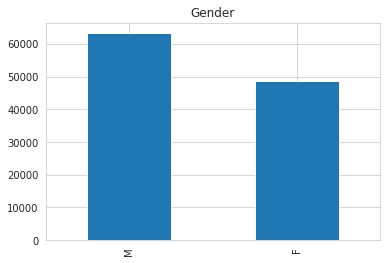

In [ ]:
data['Patient Gender'].value_counts().plot.bar(title='Gender');

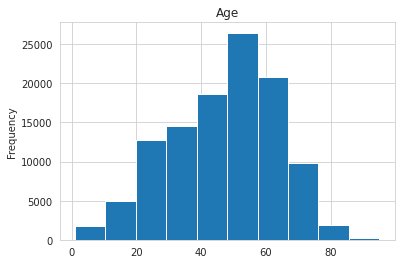

In [ ]:
data['Patient Age'].plot.hist(title='Age');

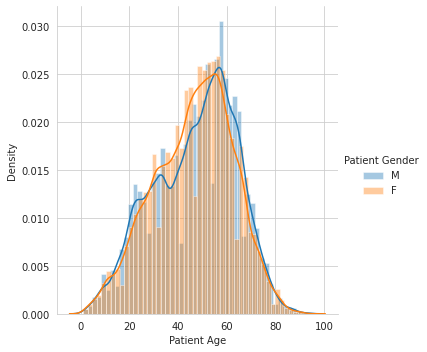

In [ ]:
#plt.figure(figsize=(20,15))
sns.FacetGrid(data,hue='Patient Gender',size=5).map(sns.distplot,'Patient Age').add_legend()
plt.show()
# both genders have similar age distribution

## Disease Counts

In [ ]:
# rows having no. of disease
data['Labels_Count'] = data['Finding Labels'].apply(lambda text: len(text.split('|')) if(text != 'No Finding') else 0)

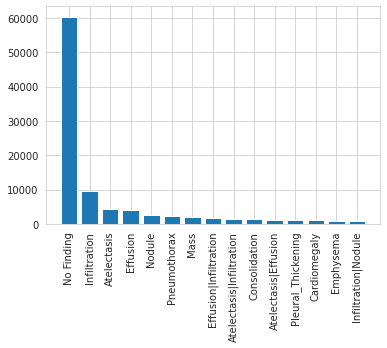

In [ ]:
# count of diseases (includes x-rays with multiple or no findings)
label_counts = data['Finding Labels'].value_counts()[:15]
fig, ax1 = plt.subplots(1,1,figsize = (6, 4))
ax1.bar(np.arange(len(label_counts))+0.5, label_counts)
ax1.set_xticks(np.arange(len(label_counts))+0.5)
_ = ax1.set_xticklabels(label_counts.index, rotation = 90)
# mostly no finding/illness

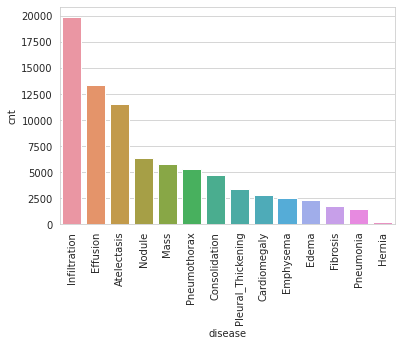

In [ ]:
# count of diseases (parsed out)
disease_cnt = pd.DataFrame(np.sum(data[all_labels]).reset_index())
disease_cnt.columns = ['disease','cnt']
g = sns.barplot(x="disease", y='cnt', data=disease_cnt, 
            order=disease_cnt.sort_values('cnt', ascending=False).disease)
plt.xticks(rotation=90);
# has class imbalance

In [ ]:
ttl_disease_cnt = np.sum(disease_cnt['cnt'])
ttl_msmt_cnt = len(data)*len(all_labels)
pct = ttl_disease_cnt/ttl_msmt_cnt
print(f'% of tests that are positive: {pct:.3f}%')
print(f'% of tests that are negative: {1-pct:.3f}%')
# mainly 0's - sparse

% of tests that are positive: 0.052%
% of tests that are negative: 0.948%


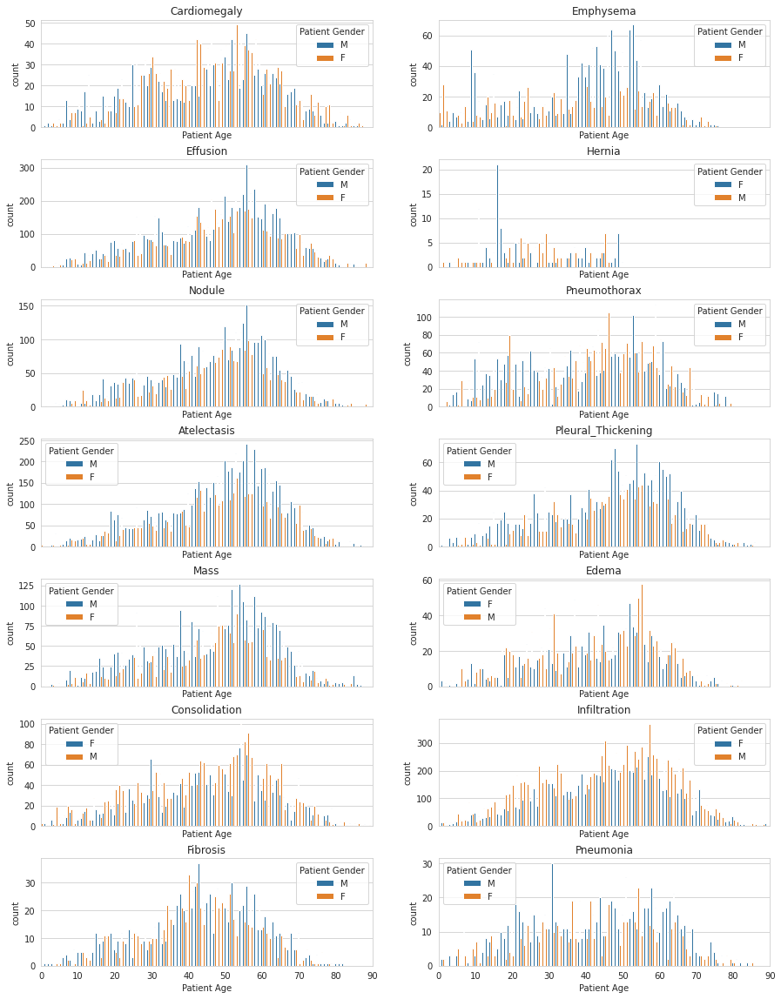

In [ ]:
# disease distribution by age and gender
f, axarr = plt.subplots(7, 2, sharex=True,figsize=(15, 20))
df = data[data['Finding Labels'] != 'No Finding']
i=0
j=0
x=np.arange(0,100,10)
for pathology in pathology_list :
    index = []
    for k in range(len(df)):
        if pathology in df.iloc[k]['Finding Labels']:
            index.append(k)
    g=sns.countplot(x='Patient Age', hue="Patient Gender", data=df.iloc[index], ax=axarr[i, j])
    axarr[i, j].set_title(pathology)   
    g.set_xlim(0,90)
    g.set_xticks(x)
    g.set_xticklabels(x)
    j=(j+1)%2
    if j==0:
        i=(i+1)%7
f.subplots_adjust(hspace=0.3)

## No. of Each Disease by Gender

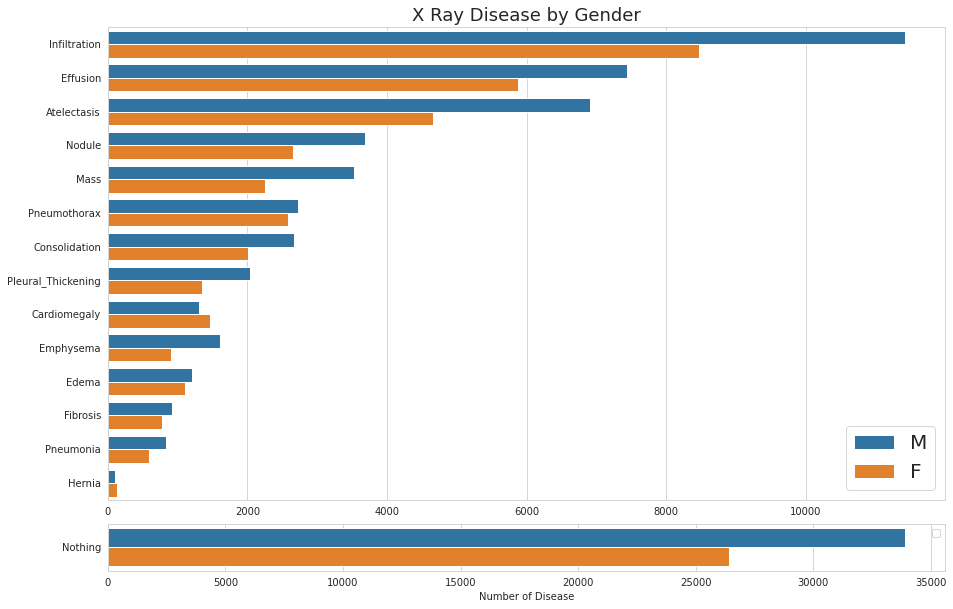

In [ ]:
plt.figure(figsize=(15,10))
gs = gridspec.GridSpec(8,1)
ax1 = plt.subplot(gs[:7, :])
ax2 = plt.subplot(gs[7, :])
data1 = pd.melt(data,
             id_vars=['Patient Gender'],
             value_vars = list(pathology_list),
             var_name = 'Category',
             value_name = 'Count')
data1 = data1.loc[data1.Count>0]
g=sns.countplot(y='Category',hue='Patient Gender',data=data1, ax=ax1, order = data1['Category'].value_counts().index)
ax1.set( ylabel="",xlabel="")
ax1.legend(fontsize=20)
ax1.set_title('X Ray Disease by Gender',fontsize=18);

data['Nothing']=data['Finding Labels'].apply(lambda x: 1 if 'No Finding' in x else 0)

data2 = pd.melt(data,
             id_vars=['Patient Gender'],
             value_vars = list(['Nothing']),
             var_name = 'Category',
             value_name = 'Count')
data2 = data2.loc[data2.Count>0]
g=sns.countplot(y='Category',hue='Patient Gender',data=data2,ax=ax2)
ax2.set( ylabel="",xlabel="Number of Disease")
ax2.legend('')
plt.subplots_adjust(hspace=.5)

## Ratio Between One and Multiple Diseases

In [ ]:
df=data.groupby('Finding Labels').count().sort_values('Patient ID',ascending=False)
df1=df[['|' in index for index in df.index]].copy()
df2=df[['|' not in index for index in df.index]]
df2=df2[['No Finding' not in index for index in df2.index]]
df2['Finding Labels']=df2.index.values
df1['Finding Labels']=df1.index.values

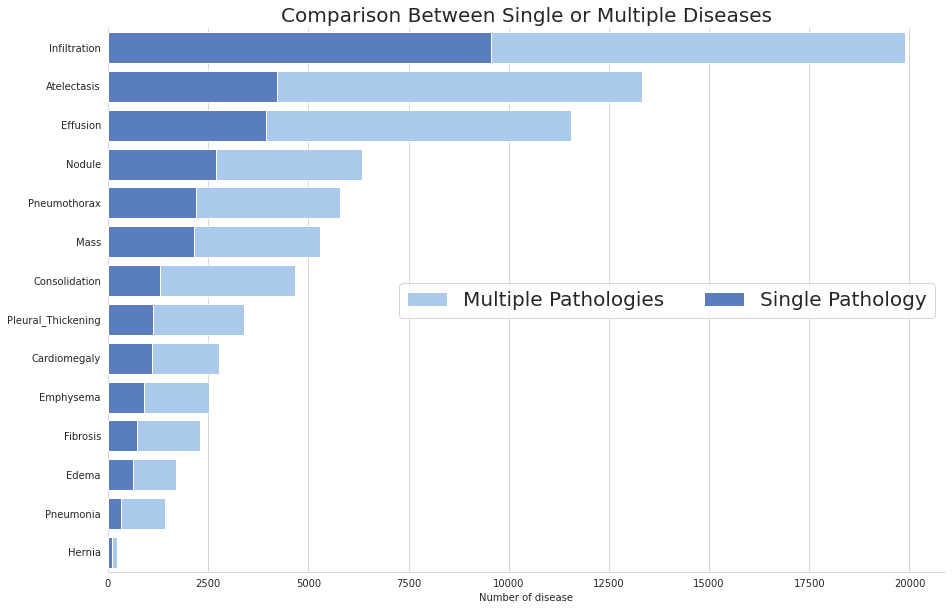

In [ ]:
f, ax = plt.subplots(sharex=True,figsize=(15, 10))
sns.set_color_codes("pastel")
g=sns.countplot(y='Category',data=data1, ax=ax, order = data1['Category'].value_counts().index,color='b',label="Multiple Pathologies")
sns.set_color_codes("muted")
g=sns.barplot(x='Patient ID',y='Finding Labels',data=df2, ax=ax, color="b",label="Single Pathology")
ax.legend(ncol=2, loc="center right", frameon=True,fontsize=20)
ax.set( ylabel="",xlabel="Number of disease")
ax.set_title("Comparison Between Single or Multiple Diseases",fontsize=20)      
sns.despine(left=True)

## Most Important Pathology Groups for Each Disease

In [ ]:
#we just keep groups of pathologies which appear more than 30 times
df3=df1.loc[df1['Patient ID']>30,['Patient ID','Finding Labels']]

for pathology in pathology_list:
    df3[pathology]=df3.apply(lambda x: x['Patient ID'] if pathology in x['Finding Labels'] else 0, axis=1)

df3.head()

,Patient ID,Finding Labels,Cardiomegaly,Emphysema,Effusion,Hernia,Nodule,Pneumothorax,Atelectasis,Pleural_Thickening,Mass,Edema,Consolidation,Infiltration,Fibrosis,Pneumonia
Finding Labels,,,,,,,,,,,,,,,,
Effusion|Infiltration,1603,Effusion|Infiltration,0,0,1603,0,0,0,0,0,0,0,0,1603,0,0
Atelectasis|Infiltration,1350,Atelectasis|Infiltration,0,0,0,0,0,0,1350,0,0,0,0,1350,0,0
Atelectasis|Effusion,1165,Atelectasis|Effusion,0,0,1165,0,0,0,1165,0,0,0,0,0,0,0
Infiltration|Nodule,829,Infiltration|Nodule,0,0,0,0,829,0,0,0,0,0,0,829,0,0
Atelectasis|Effusion|Infiltration,737,Atelectasis|Effusion|Infiltration,0,0,737,0,0,0,737,0,0,0,0,737,0,0


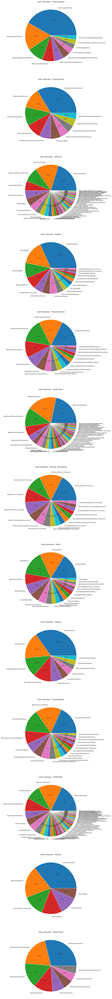

In [ ]:
#'Hernia' has not enough values to figure here
df4=df3[df3['Hernia']>0]  # df4.size == 0
#remove 'Hernia' from list
pat_list=[elem for elem in pathology_list if 'Hernia' not in elem]

f, axarr = plt.subplots(13, sharex=True,figsize=(10, 140))
i=0
for pathology in pat_list :
    df4=df3[df3[pathology]>0]
    if df4.size>0:  #'Hernia' has not enough values to figure here
        axarr[i].pie(df4[pathology],labels=df4['Finding Labels'], autopct='%1.1f%%')
        axarr[i].set_title('main desease : '+pathology,fontsize=14)   
        i +=1

# We can see that some pathologies seem to appear with all kinds of pathology:
# effusion, atelectasis, infiltration

# Data Preprocessing

## Process Data

In [ ]:
# read in file of records
data = pd.read_csv('/content/data/Data_Entry_2017.csv')

# add column with pathname
data_image_paths = {os.path.basename(x): x for x in 
                   glob(os.path.join('/content/data', 'images*', '*', '*.png'))}
print('Scans found:', len(data_image_paths), ', Total Headers', data.shape[0])
data['path'] = data['Image Index'].map(data_image_paths.get)

# convert age to integer
data['Patient Age'] = data['Patient Age'].map(lambda x: int(x))

data.sample(10)

Scans found: 112120 , Total Headers 112120


,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,y],Unnamed: 11,path
88006,00021772_003.png,Atelectasis|Infiltration,3,21772,62,M,AP,3056,2544,0.139,0.139,NaN,/content/data/images_010/images/00021772_003.png
83632,00020516_000.png,Infiltration,0,20516,55,M,PA,2992,2973,0.143,0.143,NaN,/content/data/images_009/images/00020516_000.png
39129,00010260_000.png,No Finding,0,10260,83,M,PA,2992,2991,0.143,0.143,NaN,/content/data/images_005/images/00010260_000.png
84041,00020662_001.png,No Finding,1,20662,27,M,PA,2992,2991,0.143,0.143,NaN,/content/data/images_009/images/00020662_001.png
76686,00018841_000.png,No Finding,0,18841,7,F,PA,2544,3056,0.139,0.139,NaN,/content/data/images_009/images/00018841_000.png
3527,00000955_001.png,No Finding,1,955,32,F,PA,2048,2500,0.171,0.171,NaN,/content/data/images_001/images/00000955_001.png
57192,00014199_000.png,No Finding,0,14199,46,F,PA,2048,2500,0.168,0.168,NaN,/content/data/images_007/images/00014199_000.png
41889,00010796_000.png,No Finding,0,10796,65,M,PA,2450,2991,0.143,0.143,NaN,/content/data/images_005/images/00010796_000.png
42459,00010926_000.png,Atelectasis,0,10926,46,M,PA,2992,2991,0.143,0.143,NaN,/content/data/images_005/images/00010926_000.png
102651,00027362_000.png,Infiltration,0,27362,56,M,PA,2992,2991,0.143,0.143,NaN,/content/data/images_011/images/00027362_000.png


In [ ]:
# Split labels into encoded columns
data['Finding Labels'] = data['Finding Labels'].map(lambda x: x.replace('No Finding', ''))

from itertools import chain
all_labels = np.unique(list(chain(*data['Finding Labels'].map(lambda x: x.split('|')).tolist())))
all_labels = [x for x in all_labels if len(x)>0]
print('All Labels ({}): {}'.format(len(all_labels), all_labels))

for c_label in all_labels:
    if len(c_label)>1: # leave out empty labels
        data[c_label] = data['Finding Labels'].map(lambda finding: 1.0 if c_label in finding else 0)

data.sample(5)

All Labels (14): ['Atelectasis', 'Cardiomegaly', 'Consolidation', 'Edema', 'Effusion', 'Emphysema', 'Fibrosis', 'Hernia', 'Infiltration', 'Mass', 'Nodule', 'Pleural_Thickening', 'Pneumonia', 'Pneumothorax']


,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,...,Effusion,Emphysema,Fibrosis,Hernia,Infiltration,Mass,Nodule,Pleural_Thickening,Pneumonia,Pneumothorax
72241,00017786_012.png,Atelectasis|Effusion,12,17786,51,M,PA,2570,2991,0.143,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
49565,00012582_004.png,Effusion|Mass|Pleural_Thickening,4,12582,76,F,AP,2500,2048,0.168,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
57779,00014319_000.png,,0,14319,68,F,PA,2442,2991,0.143,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
109362,00029745_001.png,,1,29745,46,M,AP,3056,2544,0.139,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
18559,00004922_003.png,,3,4922,61,M,PA,2500,2048,0.168,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Train/Test/Validation Split

In [ ]:
# Split into train/test
from sklearn.model_selection import train_test_split

train_df, test_df = train_test_split(data, 
                                   test_size = 0.20, 
                                   random_state = 2018,
                                   stratify = data['Finding Labels'].map(lambda x: x[:4]))
print('train', train_df.shape[0], 'test', test_df.shape[0])

train 89696 test 22424


In [ ]:
# Split training into train/validation
train_df, valid_df = train_test_split(train_df, 
                                   test_size = 0.10, 
                                   random_state = 2018,
                                   stratify = train_df['Finding Labels'].map(lambda x: x[:4]))
print('train', train_df.shape[0], 'valid', valid_df.shape[0])

train 80726 valid 8970


## Image Generator & Flow from Dataframe

With our dataset splits ready, we can now proceed with setting up our model to consume them.

*   For this we will use the off-the-shelf ImageDataGenerator class from the Keras framework, which allows us to build a "generator" for images specified in a dataframe.
*   This class also provides support for basic data augmentation such as random horizontal flipping of images.
*   We also use the generator to transform the values in each batch so that their mean is  0  and their standard deviation is 1. This will facilitate model training by standardizing the input distribution.

Since it is mainly a matter of reading and understanding Keras documentation, we have implemented the generator for you. There are a few things to note:

*   We normalize the mean and standard deviation of the data
*   We shuffle the input after each epoch.
*   We set the image size to be **128px by 128px

In [ ]:
IMG_SIZE = (128, 128)
core_idg = ImageDataGenerator(samplewise_center=True, 
                              samplewise_std_normalization=True, 
                              horizontal_flip = True, 
                              vertical_flip = False, 
                              height_shift_range= 0.05, 
                              width_shift_range=0.1, 
                              rotation_range=5, 
                              shear_range = 0.1,
                              fill_mode = 'reflect',
                              zoom_range=0.15)

In [ ]:
def flow_from_dataframe(img_data_gen, in_df, path_col, y_col, **dflow_args):
    base_dir = os.path.dirname(in_df[path_col].values[0])
    print('## Ignore next message from keras, values are replaced anyways')
    df_gen = img_data_gen.flow_from_directory(base_dir, 
                                     class_mode = 'sparse',
                                    **dflow_args)
    df_gen.filenames = in_df[path_col].values
    df_gen.classes = np.stack(in_df[y_col].values)
    df_gen.samples = in_df.shape[0]
    df_gen.n = in_df.shape[0]
    df_gen._set_index_array()
    df_gen.directory = '' # since we have the full path
    print('Reinserting dataframe: {} images'.format(in_df.shape[0]))
    return df_gen


In [ ]:
# create column with vector of labels
# this is used as the y_col in flow from dataframe
valid_df['newLabel'] = valid_df.apply(lambda x: x['Finding Labels'].split('|'), axis=1)
train_df['newLabel'] = train_df.apply(lambda x: x['Finding Labels'].split('|'), axis=1)
test_df['newLabel'] = test_df.apply(lambda x: x['Finding Labels'].split('|'), axis=1)

train_gen = core_idg.flow_from_dataframe(dataframe=train_df,
                                         directory=None,
                                         x_col = 'path',
                                         y_col = 'newLabel',
                                         class_mode = 'categorical',
                                         classes = all_labels,
                                         target_size = IMG_SIZE,
                                         color_mode = 'grayscale',
                                         batch_size = 32)

valid_gen = core_idg.flow_from_dataframe(dataframe=valid_df,
                                         directory=None,
                                         x_col = 'path',
                                         y_col = 'newLabel',
                                         class_mode = 'categorical',
                                         classes = all_labels,
                                         target_size = IMG_SIZE,
                                         color_mode = 'grayscale',
                                         batch_size = 256) # we can use much larger batches for evaluation

test_X, test_Y = next(core_idg.flow_from_dataframe(dataframe=test_df,
                                                   directory=None,
                                                   x_col = 'path',
                                                   y_col = 'newLabel',
                                                   class_mode = 'categorical',
                                                   classes = all_labels,
                                                   target_size = IMG_SIZE,
                                                   color_mode = 'grayscale',
                                                   batch_size = 1024))

Found 37266 validated image filenames belonging to 14 classes.
Found 4141 validated image filenames belonging to 14 classes.
Found 10352 validated image filenames belonging to 14 classes.


## Visualize Sample of X-Rays

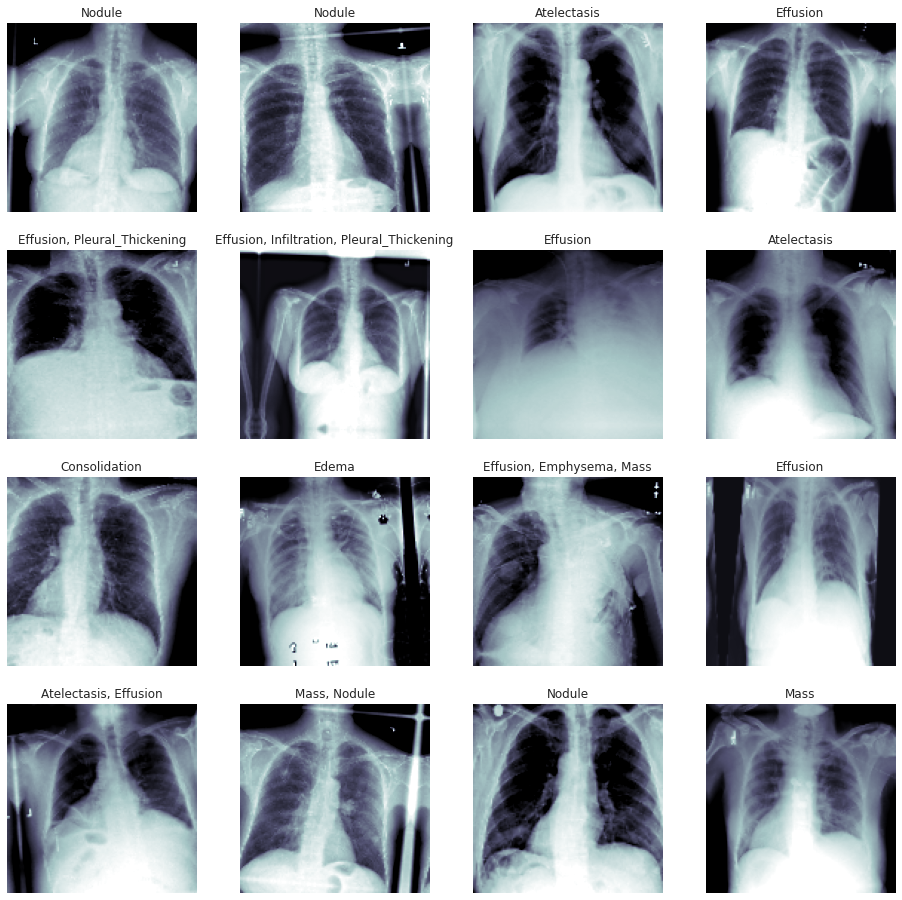

In [ ]:
t_x, t_y = next(train_gen)
fig, m_axs = plt.subplots(4, 4, figsize = (16, 16))
for (c_x, c_y, c_ax) in zip(t_x, t_y, m_axs.flatten()):
    c_ax.imshow(c_x[:,:,0], cmap = 'bone', vmin = -1.5, vmax = 1.5)
    c_ax.set_title(', '.join([n_class for n_class, n_score in zip(all_labels, c_y) 
                             if n_score>0.5]))
    c_ax.axis('off')

# Model 1: CNN 3 layers (no regularization) - Binary Accuracy Stopping

## Build and Compile Model

In [ ]:
model = Sequential()
model.add(layers.Conv2D(filters=32, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu,input_shape=t_x.shape[1:]))
model.add(layers.MaxPool2D((2, 2),strides=2))
model.add(layers.Conv2D(filters=64, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu))
model.add(layers.MaxPool2D(pool_size=(2, 2),strides=2))
model.add(layers.Conv2D(filters=128, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu))
model.add(layers.MaxPool2D(pool_size=(2, 2),strides=2))
model.add(layers.Flatten())
model.add(layers.Dense(units=384, activation=tf.nn.relu))
model.add(layers.Dense(units=len(all_labels), activation='sigmoid'))

model.compile(optimizer = 'adam', loss = 'binary_crossentropy',
              metrics = ['binary_accuracy', keras.metrics.Recall()])

model.summary()

Model: "sequential_37"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_111 (Conv2D)         (None, 126, 126, 32)      320       
                                                                 
 max_pooling2d_111 (MaxPooli  (None, 63, 63, 32)       0         
 ng2D)                                                           
                                                                 
 conv2d_112 (Conv2D)         (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_112 (MaxPooli  (None, 30, 30, 64)       0         
 ng2D)                                                           
                                                                 
 conv2d_113 (Conv2D)         (None, 28, 28, 128)       73856     
                                                                 
 max_pooling2d_113 (MaxPooli  (None, 14, 14, 128)    

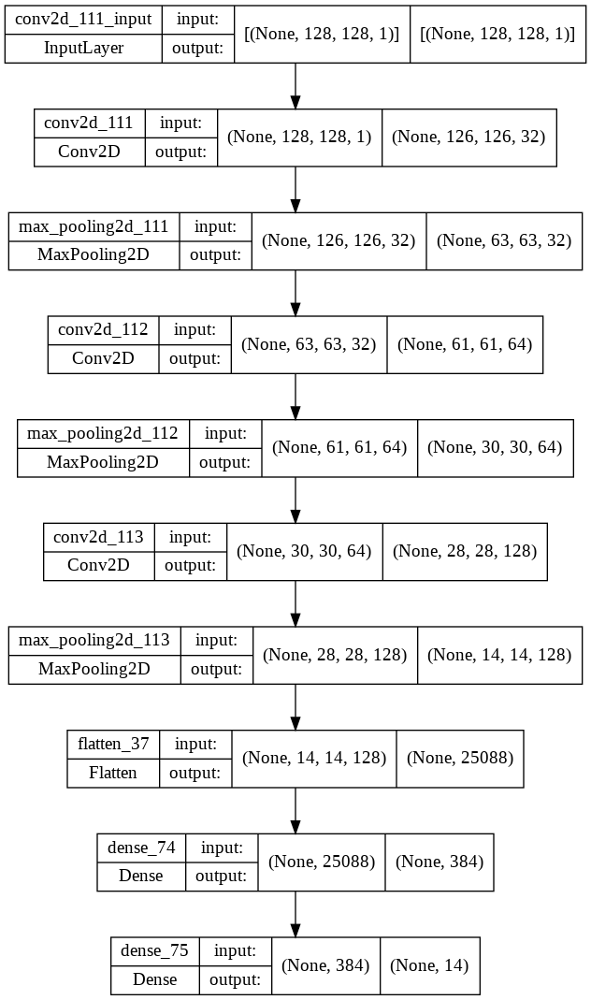

In [ ]:
keras.utils.plot_model(model, "model1.png", show_shapes=True)

## Train Model

In [ ]:
%%time 
history = model.fit_generator(train_gen, 
                              steps_per_epoch=100,
                              validation_data = valid_gen, 
                              epochs = 20,
                              callbacks=[
                                  tf.keras.callbacks.ModelCheckpoint("model1.h5",save_best_only=True,save_weights_only=False),
                                  tf.keras.callbacks.EarlyStopping(monitor='val_binary_accuracy', patience=10)
                              ])

Epoch 1/20
100/100 [==============================] - 126s 1s/step - loss: 0.3147 - binary_accuracy: 0.8831 - recall_20: 0.0258 - val_loss: 0.3041 - val_binary_accuracy: 0.8883 - val_recall_20: 0.0000e+00
Epoch 2/20
100/100 [==============================] - 116s 1s/step - loss: 0.2976 - binary_accuracy: 0.8881 - recall_20: 0.0284 - val_loss: 0.2995 - val_binary_accuracy: 0.8883 - val_recall_20: 4.6325e-04
Epoch 3/20
100/100 [==============================] - 117s 1s/step - loss: 0.3034 - binary_accuracy: 0.8861 - recall_20: 0.0233 - val_loss: 0.2969 - val_binary_accuracy: 0.8882 - val_recall_20: 0.0244
Epoch 4/20
100/100 [==============================] - 116s 1s/step - loss: 0.2969 - binary_accuracy: 0.8880 - recall_20: 0.0309 - val_loss: 0.2985 - val_binary_accuracy: 0.8883 - val_recall_20: 0.0012
Epoch 5/20
100/100 [==============================] - 114s 1s/step - loss: 0.2977 - binary_accuracy: 0.8886 - recall_20: 0.0235 - val_loss: 0.2987 - val_binary_accuracy: 0.8875 - val_recal

## Test Model

In [ ]:
print('test binary accuracy = ', model.evaluate(test_X, test_Y, verbose=0)[1])

test binary accuracy =  0.8925084471702576


## Training & Validation Plots

In [ ]:
history_dict = history.history
history_dict.keys()

dict_keys(['loss', 'binary_accuracy', 'recall_20', 'val_loss', 'val_binary_accuracy', 'val_recall_20'])

In [ ]:
history_df=pd.DataFrame(history_dict)
history_df.tail().round(3)

,loss,binary_accuracy,recall_20,val_loss,val_binary_accuracy,val_recall_20
15,0.294,0.889,0.049,0.294,0.888,0.097
16,0.291,0.889,0.076,0.291,0.889,0.069
17,0.288,0.889,0.069,0.294,0.890,0.052
18,0.291,0.890,0.065,0.292,0.889,0.076
19,0.291,0.888,0.082,0.289,0.890,0.081


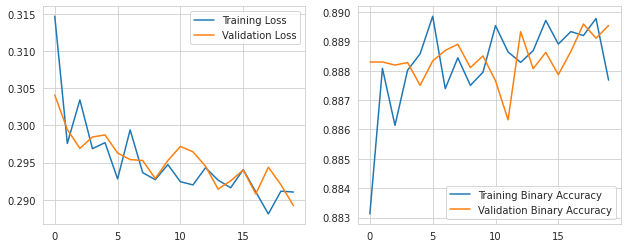

In [ ]:
plot_history(history)

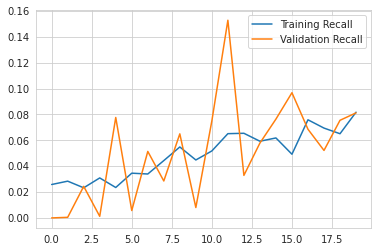

In [ ]:
recall = history.history['recall_20']
val_recall = history.history['val_recall_20']
epochs = len(history.history['loss'])

plt.figure(figsize=(6, 4))
for i, metrics in enumerate(zip([recall], [val_recall],['Recall'])):
  plt.plot(range(epochs), metrics[0], label='Training {}'.format(metrics[2]))
  plt.plot(range(epochs), metrics[1], label='Validation {}'.format(metrics[2]))
  plt.legend()
plt.show()

## ROC Curve & AUC

32/32 [==============================] - 0s 5ms/step


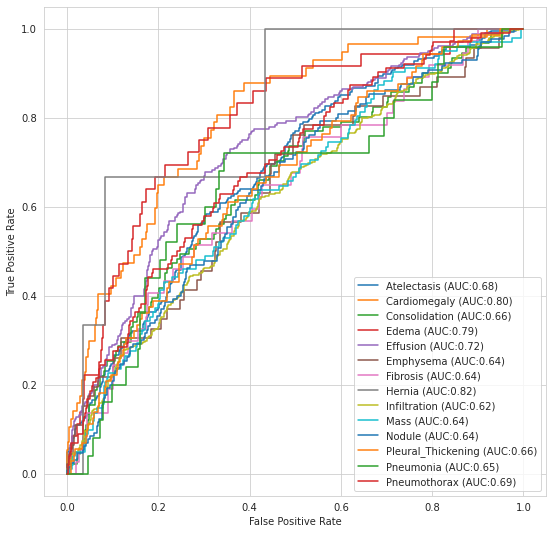

In [ ]:
y_pred = model.predict(test_X, verbose = True)

fig, c_ax = plt.subplots(1,1, figsize = (9, 9))
for (idx, c_label) in enumerate(all_labels):
    fpr, tpr, thresholds = roc_curve(test_Y[:,idx].astype(int), y_pred[:,idx])
    c_ax.plot(fpr, tpr, label = '%s (AUC:%0.2f)'  % (c_label, auc(fpr, tpr)))
c_ax.legend()
c_ax.set_xlabel('False Positive Rate')
c_ax.set_ylabel('True Positive Rate')
fig.savefig('trained_net.png')

# hernia has low sample

In [ ]:
print('roc score = ', roc_auc_score(test_Y.astype(int), y_pred))

roc score =  0.6885808655188949


## Confusion Matrix - 50% Threshold

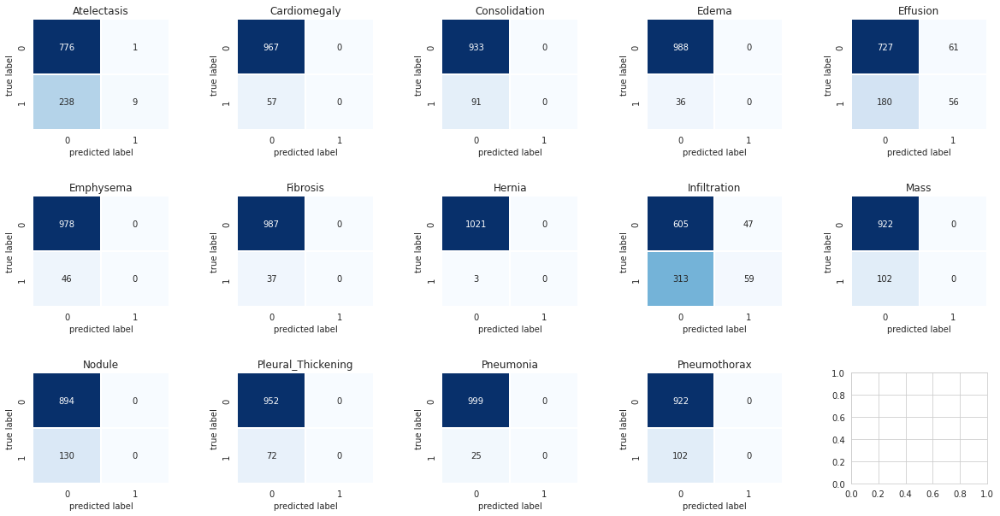

In [ ]:
y_pred_cat = np.where(y_pred > 0.5, 1, 0)

plot_confusion_matrix(test_Y, y_pred_cat)

In [ ]:
print(classification_report(test_Y, y_pred_cat, target_names=all_labels))

                    precision    recall  f1-score   support

       Atelectasis       0.90      0.04      0.07       247
      Cardiomegaly       0.00      0.00      0.00        57
     Consolidation       0.00      0.00      0.00        91
             Edema       0.00      0.00      0.00        36
          Effusion       0.48      0.24      0.32       236
         Emphysema       0.00      0.00      0.00        46
          Fibrosis       0.00      0.00      0.00        37
            Hernia       0.00      0.00      0.00         3
      Infiltration       0.56      0.16      0.25       372
              Mass       0.00      0.00      0.00       102
            Nodule       0.00      0.00      0.00       130
Pleural_Thickening       0.00      0.00      0.00        72
         Pneumonia       0.00      0.00      0.00        25
      Pneumothorax       0.00      0.00      0.00       102

         micro avg       0.53      0.08      0.14      1556
         macro avg       0.14      0.0

## Confusion Matrix - 20% Threshold

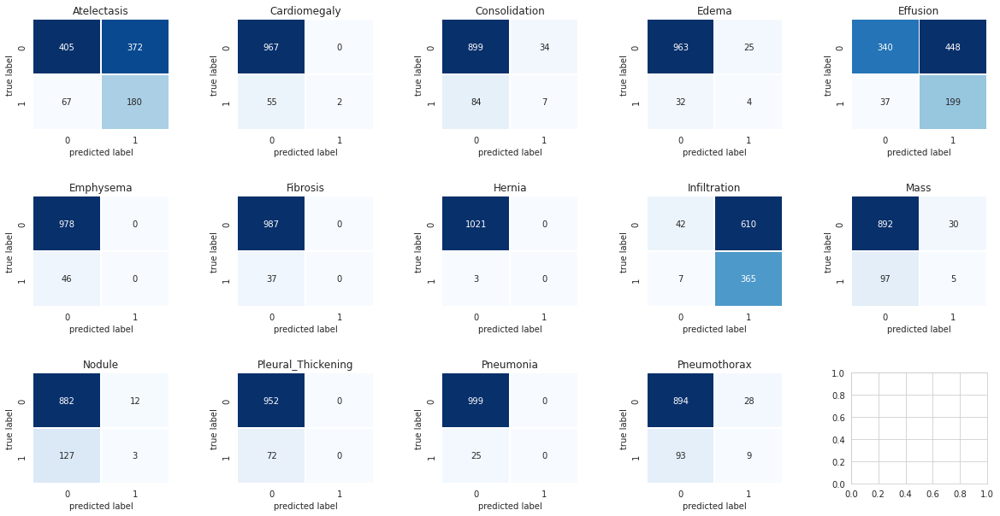

In [ ]:
y_pred_cat = np.where(y_pred > 0.2, 1, 0)

plot_confusion_matrix(test_Y, y_pred_cat)

In [ ]:
print(classification_report(test_Y, y_pred_cat, target_names=all_labels))

                    precision    recall  f1-score   support

       Atelectasis       0.33      0.73      0.45       247
      Cardiomegaly       1.00      0.04      0.07        57
     Consolidation       0.17      0.08      0.11        91
             Edema       0.14      0.11      0.12        36
          Effusion       0.31      0.84      0.45       236
         Emphysema       0.00      0.00      0.00        46
          Fibrosis       0.00      0.00      0.00        37
            Hernia       0.00      0.00      0.00         3
      Infiltration       0.37      0.98      0.54       372
              Mass       0.14      0.05      0.07       102
            Nodule       0.20      0.02      0.04       130
Pleural_Thickening       0.00      0.00      0.00        72
         Pneumonia       0.00      0.00      0.00        25
      Pneumothorax       0.24      0.09      0.13       102

         micro avg       0.33      0.50      0.40      1556
         macro avg       0.21      0.2

## Sample Predictions

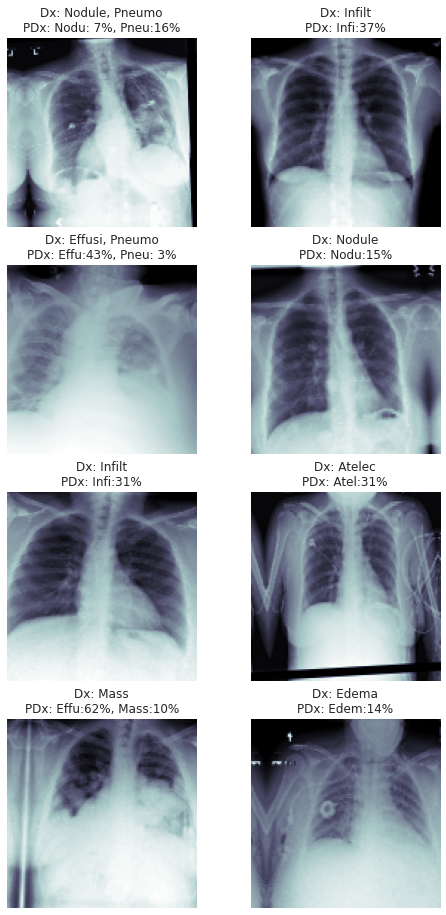

In [ ]:
# Show a few images and associated predictions
# https://www.kaggle.com/code/shrikantds/cnn-in-nih-dataset

sickest_idx = np.argsort(np.sum(test_Y, 1)<1)
fig, m_axs = plt.subplots(4, 2, figsize = (8, 16))
for (idx, c_ax) in zip(sickest_idx, m_axs.flatten()):
    c_ax.imshow(test_X[idx, :,:,0], cmap = 'bone')
    stat_str = [n_class[:6] for n_class, n_score in zip(all_labels, test_Y[idx]) if n_score>0.5]
    pred_str = ['%s:%2.0f%%' % (n_class[:4], p_score*100)  for n_class, n_score, p_score in zip(all_labels,
                                                                                                test_Y[idx], y_pred[idx]) 
    if (n_score>0.5) or (p_score>0.5)]
    c_ax.set_title('Dx: '+', '.join(stat_str)+'\nPDx: '+', '.join(pred_str))
    c_ax.axis('off')
fig.savefig('trained_img_predictions.png')


# Model 2: CNN 3 layers (no regularization) - Recall Stopping

## Build and Compile Model

In [ ]:
model = Sequential()
model.add(layers.Conv2D(filters=32, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu,input_shape=t_x.shape[1:]))
model.add(layers.MaxPool2D((2, 2),strides=2))
model.add(layers.Conv2D(filters=64, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu))
model.add(layers.MaxPool2D(pool_size=(2, 2),strides=2))
model.add(layers.Conv2D(filters=128, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu))
model.add(layers.MaxPool2D(pool_size=(2, 2),strides=2))
model.add(layers.Flatten())
model.add(layers.Dense(units=384, activation=tf.nn.relu))
model.add(layers.Dense(units=len(all_labels), activation='sigmoid'))

model.compile(optimizer = 'adam', loss = 'binary_crossentropy',
              metrics = ['binary_accuracy', keras.metrics.Recall()])

model.summary()

Model: "sequential_39"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_117 (Conv2D)         (None, 126, 126, 32)      320       
                                                                 
 max_pooling2d_117 (MaxPooli  (None, 63, 63, 32)       0         
 ng2D)                                                           
                                                                 
 conv2d_118 (Conv2D)         (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_118 (MaxPooli  (None, 30, 30, 64)       0         
 ng2D)                                                           
                                                                 
 conv2d_119 (Conv2D)         (None, 28, 28, 128)       73856     
                                                                 
 max_pooling2d_119 (MaxPooli  (None, 14, 14, 128)    

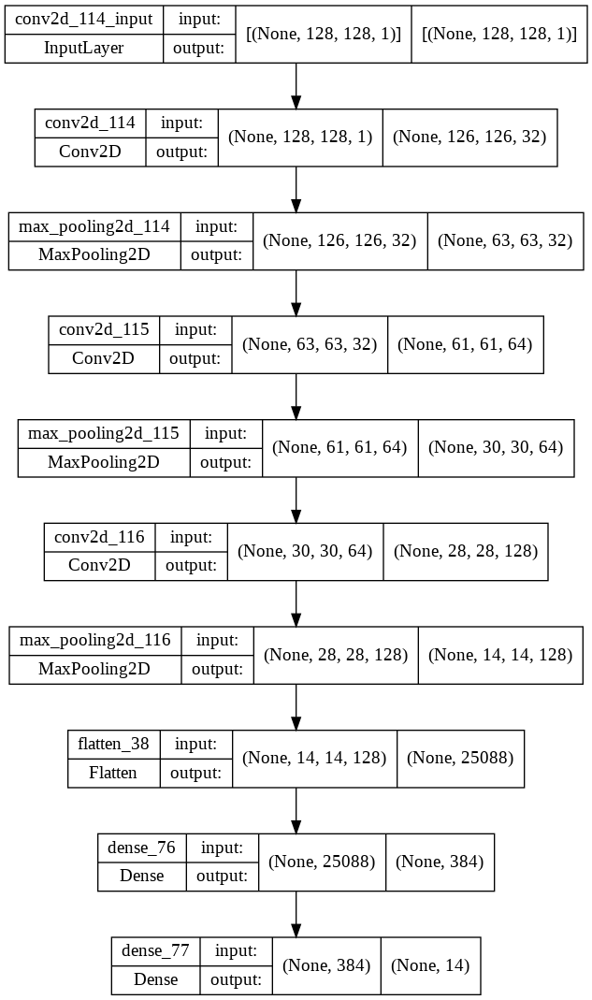

In [ ]:
keras.utils.plot_model(model, "model2.png", show_shapes=True)

## Train Model

In [ ]:
%%time 
history = model.fit_generator(train_gen, 
                              steps_per_epoch=100,
                              validation_data = valid_gen, 
                              epochs = 20,
                              callbacks=[
                                  tf.keras.callbacks.ModelCheckpoint("model2.h5",save_best_only=True,save_weights_only=False),
                                  tf.keras.callbacks.EarlyStopping(monitor='val_recall_22', patience=10, mode='max')
                              ])

Epoch 1/20
100/100 [==============================] - 125s 1s/step - loss: 0.3141 - binary_accuracy: 0.8795 - recall_22: 0.0336 - val_loss: 0.3039 - val_binary_accuracy: 0.8882 - val_recall_22: 1.5442e-04
Epoch 2/20
100/100 [==============================] - 137s 1s/step - loss: 0.3027 - binary_accuracy: 0.8855 - recall_22: 0.0343 - val_loss: 0.2983 - val_binary_accuracy: 0.8884 - val_recall_22: 0.0019
Epoch 3/20
100/100 [==============================] - 117s 1s/step - loss: 0.2965 - binary_accuracy: 0.8881 - recall_22: 0.0281 - val_loss: 0.2971 - val_binary_accuracy: 0.8872 - val_recall_22: 0.0649
Epoch 4/20
100/100 [==============================] - 114s 1s/step - loss: 0.2964 - binary_accuracy: 0.8874 - recall_22: 0.0499 - val_loss: 0.3001 - val_binary_accuracy: 0.8883 - val_recall_22: 0.0491
Epoch 5/20
100/100 [==============================] - 115s 1s/step - loss: 0.2966 - binary_accuracy: 0.8878 - recall_22: 0.0386 - val_loss: 0.2970 - val_binary_accuracy: 0.8879 - val_recall_22

## Test Model

In [ ]:
print('test binary accuracy = ', model.evaluate(test_X, test_Y, verbose=0)[1])

test binary accuracy =  0.8923688530921936


## Training & Validation Plots

In [ ]:
history_dict = history.history
history_dict.keys()

dict_keys(['loss', 'binary_accuracy', 'recall_22', 'val_loss', 'val_binary_accuracy', 'val_recall_22'])

In [ ]:
history_df=pd.DataFrame(history_dict)
history_df.tail().round(3)

,loss,binary_accuracy,recall_22,val_loss,val_binary_accuracy,val_recall_22
15,0.290,0.888,0.089,0.291,0.890,0.051
16,0.292,0.888,0.079,0.295,0.889,0.053
17,0.286,0.892,0.069,0.293,0.889,0.039
18,0.293,0.890,0.063,0.291,0.889,0.073
19,0.291,0.888,0.084,0.289,0.889,0.050


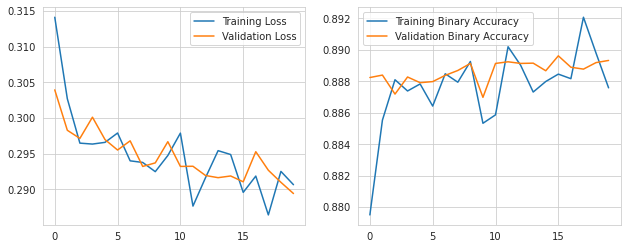

In [ ]:
plot_history(history)

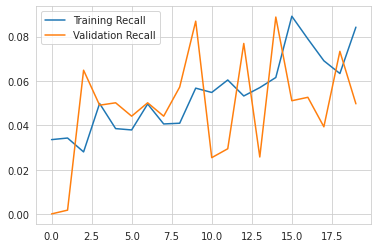

In [ ]:
recall = history.history['recall_22']
val_recall = history.history['val_recall_22']
epochs = len(history.history['loss'])

plt.figure(figsize=(6, 4))
for i, metrics in enumerate(zip([recall], [val_recall],['Recall'])):
  plt.plot(range(epochs), metrics[0], label='Training {}'.format(metrics[2]))
  plt.plot(range(epochs), metrics[1], label='Validation {}'.format(metrics[2]))
  plt.legend()
plt.show()

## ROC Curve & AUC

32/32 [==============================] - 0s 5ms/step


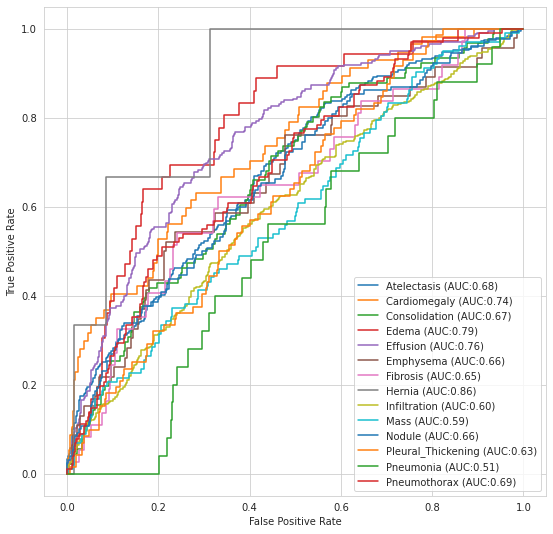

In [ ]:
y_pred = model.predict(test_X, verbose = True)

fig, c_ax = plt.subplots(1,1, figsize = (9, 9))
for (idx, c_label) in enumerate(all_labels):
    fpr, tpr, thresholds = roc_curve(test_Y[:,idx].astype(int), y_pred[:,idx])
    c_ax.plot(fpr, tpr, label = '%s (AUC:%0.2f)'  % (c_label, auc(fpr, tpr)))
c_ax.legend()
c_ax.set_xlabel('False Positive Rate')
c_ax.set_ylabel('True Positive Rate')
fig.savefig('trained_net.png')

# hernia has low sample

In [ ]:
print('roc score = ', roc_auc_score(test_Y.astype(int), y_pred))

roc score =  0.6757978932964326


## Confusion Matrix - 50% Threshold

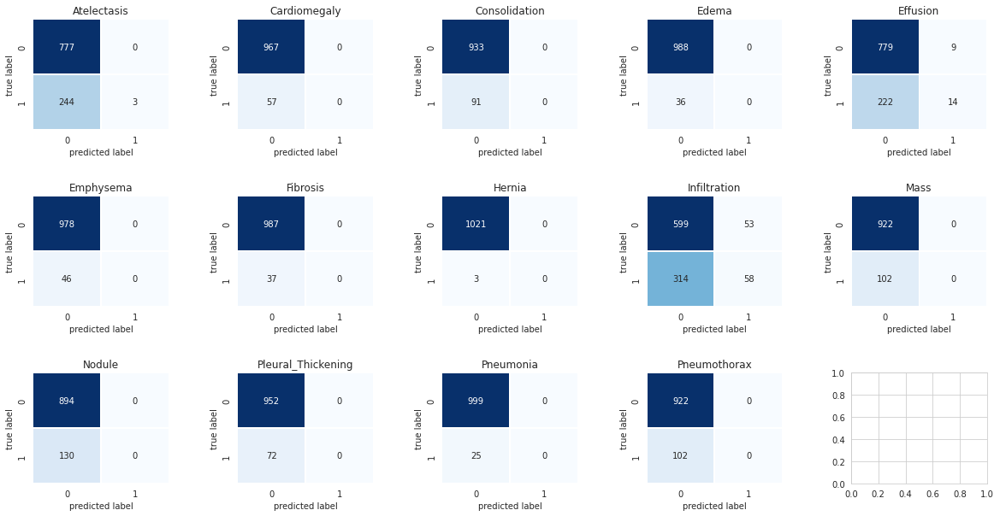

In [ ]:
y_pred_cat = np.where(y_pred > 0.5, 1, 0)

plot_confusion_matrix(test_Y, y_pred_cat)

In [ ]:
print(classification_report(test_Y, y_pred_cat, target_names=all_labels))

                    precision    recall  f1-score   support

       Atelectasis       1.00      0.01      0.02       247
      Cardiomegaly       0.00      0.00      0.00        57
     Consolidation       0.00      0.00      0.00        91
             Edema       0.00      0.00      0.00        36
          Effusion       0.61      0.06      0.11       236
         Emphysema       0.00      0.00      0.00        46
          Fibrosis       0.00      0.00      0.00        37
            Hernia       0.00      0.00      0.00         3
      Infiltration       0.52      0.16      0.24       372
              Mass       0.00      0.00      0.00       102
            Nodule       0.00      0.00      0.00       130
Pleural_Thickening       0.00      0.00      0.00        72
         Pneumonia       0.00      0.00      0.00        25
      Pneumothorax       0.00      0.00      0.00       102

         micro avg       0.55      0.05      0.09      1556
         macro avg       0.15      0.0

## Confusion Matrix - 20% Threshold

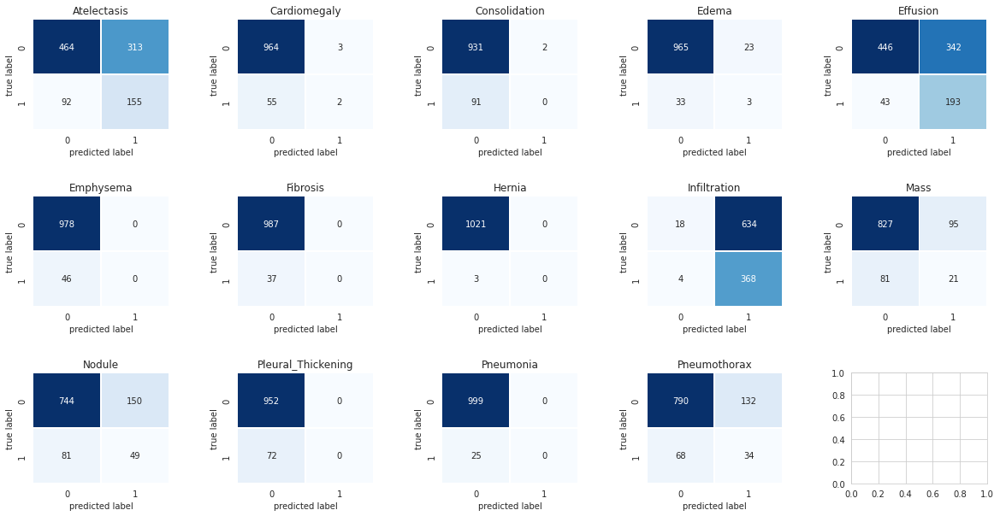

In [ ]:
y_pred_cat = np.where(y_pred > 0.2, 1, 0)

plot_confusion_matrix(test_Y, y_pred_cat)

In [ ]:
print(classification_report(test_Y, y_pred_cat, target_names=all_labels))

                    precision    recall  f1-score   support

       Atelectasis       0.33      0.63      0.43       247
      Cardiomegaly       0.40      0.04      0.06        57
     Consolidation       0.00      0.00      0.00        91
             Edema       0.12      0.08      0.10        36
          Effusion       0.36      0.82      0.50       236
         Emphysema       0.00      0.00      0.00        46
          Fibrosis       0.00      0.00      0.00        37
            Hernia       0.00      0.00      0.00         3
      Infiltration       0.37      0.99      0.54       372
              Mass       0.18      0.21      0.19       102
            Nodule       0.25      0.38      0.30       130
Pleural_Thickening       0.00      0.00      0.00        72
         Pneumonia       0.00      0.00      0.00        25
      Pneumothorax       0.20      0.33      0.25       102

         micro avg       0.33      0.53      0.40      1556
         macro avg       0.16      0.2

## Sample Predictions

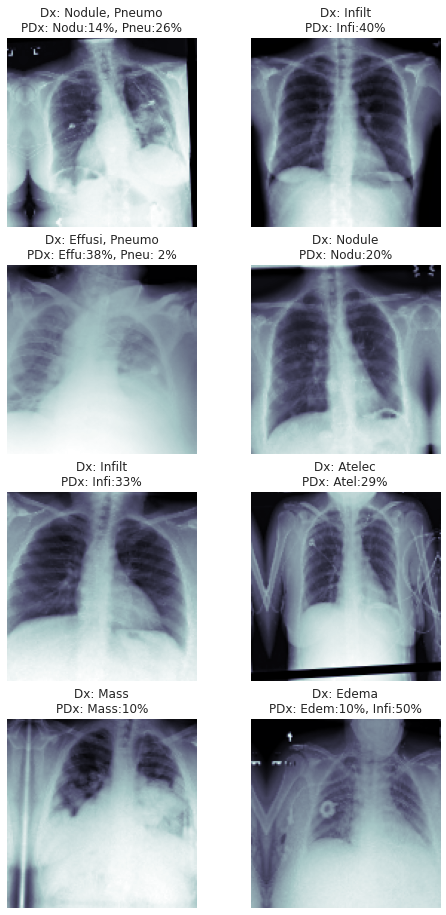

In [ ]:
# Show a few images and associated predictions
# https://www.kaggle.com/code/shrikantds/cnn-in-nih-dataset

sickest_idx = np.argsort(np.sum(test_Y, 1)<1)
fig, m_axs = plt.subplots(4, 2, figsize = (8, 16))
for (idx, c_ax) in zip(sickest_idx, m_axs.flatten()):
    c_ax.imshow(test_X[idx, :,:,0], cmap = 'bone')
    stat_str = [n_class[:6] for n_class, n_score in zip(all_labels, test_Y[idx]) if n_score>0.5]
    pred_str = ['%s:%2.0f%%' % (n_class[:4], p_score*100)  for n_class, n_score, p_score in zip(all_labels,
                                                                                                test_Y[idx], y_pred[idx]) 
    if (n_score>0.5) or (p_score>0.5)]
    c_ax.set_title('Dx: '+', '.join(stat_str)+'\nPDx: '+', '.join(pred_str))
    c_ax.axis('off')
fig.savefig('trained_img_predictions.png')


# Image Generator & Flow from Dataframe - Batch Size 64

In [ ]:
train_gen = core_idg.flow_from_dataframe(dataframe=train_df,
                                         directory=None,
                                         x_col = 'path',
                                         y_col = 'newLabel',
                                         class_mode = 'categorical',
                                         classes = all_labels,
                                         target_size = IMG_SIZE,
                                         color_mode = 'grayscale',
                                         batch_size = 64)

valid_gen = core_idg.flow_from_dataframe(dataframe=valid_df,
                                         directory=None,
                                         x_col = 'path',
                                         y_col = 'newLabel',
                                         class_mode = 'categorical',
                                         classes = all_labels,
                                         target_size = IMG_SIZE,
                                         color_mode = 'grayscale',
                                         batch_size = 256) # we can use much larger batches for evaluation

test_X, test_Y = next(core_idg.flow_from_dataframe(dataframe=test_df,
                                                   directory=None,
                                                   x_col = 'path',
                                                   y_col = 'newLabel',
                                                   class_mode = 'categorical',
                                                   classes = all_labels,
                                                   target_size = IMG_SIZE,
                                                   color_mode = 'grayscale',
                                                   batch_size = 1024))

Found 37266 validated image filenames belonging to 14 classes.
Found 4141 validated image filenames belonging to 14 classes.
Found 10352 validated image filenames belonging to 14 classes.


# Model 3: CNN 3 layers (no regularization) - 64 Batch Size, Binary Accuracy

## Build and Compile Model

In [ ]:
model = Sequential()
model.add(layers.Conv2D(filters=32, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu,input_shape=t_x.shape[1:]))
model.add(layers.MaxPool2D((2, 2),strides=2))
model.add(layers.Conv2D(filters=64, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu))
model.add(layers.MaxPool2D(pool_size=(2, 2),strides=2))
model.add(layers.Conv2D(filters=128, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu))
model.add(layers.MaxPool2D(pool_size=(2, 2),strides=2))
model.add(layers.Flatten())
model.add(layers.Dense(units=384, activation=tf.nn.relu))
model.add(layers.Dense(units=len(all_labels), activation='sigmoid'))

model.compile(optimizer = 'adam', loss = 'binary_crossentropy',
              metrics = ['binary_accuracy', keras.metrics.Recall()])

model.summary()

Model: "sequential_35"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_105 (Conv2D)         (None, 126, 126, 32)      320       
                                                                 
 max_pooling2d_105 (MaxPooli  (None, 63, 63, 32)       0         
 ng2D)                                                           
                                                                 
 conv2d_106 (Conv2D)         (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_106 (MaxPooli  (None, 30, 30, 64)       0         
 ng2D)                                                           
                                                                 
 conv2d_107 (Conv2D)         (None, 28, 28, 128)       73856     
                                                                 
 max_pooling2d_107 (MaxPooli  (None, 14, 14, 128)    

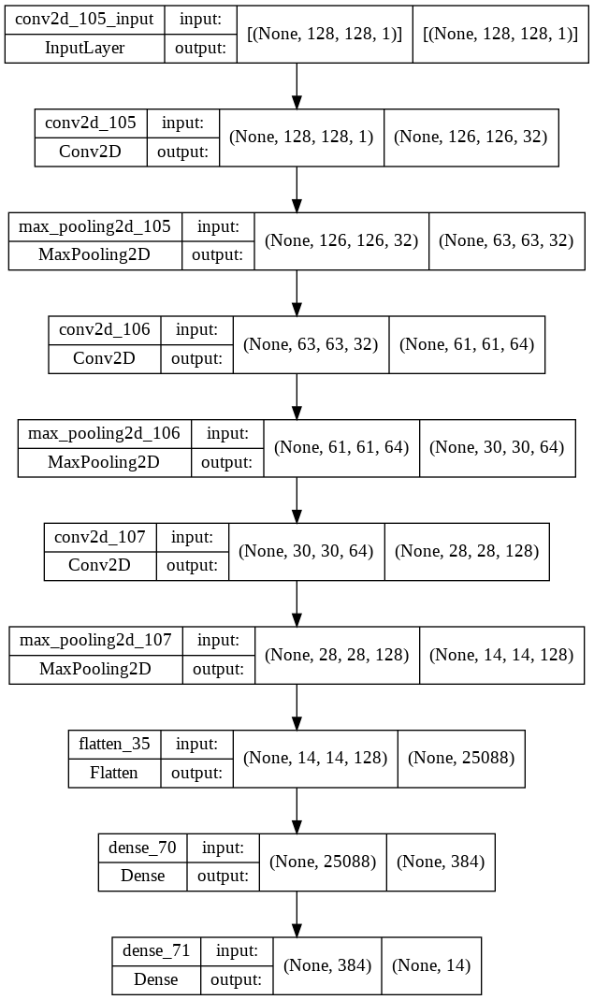

In [ ]:
keras.utils.plot_model(model, "model3.png", show_shapes=True)

## Train Model

In [ ]:
%%time 
history = model.fit_generator(train_gen, 
                              steps_per_epoch=100,
                              validation_data = valid_gen, 
                              epochs = 20,
                              callbacks=[
                                  tf.keras.callbacks.ModelCheckpoint("model3.h5",save_best_only=True,save_weights_only=False),
                                  tf.keras.callbacks.EarlyStopping(monitor='val_binary_accuracy', patience=10)
                              ])

Epoch 1/20
100/100 [==============================] - 191s 2s/step - loss: 0.3066 - binary_accuracy: 0.8826 - recall_18: 0.0261 - val_loss: 0.3004 - val_binary_accuracy: 0.8878 - val_recall_18: 0.0164
Epoch 2/20
100/100 [==============================] - 191s 2s/step - loss: 0.2999 - binary_accuracy: 0.8871 - recall_18: 0.0253 - val_loss: 0.3032 - val_binary_accuracy: 0.8880 - val_recall_18: 0.0193
Epoch 3/20
100/100 [==============================] - 201s 2s/step - loss: 0.2992 - binary_accuracy: 0.8873 - recall_18: 0.0261 - val_loss: 0.2995 - val_binary_accuracy: 0.8837 - val_recall_18: 0.1391
Epoch 4/20
100/100 [==============================] - 185s 2s/step - loss: 0.2978 - binary_accuracy: 0.8872 - recall_18: 0.0371 - val_loss: 0.2951 - val_binary_accuracy: 0.8889 - val_recall_18: 0.0477
Epoch 5/20
100/100 [==============================] - 215s 2s/step - loss: 0.2942 - binary_accuracy: 0.8887 - recall_18: 0.0422 - val_loss: 0.2935 - val_binary_accuracy: 0.8888 - val_recall_18: 0.

## Test Model

In [ ]:
print('test binary accuracy = ', model.evaluate(test_X, test_Y, verbose=0)[1])

test binary accuracy =  0.892159640789032


## Training & Validation Plots

In [ ]:
history_dict = history.history
history_dict.keys()

dict_keys(['loss', 'binary_accuracy', 'recall_18', 'val_loss', 'val_binary_accuracy', 'val_recall_18'])

In [ ]:
history_df=pd.DataFrame(history_dict)
history_df.tail().round(3)

,loss,binary_accuracy,recall_18,val_loss,val_binary_accuracy,val_recall_18
15,0.285,0.891,0.102,0.287,0.891,0.077
16,0.285,0.890,0.087,0.286,0.891,0.082
17,0.284,0.891,0.090,0.287,0.889,0.083
18,0.282,0.891,0.088,0.284,0.890,0.101
19,0.282,0.891,0.109,0.285,0.891,0.076


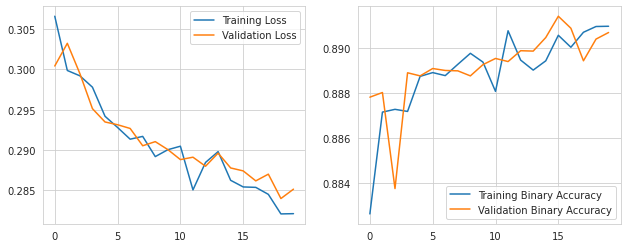

In [ ]:
plot_history(history)

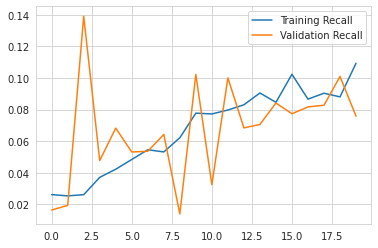

In [ ]:
recall = history.history['recall_18']
val_recall = history.history['val_recall_18']
epochs = len(history.history['loss'])

plt.figure(figsize=(6, 4))
for i, metrics in enumerate(zip([recall], [val_recall],['Recall'])):
  plt.plot(range(epochs), metrics[0], label='Training {}'.format(metrics[2]))
  plt.plot(range(epochs), metrics[1], label='Validation {}'.format(metrics[2]))
  plt.legend()
plt.show()

## ROC Curve & AUC

32/32 [==============================] - 0s 5ms/step


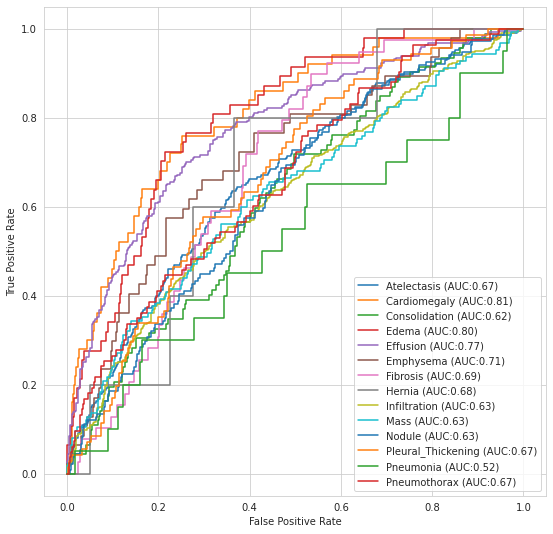

In [ ]:
y_pred = model.predict(test_X, verbose = True)

fig, c_ax = plt.subplots(1,1, figsize = (9, 9))
for (idx, c_label) in enumerate(all_labels):
    fpr, tpr, thresholds = roc_curve(test_Y[:,idx].astype(int), y_pred[:,idx])
    c_ax.plot(fpr, tpr, label = '%s (AUC:%0.2f)'  % (c_label, auc(fpr, tpr)))
c_ax.legend()
c_ax.set_xlabel('False Positive Rate')
c_ax.set_ylabel('True Positive Rate')
fig.savefig('trained_net.png')

# hernia has low sample

In [ ]:
print('roc score = ', roc_auc_score(test_Y.astype(int), y_pred))

roc score =  0.6781982351428567


## Confusion Matrix - 50% Threshold

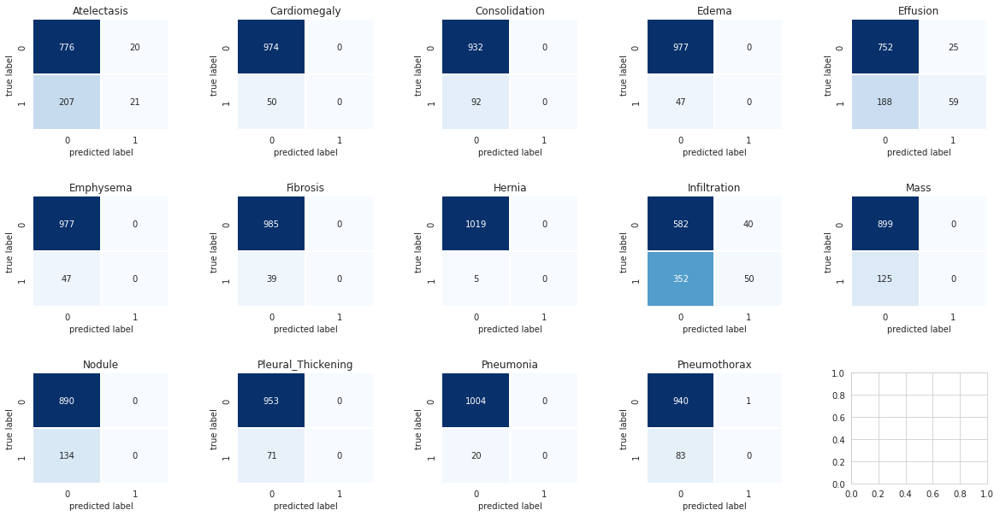

In [ ]:
y_pred_cat = np.where(y_pred > 0.5, 1, 0)

plot_confusion_matrix(test_Y, y_pred_cat)

In [ ]:
print(classification_report(test_Y, y_pred_cat, target_names=all_labels))

                    precision    recall  f1-score   support

       Atelectasis       0.51      0.09      0.16       228
      Cardiomegaly       0.00      0.00      0.00        50
     Consolidation       0.00      0.00      0.00        92
             Edema       0.00      0.00      0.00        47
          Effusion       0.70      0.24      0.36       247
         Emphysema       0.00      0.00      0.00        47
          Fibrosis       0.00      0.00      0.00        39
            Hernia       0.00      0.00      0.00         5
      Infiltration       0.56      0.12      0.20       402
              Mass       0.00      0.00      0.00       125
            Nodule       0.00      0.00      0.00       134
Pleural_Thickening       0.00      0.00      0.00        71
         Pneumonia       0.00      0.00      0.00        20
      Pneumothorax       0.00      0.00      0.00        83

         micro avg       0.60      0.08      0.14      1590
         macro avg       0.13      0.0

## Confusion Matrix - 20% Threshold

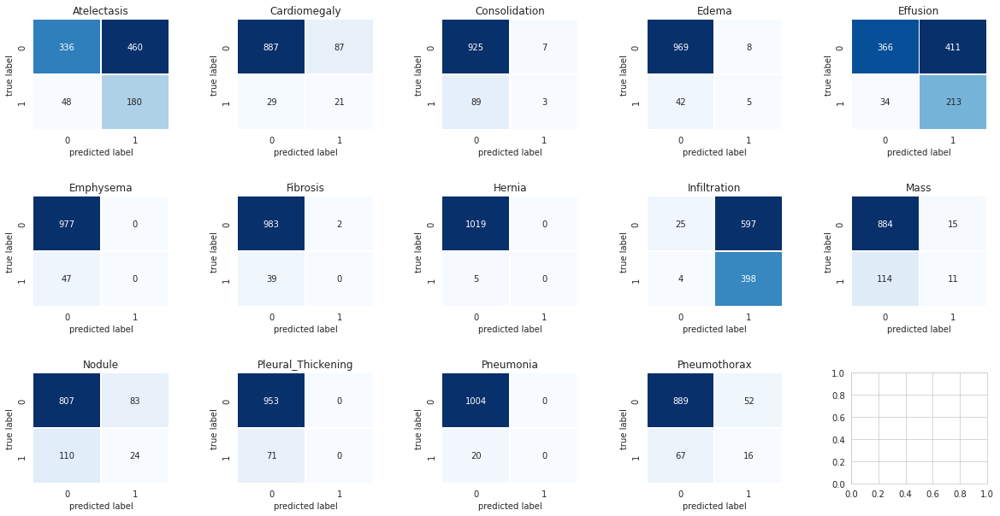

In [ ]:
y_pred_cat = np.where(y_pred > 0.2, 1, 0)

plot_confusion_matrix(test_Y, y_pred_cat)

In [ ]:
print(classification_report(test_Y, y_pred_cat, target_names=all_labels))

                    precision    recall  f1-score   support

       Atelectasis       0.28      0.79      0.41       228
      Cardiomegaly       0.19      0.42      0.27        50
     Consolidation       0.30      0.03      0.06        92
             Edema       0.38      0.11      0.17        47
          Effusion       0.34      0.86      0.49       247
         Emphysema       0.00      0.00      0.00        47
          Fibrosis       0.00      0.00      0.00        39
            Hernia       0.00      0.00      0.00         5
      Infiltration       0.40      0.99      0.57       402
              Mass       0.42      0.09      0.15       125
            Nodule       0.22      0.18      0.20       134
Pleural_Thickening       0.00      0.00      0.00        71
         Pneumonia       0.00      0.00      0.00        20
      Pneumothorax       0.24      0.19      0.21        83

         micro avg       0.34      0.55      0.42      1590
         macro avg       0.20      0.2

## Sample Predictions

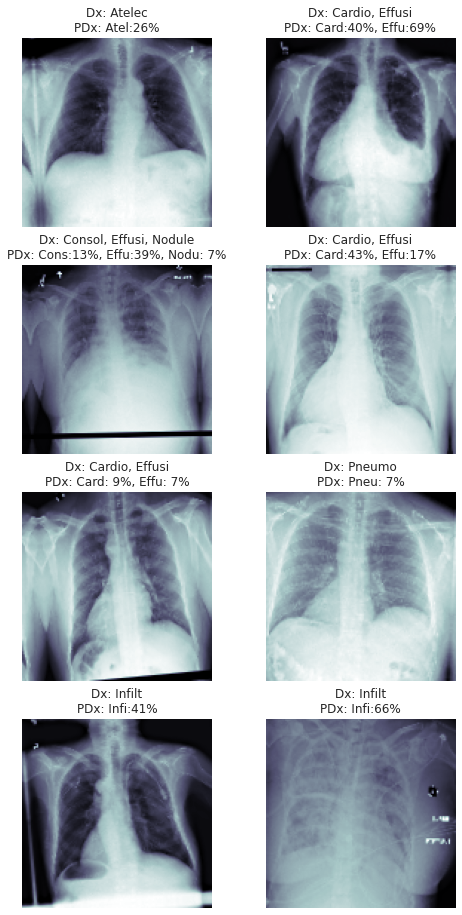

In [ ]:
# Show a few images and associated predictions
# https://www.kaggle.com/code/shrikantds/cnn-in-nih-dataset

sickest_idx = np.argsort(np.sum(test_Y, 1)<1)
fig, m_axs = plt.subplots(4, 2, figsize = (8, 16))
for (idx, c_ax) in zip(sickest_idx, m_axs.flatten()):
    c_ax.imshow(test_X[idx, :,:,0], cmap = 'bone')
    stat_str = [n_class[:6] for n_class, n_score in zip(all_labels, test_Y[idx]) if n_score>0.5]
    pred_str = ['%s:%2.0f%%' % (n_class[:4], p_score*100)  for n_class, n_score, p_score in zip(all_labels,
                                                                                                test_Y[idx], y_pred[idx]) 
    if (n_score>0.5) or (p_score>0.5)]
    c_ax.set_title('Dx: '+', '.join(stat_str)+'\nPDx: '+', '.join(pred_str))
    c_ax.axis('off')
fig.savefig('trained_img_predictions.png')

# Model 4: CNN 3 layers (no regularization) - 64 Batch Size, Recall

## Build and Compile Model

In [ ]:
model = Sequential()
model.add(layers.Conv2D(filters=32, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu,input_shape=t_x.shape[1:]))
model.add(layers.MaxPool2D((2, 2),strides=2))
model.add(layers.Conv2D(filters=64, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu))
model.add(layers.MaxPool2D(pool_size=(2, 2),strides=2))
model.add(layers.Conv2D(filters=128, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu))
model.add(layers.MaxPool2D(pool_size=(2, 2),strides=2))
model.add(layers.Flatten())
model.add(layers.Dense(units=384, activation=tf.nn.relu))
model.add(layers.Dense(units=len(all_labels), activation='sigmoid'))

model.compile(optimizer = 'adam', loss = 'binary_crossentropy',
              metrics = ['binary_accuracy', keras.metrics.Recall()])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 32)      320       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 63, 63, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 30, 30, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 28, 28, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 14, 14, 128)      0

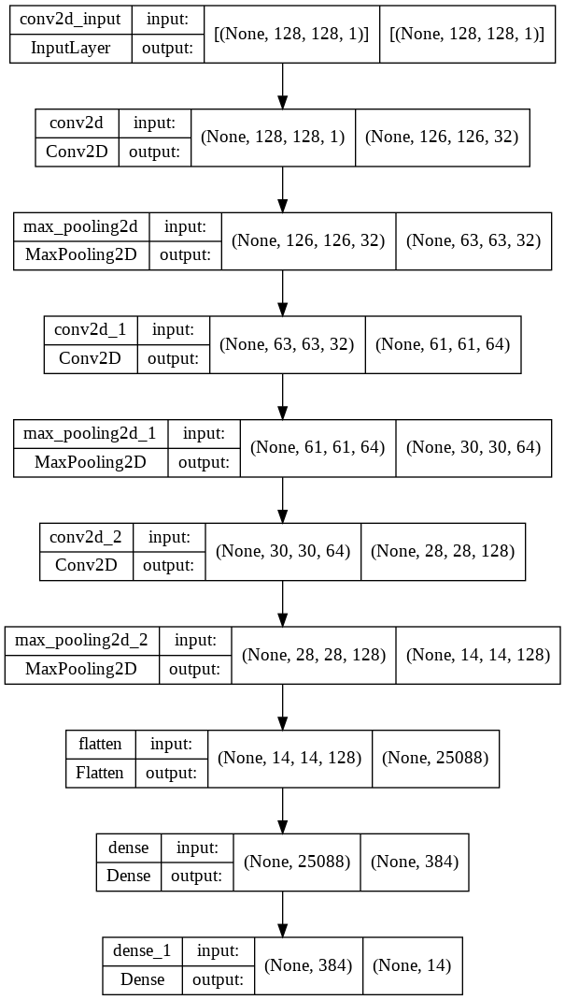

In [ ]:
keras.utils.plot_model(model, "model4.png", show_shapes=True)

## Train Model

In [ ]:
%%time 
history = model.fit_generator(train_gen, 
                              steps_per_epoch=100,
                              validation_data = valid_gen, 
                              epochs = 20,
                              callbacks=[
                                  tf.keras.callbacks.ModelCheckpoint("model4.h5",save_best_only=True,save_weights_only=False),
                                  tf.keras.callbacks.EarlyStopping(monitor='val_recall', patience=10, mode='max')
                              ])

Epoch 1/20
100/100 [==============================] - 242s 2s/step - loss: 0.3039 - binary_accuracy: 0.8878 - recall: 0.0162 - val_loss: 0.2994 - val_binary_accuracy: 0.8866 - val_recall: 0.0920
Epoch 2/20
100/100 [==============================] - 224s 2s/step - loss: 0.3002 - binary_accuracy: 0.8889 - recall: 0.0355 - val_loss: 0.2992 - val_binary_accuracy: 0.8881 - val_recall: 0.0312
Epoch 3/20
100/100 [==============================] - 212s 2s/step - loss: 0.2977 - binary_accuracy: 0.8880 - recall: 0.0425 - val_loss: 0.2987 - val_binary_accuracy: 0.8883 - val_recall: 0.0036
Epoch 4/20
100/100 [==============================] - 201s 2s/step - loss: 0.2967 - binary_accuracy: 0.8873 - recall: 0.0434 - val_loss: 0.2949 - val_binary_accuracy: 0.8886 - val_recall: 0.0381
Epoch 5/20
100/100 [==============================] - 204s 2s/step - loss: 0.2962 - binary_accuracy: 0.8882 - recall: 0.0389 - val_loss: 0.2947 - val_binary_accuracy: 0.8882 - val_recall: 0.0800
Epoch 6/20
100/100 [=====

## Test Model

In [ ]:
print('test binary accuracy = ', model.evaluate(test_X, test_Y, verbose=0)[1])

test binary accuracy =  0.8857420682907104


## Training & Validation Plots

In [ ]:
history_dict = history.history
history_dict.keys()

dict_keys(['loss', 'binary_accuracy', 'recall', 'val_loss', 'val_binary_accuracy', 'val_recall'])

In [ ]:
history_df=pd.DataFrame(history_dict)
history_df.tail().round(3)

,loss,binary_accuracy,recall,val_loss,val_binary_accuracy,val_recall
11,0.288,0.890,0.079,0.291,0.887,0.110
12,0.287,0.890,0.070,0.289,0.889,0.055
13,0.286,0.891,0.079,0.288,0.890,0.090
14,0.287,0.890,0.079,0.288,0.890,0.087
15,0.287,0.890,0.088,0.287,0.890,0.054


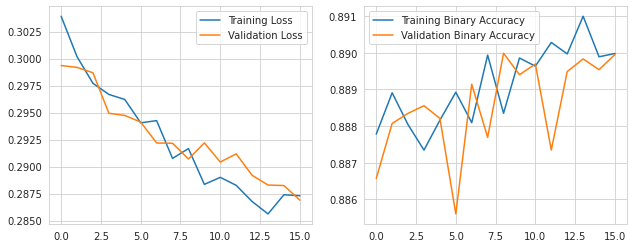

In [ ]:
plot_history(history)

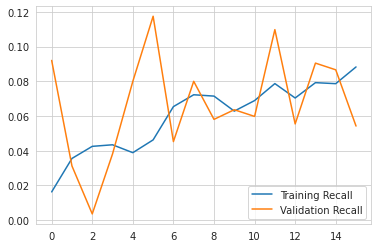

In [ ]:
recall = history.history['recall']
val_recall = history.history['val_recall']
epochs = len(history.history['loss'])

plt.figure(figsize=(6, 4))
for i, metrics in enumerate(zip([recall], [val_recall],['Recall'])):
  plt.plot(range(epochs), metrics[0], label='Training {}'.format(metrics[2]))
  plt.plot(range(epochs), metrics[1], label='Validation {}'.format(metrics[2]))
  plt.legend()
plt.show()

## ROC Curve & AUC

32/32 [==============================] - 0s 5ms/step


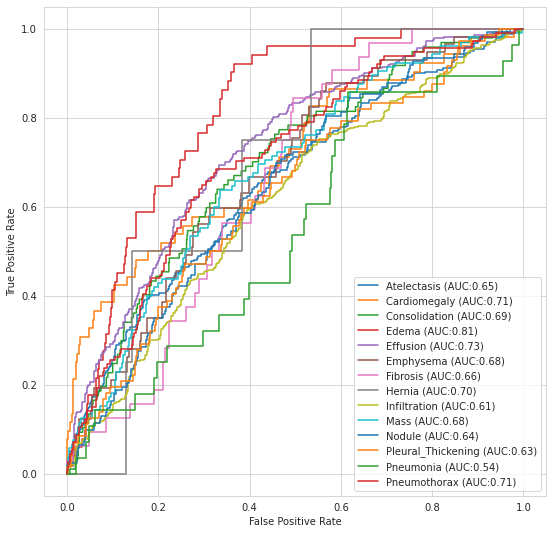

In [ ]:
y_pred = model.predict(test_X, verbose = True)

fig, c_ax = plt.subplots(1,1, figsize = (9, 9))
for (idx, c_label) in enumerate(all_labels):
    fpr, tpr, thresholds = roc_curve(test_Y[:,idx].astype(int), y_pred[:,idx])
    c_ax.plot(fpr, tpr, label = '%s (AUC:%0.2f)'  % (c_label, auc(fpr, tpr)))
c_ax.legend()
c_ax.set_xlabel('False Positive Rate')
c_ax.set_ylabel('True Positive Rate')
fig.savefig('trained_net.png')

# hernia has low sample

In [ ]:
print('roc score = ', roc_auc_score(test_Y.astype(int), y_pred))

roc score =  0.6746489547351328


## Confusion Matrix - 50% Threshold

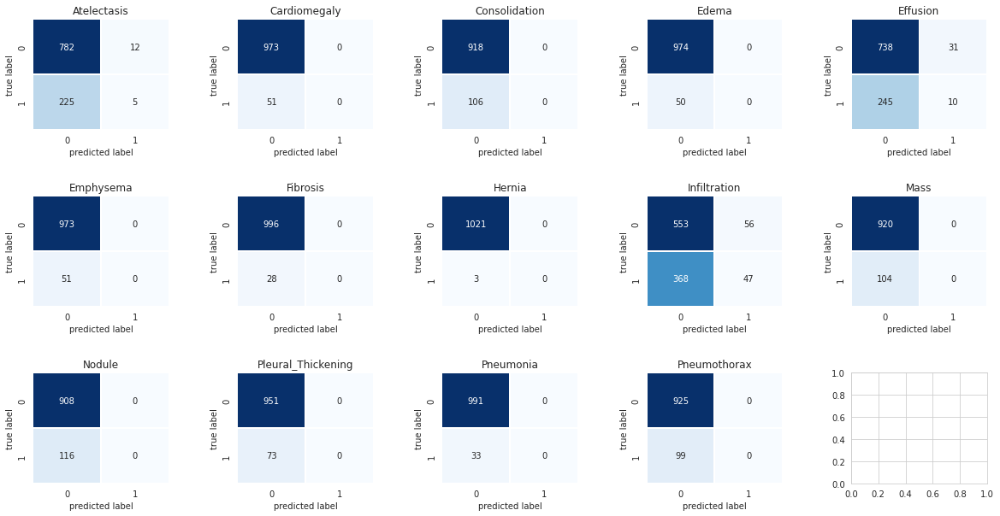

In [ ]:
y_pred_cat = np.where(y_pred > 0.5, 1, 0)

plot_confusion_matrix(test_Y, y_pred_cat)

In [ ]:
print(classification_report(test_Y, y_pred_cat, target_names=all_labels))

                    precision    recall  f1-score   support

       Atelectasis       0.29      0.02      0.04       230
      Cardiomegaly       0.00      0.00      0.00        51
     Consolidation       0.00      0.00      0.00       106
             Edema       0.00      0.00      0.00        50
          Effusion       0.24      0.04      0.07       255
         Emphysema       0.00      0.00      0.00        51
          Fibrosis       0.00      0.00      0.00        28
            Hernia       0.00      0.00      0.00         3
      Infiltration       0.46      0.11      0.18       415
              Mass       0.00      0.00      0.00       104
            Nodule       0.00      0.00      0.00       116
Pleural_Thickening       0.00      0.00      0.00        73
         Pneumonia       0.00      0.00      0.00        33
      Pneumothorax       0.00      0.00      0.00        99

         micro avg       0.39      0.04      0.07      1614
         macro avg       0.07      0.0

## Confusion Matrix - 20% Threshold

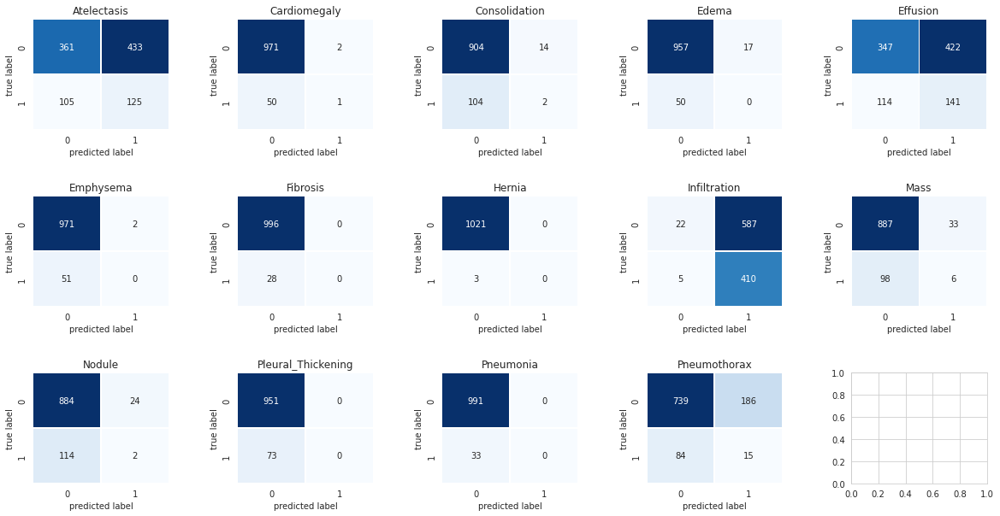

In [ ]:
y_pred_cat = np.where(y_pred > 0.2, 1, 0)

plot_confusion_matrix(test_Y, y_pred_cat)

In [ ]:
print(classification_report(test_Y, y_pred_cat, target_names=all_labels))

                    precision    recall  f1-score   support

       Atelectasis       0.22      0.54      0.32       230
      Cardiomegaly       0.33      0.02      0.04        51
     Consolidation       0.12      0.02      0.03       106
             Edema       0.00      0.00      0.00        50
          Effusion       0.25      0.55      0.34       255
         Emphysema       0.00      0.00      0.00        51
          Fibrosis       0.00      0.00      0.00        28
            Hernia       0.00      0.00      0.00         3
      Infiltration       0.41      0.99      0.58       415
              Mass       0.15      0.06      0.08       104
            Nodule       0.08      0.02      0.03       116
Pleural_Thickening       0.00      0.00      0.00        73
         Pneumonia       0.00      0.00      0.00        33
      Pneumothorax       0.07      0.15      0.10        99

         micro avg       0.29      0.43      0.35      1614
         macro avg       0.12      0.1

## Sample Predictions

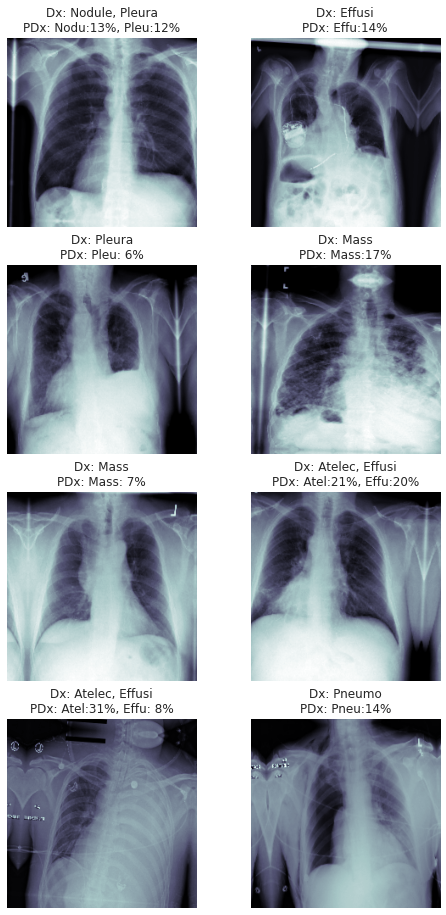

In [ ]:
# Show a few images and associated predictions
# https://www.kaggle.com/code/shrikantds/cnn-in-nih-dataset

sickest_idx = np.argsort(np.sum(test_Y, 1)<1)
fig, m_axs = plt.subplots(4, 2, figsize = (8, 16))
for (idx, c_ax) in zip(sickest_idx, m_axs.flatten()):
    c_ax.imshow(test_X[idx, :,:,0], cmap = 'bone')
    stat_str = [n_class[:6] for n_class, n_score in zip(all_labels, test_Y[idx]) if n_score>0.5]
    pred_str = ['%s:%2.0f%%' % (n_class[:4], p_score*100)  for n_class, n_score, p_score in zip(all_labels,
                                                                                                test_Y[idx], y_pred[idx]) 
    if (n_score>0.5) or (p_score>0.5)]
    c_ax.set_title('Dx: '+', '.join(stat_str)+'\nPDx: '+', '.join(pred_str))
    c_ax.axis('off')
fig.savefig('trained_img_predictions.png')

# Image Generator & Flow from Dataframe - Batch Size 32

In [ ]:
train_gen = core_idg.flow_from_dataframe(dataframe=train_df,
                                         directory=None,
                                         x_col = 'path',
                                         y_col = 'newLabel',
                                         class_mode = 'categorical',
                                         classes = all_labels,
                                         target_size = IMG_SIZE,
                                         color_mode = 'grayscale',
                                         batch_size = 32)

valid_gen = core_idg.flow_from_dataframe(dataframe=valid_df,
                                         directory=None,
                                         x_col = 'path',
                                         y_col = 'newLabel',
                                         class_mode = 'categorical',
                                         classes = all_labels,
                                         target_size = IMG_SIZE,
                                         color_mode = 'grayscale',
                                         batch_size = 256) # we can use much larger batches for evaluation

test_X, test_Y = next(core_idg.flow_from_dataframe(dataframe=test_df,
                                                   directory=None,
                                                   x_col = 'path',
                                                   y_col = 'newLabel',
                                                   class_mode = 'categorical',
                                                   classes = all_labels,
                                                   target_size = IMG_SIZE,
                                                   color_mode = 'grayscale',
                                                   batch_size = 1024))

# Model 5: CNN 3 layers (32, 64, 128 - with regularization)

## Build and Compile Model

In [ ]:
model = models.Sequential()
model.add(layers.Conv2D(filters=32, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu,input_shape=t_x.shape[1:]))
model.add(layers.MaxPool2D((2, 2),strides=2))
model.add(layers.Dropout(0.2))
model.add(layers.Conv2D(filters=64, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu))
model.add(layers.MaxPool2D(pool_size=(2, 2),strides=2))
model.add(layers.Dropout(0.2))
model.add(layers.Conv2D(filters=128, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu))
model.add(layers.MaxPool2D(pool_size=(2, 2),strides=2))
model.add(layers.Dropout(0.2))
model.add(layers.Flatten())
model.add(layers.Dense(units=384, activation=tf.nn.relu))
model.add(layers.Dense(units=len(all_labels), activation='sigmoid'))

model.compile(optimizer = 'adam', loss = 'binary_crossentropy',
              metrics = ['binary_accuracy', keras.metrics.Recall()])

model.summary()

Model: "sequential_40"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_120 (Conv2D)         (None, 126, 126, 32)      320       
                                                                 
 max_pooling2d_120 (MaxPooli  (None, 63, 63, 32)       0         
 ng2D)                                                           
                                                                 
 dropout_3 (Dropout)         (None, 63, 63, 32)        0         
                                                                 
 conv2d_121 (Conv2D)         (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_121 (MaxPooli  (None, 30, 30, 64)       0         
 ng2D)                                                           
                                                                 
 dropout_4 (Dropout)         (None, 30, 30, 64)      

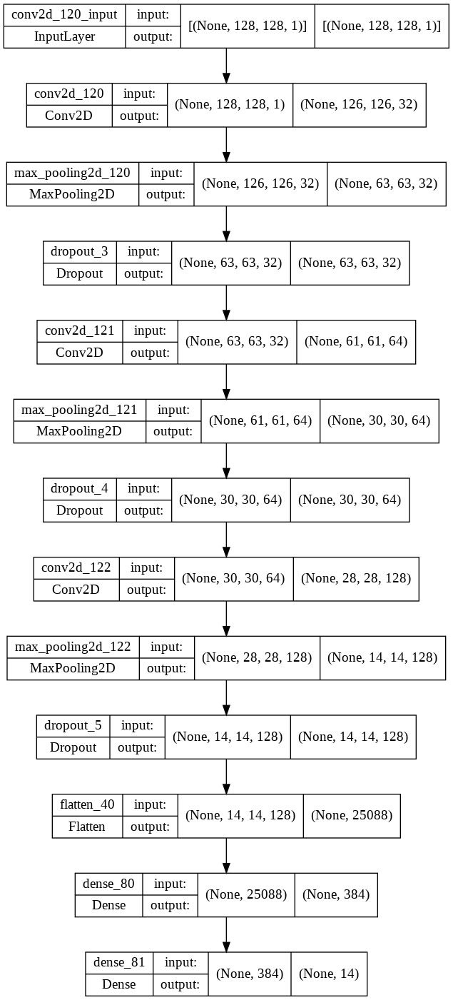

In [ ]:
keras.utils.plot_model(model, "model5.png", show_shapes=True)

## Train Model

In [ ]:
%%time 
history = model.fit_generator(train_gen, 
                              steps_per_epoch=100,
                              validation_data = valid_gen, 
                              epochs = 20,
                              callbacks=[
                                  tf.keras.callbacks.ModelCheckpoint("model5.h5",save_best_only=True,save_weights_only=False),
                                  tf.keras.callbacks.EarlyStopping(monitor='val_binary_accuracy', patience=10)
                              ])

Epoch 1/20
100/100 [==============================] - 120s 1s/step - loss: 0.3216 - binary_accuracy: 0.8818 - recall_23: 0.0400 - val_loss: 0.3790 - val_binary_accuracy: 0.8881 - val_recall_23: 0.0431
Epoch 2/20
100/100 [==============================] - 115s 1s/step - loss: 0.3049 - binary_accuracy: 0.8866 - recall_23: 0.0134 - val_loss: 0.3894 - val_binary_accuracy: 0.8883 - val_recall_23: 0.0000e+00
Epoch 3/20
100/100 [==============================] - 116s 1s/step - loss: 0.3019 - binary_accuracy: 0.8863 - recall_23: 0.0295 - val_loss: 0.3449 - val_binary_accuracy: 0.8870 - val_recall_23: 0.0489
Epoch 4/20
100/100 [==============================] - 115s 1s/step - loss: 0.3013 - binary_accuracy: 0.8868 - recall_23: 0.0282 - val_loss: 0.3171 - val_binary_accuracy: 0.8882 - val_recall_23: 3.0883e-04
Epoch 5/20
100/100 [==============================] - 113s 1s/step - loss: 0.3043 - binary_accuracy: 0.8861 - recall_23: 0.0247 - val_loss: 0.3364 - val_binary_accuracy: 0.8867 - val_recal

## Test Model

In [ ]:
print('test binary accuracy = ', model.evaluate(test_X, test_Y, verbose=0)[1])

test binary accuracy =  0.8861607313156128


## Training & Validation Plots

In [ ]:
history_dict = history.history
history_dict.keys()

dict_keys(['loss', 'binary_accuracy', 'recall_23', 'val_loss', 'val_binary_accuracy', 'val_recall_23'])

In [ ]:
history_df=pd.DataFrame(history_dict)
history_df.tail().round(3)

,loss,binary_accuracy,recall_23,val_loss,val_binary_accuracy,val_recall_23
15,0.295,0.888,0.047,0.301,0.888,0.035
16,0.291,0.890,0.052,0.305,0.888,0.079
17,0.295,0.888,0.057,0.294,0.890,0.042
18,0.289,0.889,0.073,0.293,0.889,0.080
19,0.292,0.888,0.056,0.295,0.889,0.024


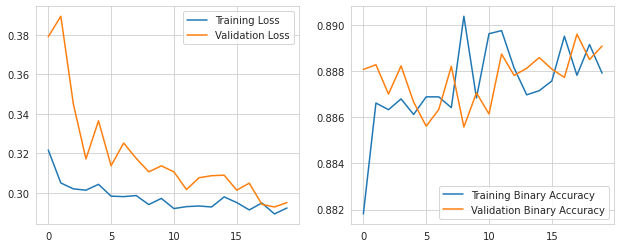

In [ ]:
plot_history(history)

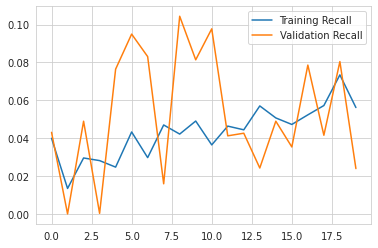

In [ ]:
recall = history.history['recall_23']
val_recall = history.history['val_recall_23']
epochs = len(history.history['loss'])

plt.figure(figsize=(6, 4))
for i, metrics in enumerate(zip([recall], [val_recall],['Recall'])):
  plt.plot(range(epochs), metrics[0], label='Training {}'.format(metrics[2]))
  plt.plot(range(epochs), metrics[1], label='Validation {}'.format(metrics[2]))
  plt.legend()
plt.show()

## ROC Curve & AUC

32/32 [==============================] - 0s 5ms/step


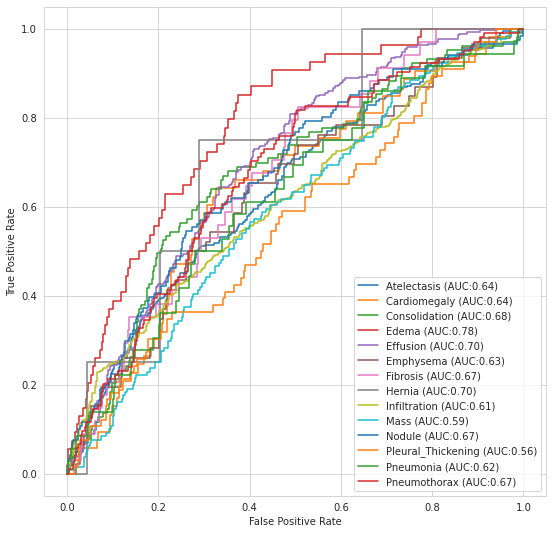

In [ ]:
y_pred = model.predict(test_X, verbose = True)

fig, c_ax = plt.subplots(1,1, figsize = (9, 9))
for (idx, c_label) in enumerate(all_labels):
    fpr, tpr, thresholds = roc_curve(test_Y[:,idx].astype(int), y_pred[:,idx])
    c_ax.plot(fpr, tpr, label = '%s (AUC:%0.2f)'  % (c_label, auc(fpr, tpr)))
c_ax.legend()
c_ax.set_xlabel('False Positive Rate')
c_ax.set_ylabel('True Positive Rate')
fig.savefig('trained_net.png')

# hernia has low sample

In [ ]:
print('roc score = ', roc_auc_score(test_Y.astype(int), y_pred))

roc score =  0.6562068546661853


## Confusion Matrix - 50% Threshold

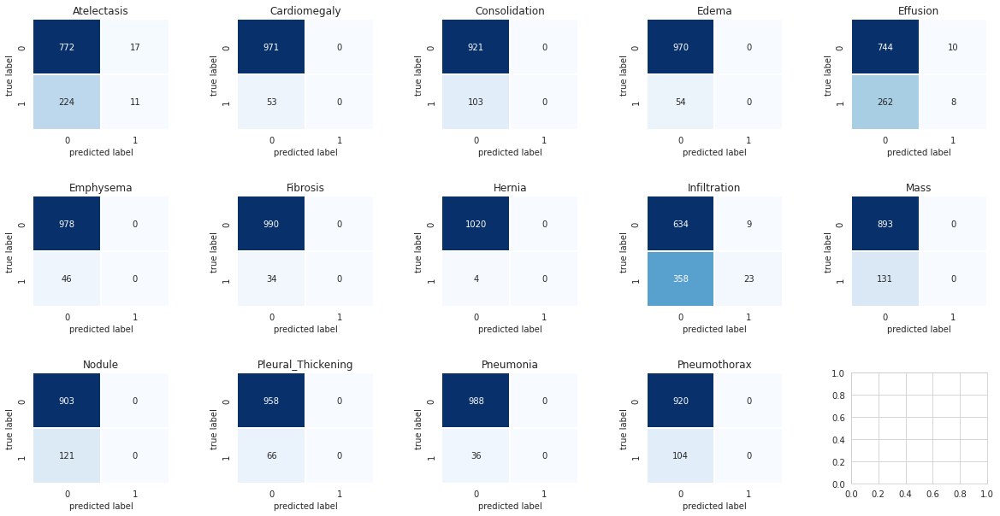

In [ ]:
y_pred_cat = np.where(y_pred > 0.5, 1, 0)

plot_confusion_matrix(test_Y, y_pred_cat)

In [ ]:
print(classification_report(test_Y, y_pred_cat, target_names=all_labels))

                    precision    recall  f1-score   support

       Atelectasis       0.39      0.05      0.08       235
      Cardiomegaly       0.00      0.00      0.00        53
     Consolidation       0.00      0.00      0.00       103
             Edema       0.00      0.00      0.00        54
          Effusion       0.44      0.03      0.06       270
         Emphysema       0.00      0.00      0.00        46
          Fibrosis       0.00      0.00      0.00        34
            Hernia       0.00      0.00      0.00         4
      Infiltration       0.72      0.06      0.11       381
              Mass       0.00      0.00      0.00       131
            Nodule       0.00      0.00      0.00       121
Pleural_Thickening       0.00      0.00      0.00        66
         Pneumonia       0.00      0.00      0.00        36
      Pneumothorax       0.00      0.00      0.00       104

         micro avg       0.54      0.03      0.05      1638
         macro avg       0.11      0.0

## Confusion Matrix - 20% Threshold

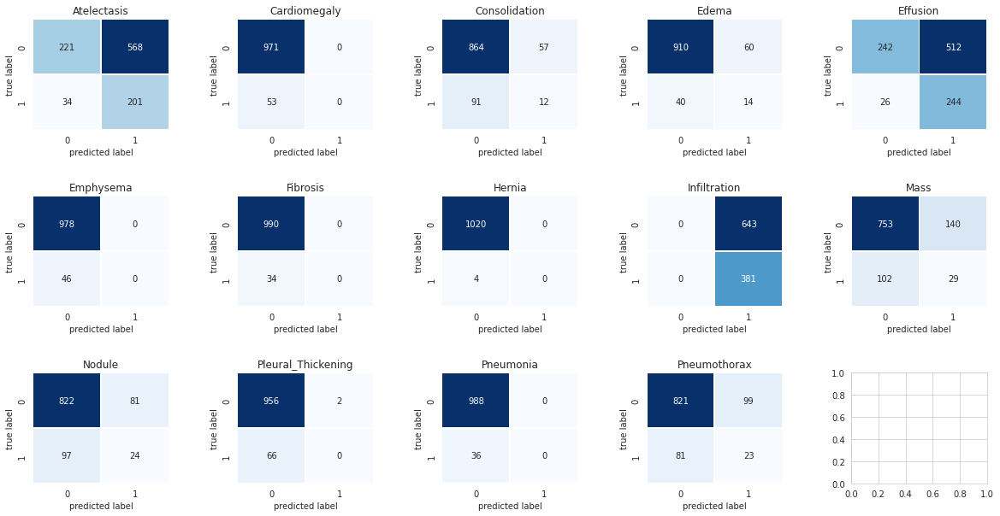

In [ ]:
y_pred_cat = np.where(y_pred > 0.2, 1, 0)

plot_confusion_matrix(test_Y, y_pred_cat)

In [ ]:
print(classification_report(test_Y, y_pred_cat, target_names=all_labels))

                    precision    recall  f1-score   support

       Atelectasis       0.26      0.86      0.40       235
      Cardiomegaly       0.00      0.00      0.00        53
     Consolidation       0.17      0.12      0.14       103
             Edema       0.19      0.26      0.22        54
          Effusion       0.32      0.90      0.48       270
         Emphysema       0.00      0.00      0.00        46
          Fibrosis       0.00      0.00      0.00        34
            Hernia       0.00      0.00      0.00         4
      Infiltration       0.37      1.00      0.54       381
              Mass       0.17      0.22      0.19       131
            Nodule       0.23      0.20      0.21       121
Pleural_Thickening       0.00      0.00      0.00        66
         Pneumonia       0.00      0.00      0.00        36
      Pneumothorax       0.19      0.22      0.20       104

         micro avg       0.30      0.57      0.39      1638
         macro avg       0.14      0.2

## Sample Predictions

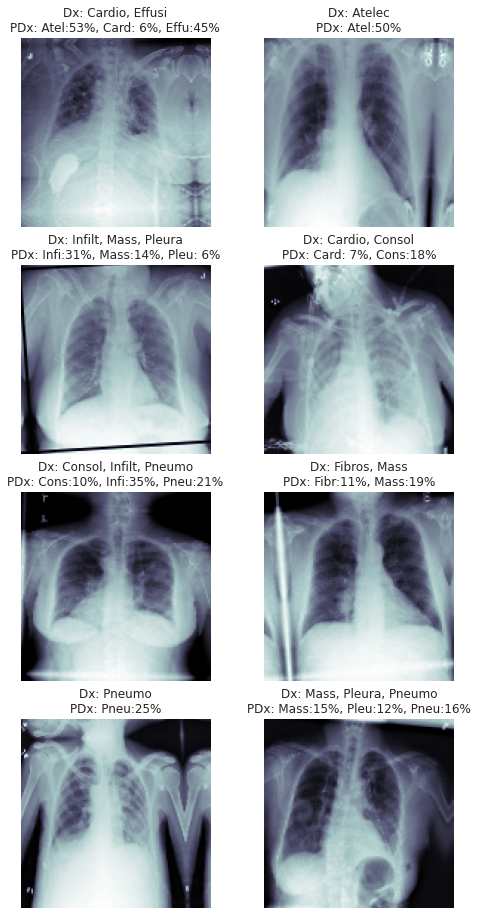

In [ ]:
# Show a few images and associated predictions
# https://www.kaggle.com/code/shrikantds/cnn-in-nih-dataset

sickest_idx = np.argsort(np.sum(test_Y, 1)<1)
fig, m_axs = plt.subplots(4, 2, figsize = (8, 16))
for (idx, c_ax) in zip(sickest_idx, m_axs.flatten()):
    c_ax.imshow(test_X[idx, :,:,0], cmap = 'bone')
    stat_str = [n_class[:6] for n_class, n_score in zip(all_labels, test_Y[idx]) if n_score>0.5]
    pred_str = ['%s:%2.0f%%' % (n_class[:4], p_score*100)  for n_class, n_score, p_score in zip(all_labels,
                                                                                                test_Y[idx], y_pred[idx]) 
    if (n_score>0.5) or (p_score>0.5)]
    c_ax.set_title('Dx: '+', '.join(stat_str)+'\nPDx: '+', '.join(pred_str))
    c_ax.axis('off')
fig.savefig('trained_img_predictions.png')

# Model 6: CNN 3 layers (128, 256, 512 - with regularization)

## Build and Compile Model

In [ ]:
model = models.Sequential()
model.add(layers.Conv2D(filters=128, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu,input_shape=t_x.shape[1:]))
model.add(layers.MaxPool2D((2, 2),strides=2))
model.add(layers.Dropout(0.3))
model.add(layers.Conv2D(filters=256, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu))
model.add(layers.MaxPool2D(pool_size=(2, 2),strides=2))
model.add(layers.Dropout(0.3))
model.add(layers.Conv2D(filters=512, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu))
model.add(layers.MaxPool2D(pool_size=(2, 2),strides=2))
model.add(layers.Dropout(0.3))
model.add(layers.Flatten())
model.add(layers.Dense(units=384, activation=tf.nn.relu))
model.add(layers.Dense(units=len(all_labels), activation='sigmoid'))

model.compile(optimizer = 'adam', loss = 'binary_crossentropy',
              metrics = ['binary_accuracy', keras.metrics.Recall()])

model.summary()


Model: "sequential_41"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_123 (Conv2D)         (None, 126, 126, 128)     1280      
                                                                 
 max_pooling2d_123 (MaxPooli  (None, 63, 63, 128)      0         
 ng2D)                                                           
                                                                 
 dropout_6 (Dropout)         (None, 63, 63, 128)       0         
                                                                 
 conv2d_124 (Conv2D)         (None, 61, 61, 256)       295168    
                                                                 
 max_pooling2d_124 (MaxPooli  (None, 30, 30, 256)      0         
 ng2D)                                                           
                                                                 
 dropout_7 (Dropout)         (None, 30, 30, 256)     

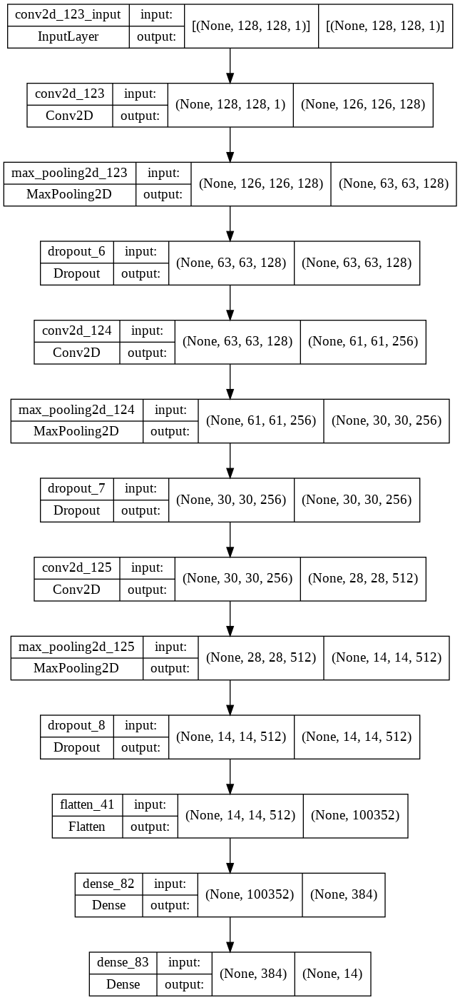

In [ ]:
keras.utils.plot_model(model, "model6.png", show_shapes=True)

## Train Model

In [ ]:
%%time 
history = model.fit_generator(train_gen, 
                              steps_per_epoch=100,
                              validation_data = valid_gen, 
                              epochs = 20,
                              callbacks=[
                                  tf.keras.callbacks.ModelCheckpoint("model6.h5",save_best_only=True,save_weights_only=False),
                                  tf.keras.callbacks.EarlyStopping(monitor='val_binary_accuracy', patience=10)
                              ])

Epoch 1/20
100/100 [==============================] - 122s 1s/step - loss: 0.3512 - binary_accuracy: 0.8793 - recall_24: 0.0513 - val_loss: 0.3343 - val_binary_accuracy: 0.8869 - val_recall_24: 0.0230
Epoch 2/20
100/100 [==============================] - 117s 1s/step - loss: 0.3010 - binary_accuracy: 0.8887 - recall_24: 0.0182 - val_loss: 0.3411 - val_binary_accuracy: 0.8883 - val_recall_24: 1.5442e-04
Epoch 3/20
100/100 [==============================] - 117s 1s/step - loss: 0.3003 - binary_accuracy: 0.8880 - recall_24: 0.0192 - val_loss: 0.3366 - val_binary_accuracy: 0.8879 - val_recall_24: 0.0457
Epoch 4/20
100/100 [==============================] - 116s 1s/step - loss: 0.2992 - binary_accuracy: 0.8878 - recall_24: 0.0237 - val_loss: 0.3145 - val_binary_accuracy: 0.8880 - val_recall_24: 0.0122
Epoch 5/20
100/100 [==============================] - 117s 1s/step - loss: 0.2962 - binary_accuracy: 0.8888 - recall_24: 0.0370 - val_loss: 0.3253 - val_binary_accuracy: 0.8883 - val_recall_24

## Test Model

In [ ]:
print('test binary accuracy = ', model.evaluate(test_X, test_Y, verbose=0)[1])

test binary accuracy =  0.8858119249343872


## Training & Validation Plots

In [ ]:
history_dict = history.history
history_dict.keys()

dict_keys(['loss', 'binary_accuracy', 'recall_24', 'val_loss', 'val_binary_accuracy', 'val_recall_24'])

In [ ]:
history_df=pd.DataFrame(history_dict)
history_df.tail().round(3)

,loss,binary_accuracy,recall_24,val_loss,val_binary_accuracy,val_recall_24
12,0.299,0.887,0.030,0.313,0.889,0.010
13,0.297,0.888,0.033,0.303,0.888,0.004
14,0.295,0.888,0.052,0.302,0.888,0.007
15,0.294,0.888,0.051,0.316,0.889,0.027
16,0.297,0.888,0.037,0.301,0.888,0.001


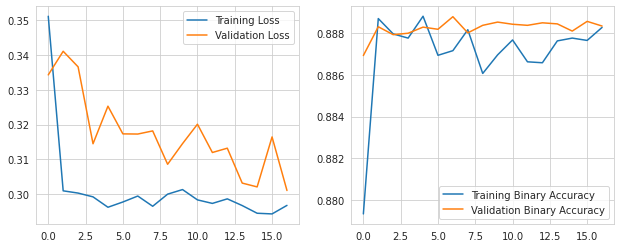

In [ ]:
plot_history(history)

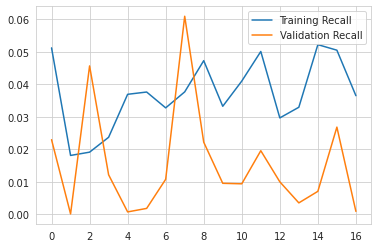

In [ ]:
recall = history.history['recall_24']
val_recall = history.history['val_recall_24']
epochs = len(history.history['loss'])

plt.figure(figsize=(6, 4))
for i, metrics in enumerate(zip([recall], [val_recall],['Recall'])):
  plt.plot(range(epochs), metrics[0], label='Training {}'.format(metrics[2]))
  plt.plot(range(epochs), metrics[1], label='Validation {}'.format(metrics[2]))
  plt.legend()
plt.show()

## ROC Curve & AUC

32/32 [==============================] - 1s 15ms/step


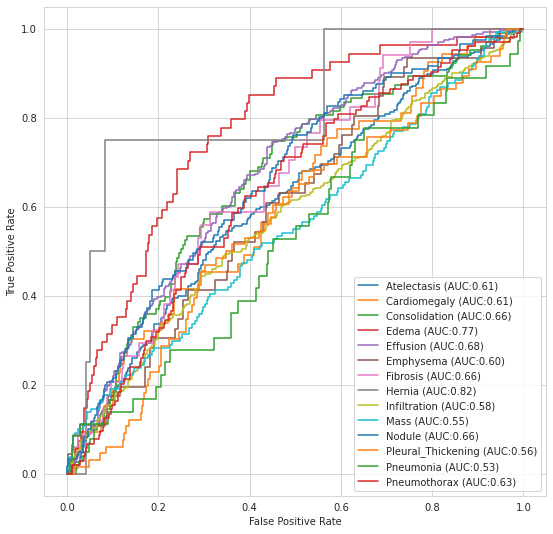

In [ ]:
y_pred = model.predict(test_X, verbose = True)

fig, c_ax = plt.subplots(1,1, figsize = (9, 9))
for (idx, c_label) in enumerate(all_labels):
    fpr, tpr, thresholds = roc_curve(test_Y[:,idx].astype(int), y_pred[:,idx])
    c_ax.plot(fpr, tpr, label = '%s (AUC:%0.2f)'  % (c_label, auc(fpr, tpr)))
c_ax.legend()
c_ax.set_xlabel('False Positive Rate')
c_ax.set_ylabel('True Positive Rate')
fig.savefig('trained_net.png')

# hernia has low sample

In [ ]:
print('roc score = ', roc_auc_score(test_Y.astype(int), y_pred))

roc score =  0.6371240013623767


## Confusion Matrix - 50% Threshold

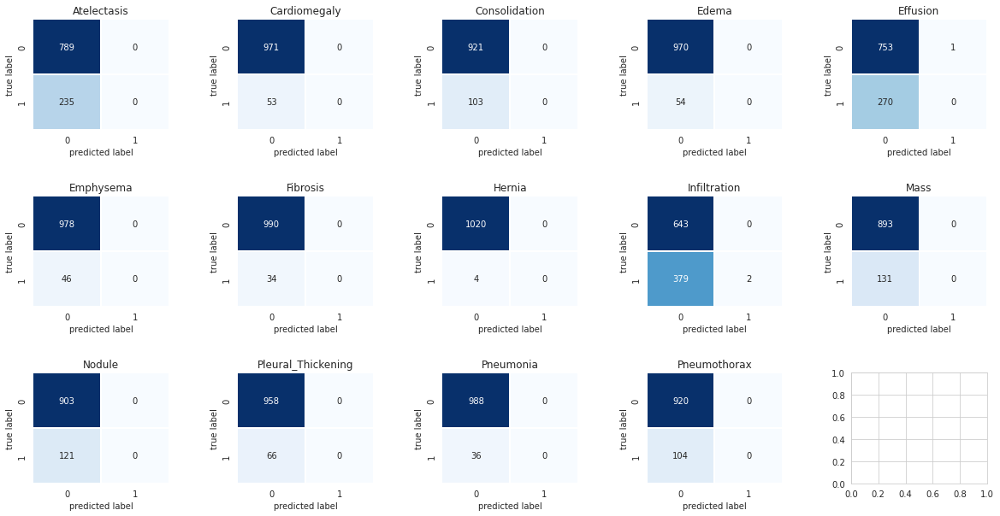

In [ ]:
y_pred_cat = np.where(y_pred > 0.5, 1, 0)

plot_confusion_matrix(test_Y, y_pred_cat)

In [ ]:
print(classification_report(test_Y, y_pred_cat, target_names=all_labels))

                    precision    recall  f1-score   support

       Atelectasis       0.00      0.00      0.00       235
      Cardiomegaly       0.00      0.00      0.00        53
     Consolidation       0.00      0.00      0.00       103
             Edema       0.00      0.00      0.00        54
          Effusion       0.00      0.00      0.00       270
         Emphysema       0.00      0.00      0.00        46
          Fibrosis       0.00      0.00      0.00        34
            Hernia       0.00      0.00      0.00         4
      Infiltration       1.00      0.01      0.01       381
              Mass       0.00      0.00      0.00       131
            Nodule       0.00      0.00      0.00       121
Pleural_Thickening       0.00      0.00      0.00        66
         Pneumonia       0.00      0.00      0.00        36
      Pneumothorax       0.00      0.00      0.00       104

         micro avg       0.67      0.00      0.00      1638
         macro avg       0.07      0.0

## Confusion Matrix - 20% Threshold

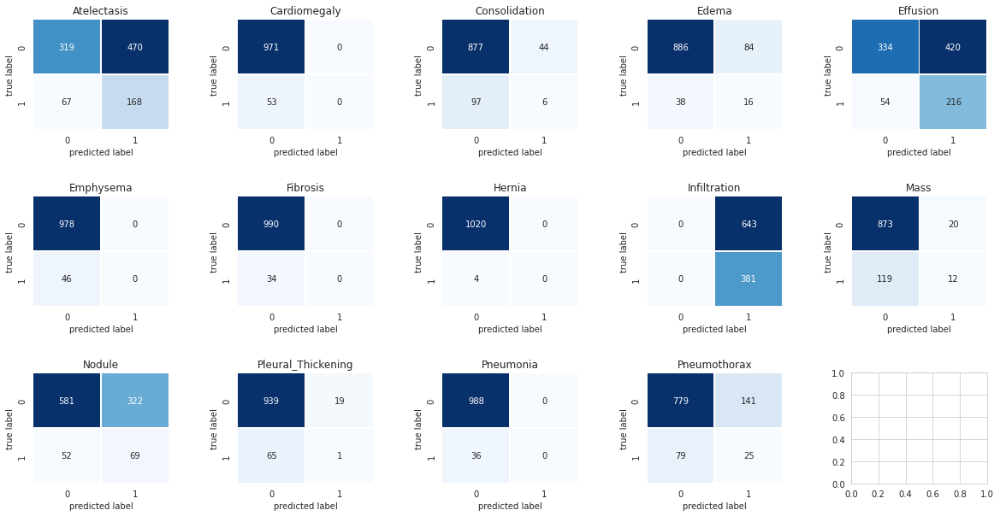

In [ ]:
y_pred_cat = np.where(y_pred > 0.2, 1, 0)

plot_confusion_matrix(test_Y, y_pred_cat)

In [ ]:
print(classification_report(test_Y, y_pred_cat, target_names=all_labels))

                    precision    recall  f1-score   support

       Atelectasis       0.26      0.71      0.38       235
      Cardiomegaly       0.00      0.00      0.00        53
     Consolidation       0.12      0.06      0.08       103
             Edema       0.16      0.30      0.21        54
          Effusion       0.34      0.80      0.48       270
         Emphysema       0.00      0.00      0.00        46
          Fibrosis       0.00      0.00      0.00        34
            Hernia       0.00      0.00      0.00         4
      Infiltration       0.37      1.00      0.54       381
              Mass       0.38      0.09      0.15       131
            Nodule       0.18      0.57      0.27       121
Pleural_Thickening       0.05      0.02      0.02        66
         Pneumonia       0.00      0.00      0.00        36
      Pneumothorax       0.15      0.24      0.19       104

         micro avg       0.29      0.55      0.38      1638
         macro avg       0.14      0.2

## Sample Predictions

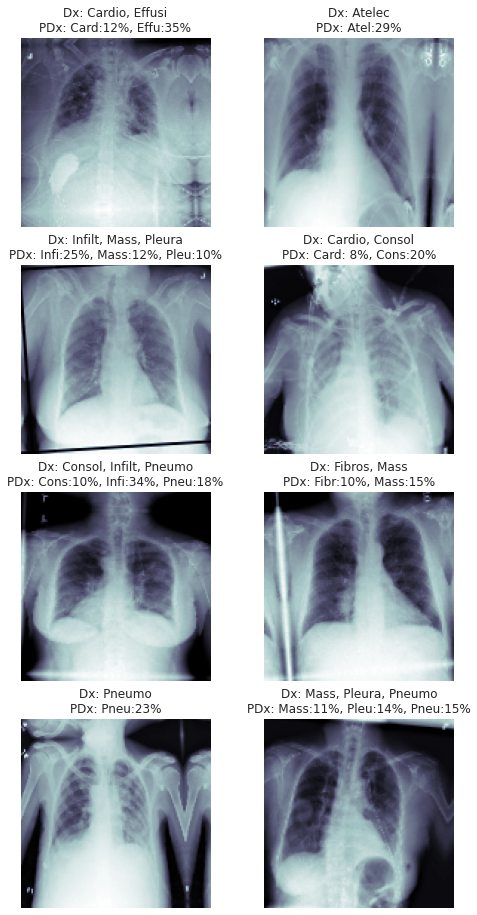

In [ ]:
# Show a few images and associated predictions
# https://www.kaggle.com/code/shrikantds/cnn-in-nih-dataset

sickest_idx = np.argsort(np.sum(test_Y, 1)<1)
fig, m_axs = plt.subplots(4, 2, figsize = (8, 16))
for (idx, c_ax) in zip(sickest_idx, m_axs.flatten()):
    c_ax.imshow(test_X[idx, :,:,0], cmap = 'bone')
    stat_str = [n_class[:6] for n_class, n_score in zip(all_labels, test_Y[idx]) if n_score>0.5]
    pred_str = ['%s:%2.0f%%' % (n_class[:4], p_score*100)  for n_class, n_score, p_score in zip(all_labels,
                                                                                                test_Y[idx], y_pred[idx]) 
    if (n_score>0.5) or (p_score>0.5)]
    c_ax.set_title('Dx: '+', '.join(stat_str)+'\nPDx: '+', '.join(pred_str))
    c_ax.axis('off')
fig.savefig('trained_img_predictions.png')

# Model 7: CNN 2 layers (64, 128 - with regularization)

## Build and Compile Model

In [ ]:
model = models.Sequential()
model.add(layers.Conv2D(filters=64, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu,input_shape=t_x.shape[1:]))
model.add(layers.MaxPool2D((2, 2),strides=2))
model.add(layers.Dropout(0.2))
model.add(layers.Conv2D(filters=128, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu))
model.add(layers.MaxPool2D(pool_size=(2, 2),strides=2))
model.add(layers.Dropout(0.2))
model.add(layers.Flatten())
model.add(layers.Dense(units=384, activation=tf.nn.relu))
model.add(layers.Dense(units=len(all_labels), activation='sigmoid'))

model.compile(optimizer = 'adam', loss = 'binary_crossentropy',
              metrics = ['binary_accuracy', keras.metrics.Recall()])

model.summary()

Model: "sequential_42"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_126 (Conv2D)         (None, 126, 126, 64)      640       
                                                                 
 max_pooling2d_126 (MaxPooli  (None, 63, 63, 64)       0         
 ng2D)                                                           
                                                                 
 dropout_9 (Dropout)         (None, 63, 63, 64)        0         
                                                                 
 conv2d_127 (Conv2D)         (None, 61, 61, 128)       73856     
                                                                 
 max_pooling2d_127 (MaxPooli  (None, 30, 30, 128)      0         
 ng2D)                                                           
                                                                 
 dropout_10 (Dropout)        (None, 30, 30, 128)     

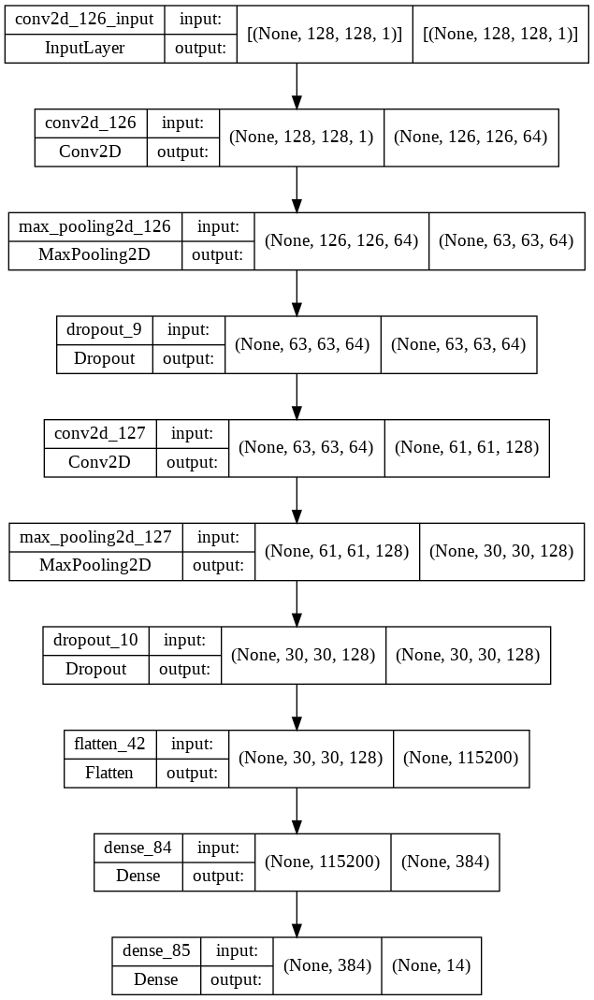

In [ ]:
keras.utils.plot_model(model, "model7.png", show_shapes=True)

## Train Model

In [ ]:
%%time 
history = model.fit_generator(train_gen, 
                              steps_per_epoch=100,
                              validation_data = valid_gen, 
                              epochs = 20,
                              callbacks=[
                                  tf.keras.callbacks.ModelCheckpoint("model7.h5",save_best_only=True,save_weights_only=False),
                                  tf.keras.callbacks.EarlyStopping(monitor='val_binary_accuracy', patience=10)
                              ])

Epoch 1/20
100/100 [==============================] - 122s 1s/step - loss: 0.3574 - binary_accuracy: 0.8778 - recall_25: 0.0472 - val_loss: 0.3071 - val_binary_accuracy: 0.8883 - val_recall_25: 0.0032
Epoch 2/20
100/100 [==============================] - 114s 1s/step - loss: 0.3003 - binary_accuracy: 0.8888 - recall_25: 0.0065 - val_loss: 0.3136 - val_binary_accuracy: 0.8882 - val_recall_25: 4.6325e-04
Epoch 3/20
100/100 [==============================] - 116s 1s/step - loss: 0.3046 - binary_accuracy: 0.8875 - recall_25: 0.0300 - val_loss: 0.3103 - val_binary_accuracy: 0.8879 - val_recall_25: 0.0168
Epoch 4/20
100/100 [==============================] - 113s 1s/step - loss: 0.3042 - binary_accuracy: 0.8872 - recall_25: 0.0221 - val_loss: 0.3279 - val_binary_accuracy: 0.8880 - val_recall_25: 0.0276
Epoch 5/20
100/100 [==============================] - 115s 1s/step - loss: 0.3015 - binary_accuracy: 0.8874 - recall_25: 0.0259 - val_loss: 0.3028 - val_binary_accuracy: 0.8887 - val_recall_25

## Test Model

In [ ]:
print('test binary accuracy = ', model.evaluate(test_X, test_Y, verbose=0)[1])

test binary accuracy =  0.884835422039032


## Training & Validation Plots

In [ ]:
history_dict = history.history
history_dict.keys()

dict_keys(['loss', 'binary_accuracy', 'recall_25', 'val_loss', 'val_binary_accuracy', 'val_recall_25'])

In [ ]:
history_df=pd.DataFrame(history_dict)
history_df.tail().round(3)

,loss,binary_accuracy,recall_25,val_loss,val_binary_accuracy,val_recall_25
15,0.296,0.887,0.042,0.295,0.889,0.028
16,0.290,0.890,0.042,0.301,0.888,0.038
17,0.293,0.889,0.045,0.298,0.889,0.025
18,0.293,0.890,0.033,0.295,0.889,0.012
19,0.293,0.888,0.045,0.297,0.888,0.033


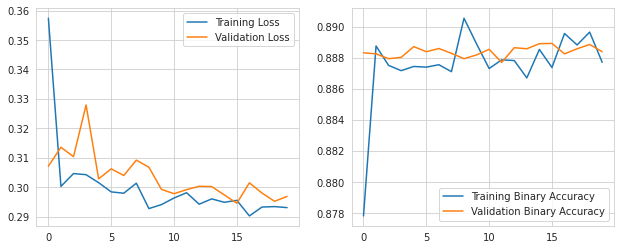

In [ ]:
plot_history(history)

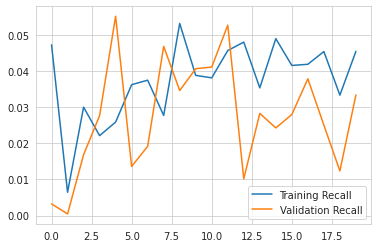

In [ ]:
recall = history.history['recall_25']
val_recall = history.history['val_recall_25']
epochs = len(history.history['loss'])

plt.figure(figsize=(6, 4))
for i, metrics in enumerate(zip([recall], [val_recall],['Recall'])):
  plt.plot(range(epochs), metrics[0], label='Training {}'.format(metrics[2]))
  plt.plot(range(epochs), metrics[1], label='Validation {}'.format(metrics[2]))
  plt.legend()
plt.show()

## ROC Curve & AUC

32/32 [==============================] - 0s 7ms/step


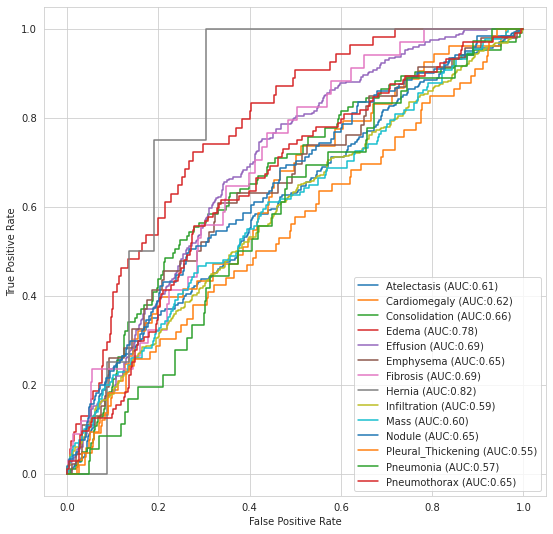

In [ ]:
y_pred = model.predict(test_X, verbose = True)

fig, c_ax = plt.subplots(1,1, figsize = (9, 9))
for (idx, c_label) in enumerate(all_labels):
    fpr, tpr, thresholds = roc_curve(test_Y[:,idx].astype(int), y_pred[:,idx])
    c_ax.plot(fpr, tpr, label = '%s (AUC:%0.2f)'  % (c_label, auc(fpr, tpr)))
c_ax.legend()
c_ax.set_xlabel('False Positive Rate')
c_ax.set_ylabel('True Positive Rate')
fig.savefig('trained_net.png')

# hernia has low sample

In [ ]:
print('roc score = ', roc_auc_score(test_Y.astype(int), y_pred))

roc score =  0.6517457317981304


## Confusion Matrix - 50% Threshold

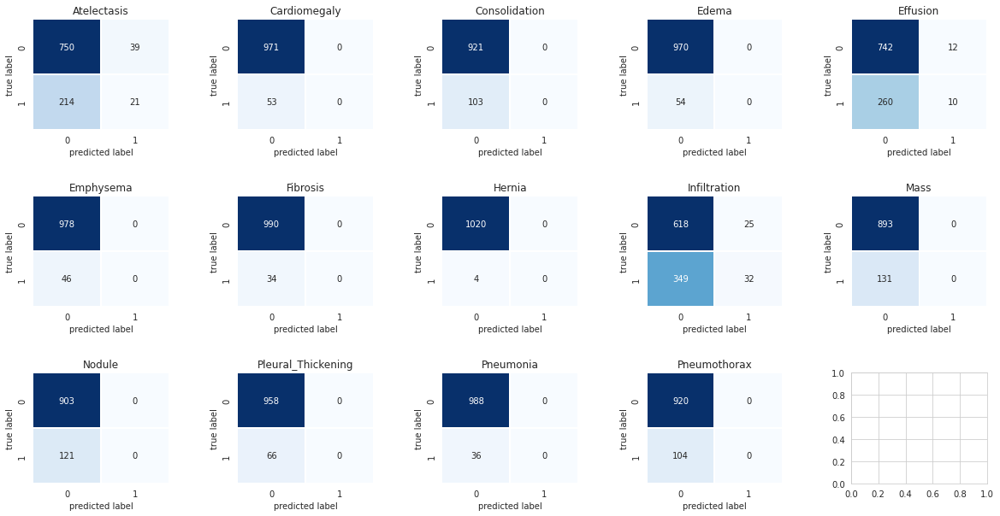

In [ ]:
y_pred_cat = np.where(y_pred > 0.5, 1, 0)

plot_confusion_matrix(test_Y, y_pred_cat)

In [ ]:
print(classification_report(test_Y, y_pred_cat, target_names=all_labels))

                    precision    recall  f1-score   support

       Atelectasis       0.35      0.09      0.14       235
      Cardiomegaly       0.00      0.00      0.00        53
     Consolidation       0.00      0.00      0.00       103
             Edema       0.00      0.00      0.00        54
          Effusion       0.45      0.04      0.07       270
         Emphysema       0.00      0.00      0.00        46
          Fibrosis       0.00      0.00      0.00        34
            Hernia       0.00      0.00      0.00         4
      Infiltration       0.56      0.08      0.15       381
              Mass       0.00      0.00      0.00       131
            Nodule       0.00      0.00      0.00       121
Pleural_Thickening       0.00      0.00      0.00        66
         Pneumonia       0.00      0.00      0.00        36
      Pneumothorax       0.00      0.00      0.00       104

         micro avg       0.45      0.04      0.07      1638
         macro avg       0.10      0.0

## Confusion Matrix - 20% Threshold

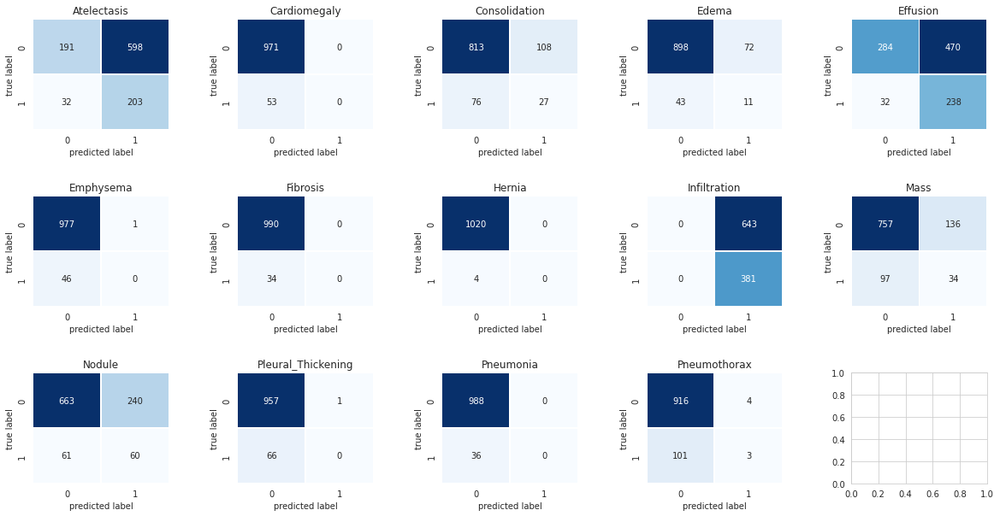

In [ ]:
y_pred_cat = np.where(y_pred > 0.2, 1, 0)

plot_confusion_matrix(test_Y, y_pred_cat)

In [ ]:
print(classification_report(test_Y, y_pred_cat, target_names=all_labels))

                    precision    recall  f1-score   support

       Atelectasis       0.25      0.86      0.39       235
      Cardiomegaly       0.00      0.00      0.00        53
     Consolidation       0.20      0.26      0.23       103
             Edema       0.13      0.20      0.16        54
          Effusion       0.34      0.88      0.49       270
         Emphysema       0.00      0.00      0.00        46
          Fibrosis       0.00      0.00      0.00        34
            Hernia       0.00      0.00      0.00         4
      Infiltration       0.37      1.00      0.54       381
              Mass       0.20      0.26      0.23       131
            Nodule       0.20      0.50      0.29       121
Pleural_Thickening       0.00      0.00      0.00        66
         Pneumonia       0.00      0.00      0.00        36
      Pneumothorax       0.43      0.03      0.05       104

         micro avg       0.30      0.58      0.39      1638
         macro avg       0.15      0.2

## Sample Predictions

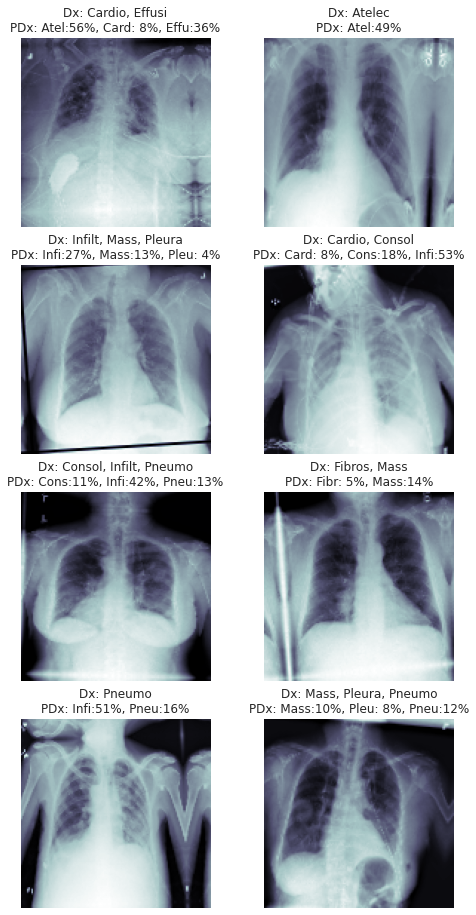

In [ ]:
# Show a few images and associated predictions
# https://www.kaggle.com/code/shrikantds/cnn-in-nih-dataset

sickest_idx = np.argsort(np.sum(test_Y, 1)<1)
fig, m_axs = plt.subplots(4, 2, figsize = (8, 16))
for (idx, c_ax) in zip(sickest_idx, m_axs.flatten()):
    c_ax.imshow(test_X[idx, :,:,0], cmap = 'bone')
    stat_str = [n_class[:6] for n_class, n_score in zip(all_labels, test_Y[idx]) if n_score>0.5]
    pred_str = ['%s:%2.0f%%' % (n_class[:4], p_score*100)  for n_class, n_score, p_score in zip(all_labels,
                                                                                                test_Y[idx], y_pred[idx]) 
    if (n_score>0.5) or (p_score>0.5)]
    c_ax.set_title('Dx: '+', '.join(stat_str)+'\nPDx: '+', '.join(pred_str))
    c_ax.axis('off')
fig.savefig('trained_img_predictions.png')

# Model 8: CNN 2 layers (256, 512 - with regularization)

## Build and Compile Model

In [ ]:
model = models.Sequential()
model.add(layers.Conv2D(filters=256, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu,input_shape=t_x.shape[1:]))
model.add(layers.MaxPool2D((2, 2),strides=2))
model.add(layers.Dropout(0.3))
model.add(layers.Conv2D(filters=512, kernel_size=(3, 3), strides=(1, 1), activation=tf.nn.relu))
model.add(layers.MaxPool2D(pool_size=(2, 2),strides=2))
model.add(layers.Dropout(0.3))
model.add(layers.Flatten())
model.add(layers.Dense(units=384, activation=tf.nn.relu))
model.add(layers.Dense(units=len(all_labels), activation='sigmoid'))

model.compile(optimizer = 'adam', loss = 'binary_crossentropy',
              metrics = ['binary_accuracy', keras.metrics.Recall()])

model.summary()


Model: "sequential_43"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_128 (Conv2D)         (None, 126, 126, 256)     2560      
                                                                 
 max_pooling2d_128 (MaxPooli  (None, 63, 63, 256)      0         
 ng2D)                                                           
                                                                 
 dropout_11 (Dropout)        (None, 63, 63, 256)       0         
                                                                 
 conv2d_129 (Conv2D)         (None, 61, 61, 512)       1180160   
                                                                 
 max_pooling2d_129 (MaxPooli  (None, 30, 30, 512)      0         
 ng2D)                                                           
                                                                 
 dropout_12 (Dropout)        (None, 30, 30, 512)     

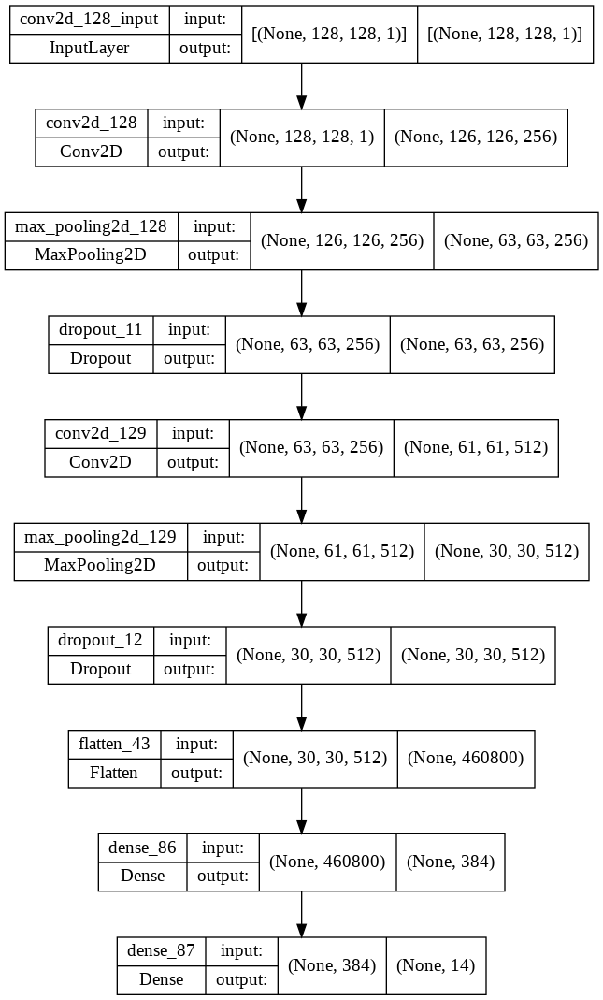

In [ ]:
keras.utils.plot_model(model, "model8.png", show_shapes=True)

## Train Model

In [ ]:
%%time 
history = model.fit_generator(train_gen, 
                              steps_per_epoch=100,
                              validation_data = valid_gen, 
                              epochs = 20,
                              callbacks=[
                                  tf.keras.callbacks.ModelCheckpoint("model8.h5",save_best_only=True,save_weights_only=False),
                                  tf.keras.callbacks.EarlyStopping(monitor='val_binary_accuracy', patience=10)
                              ])

Epoch 1/20
100/100 [==============================] - 133s 1s/step - loss: 0.4095 - binary_accuracy: 0.8803 - recall_26: 0.0574 - val_loss: 0.3024 - val_binary_accuracy: 0.8882 - val_recall_26: 0.0060
Epoch 2/20
100/100 [==============================] - 133s 1s/step - loss: 0.3024 - binary_accuracy: 0.8877 - recall_26: 0.0214 - val_loss: 0.2997 - val_binary_accuracy: 0.8869 - val_recall_26: 0.0766
Epoch 3/20
100/100 [==============================] - 143s 1s/step - loss: 0.2995 - binary_accuracy: 0.8878 - recall_26: 0.0339 - val_loss: 0.2988 - val_binary_accuracy: 0.8883 - val_recall_26: 0.0161
Epoch 4/20
100/100 [==============================] - 138s 1s/step - loss: 0.2996 - binary_accuracy: 0.8868 - recall_26: 0.0320 - val_loss: 0.3038 - val_binary_accuracy: 0.8883 - val_recall_26: 0.0110
Epoch 5/20
100/100 [==============================] - 119s 1s/step - loss: 0.2990 - binary_accuracy: 0.8890 - recall_26: 0.0201 - val_loss: 0.2990 - val_binary_accuracy: 0.8883 - val_recall_26: 0.

## Test Model

In [ ]:
print('test binary accuracy = ', model.evaluate(test_X, test_Y, verbose=0)[1])

test binary accuracy =  0.8869978189468384


## Training & Validation Plots

In [ ]:
history_dict = history.history
history_dict.keys()

dict_keys(['loss', 'binary_accuracy', 'recall_26', 'val_loss', 'val_binary_accuracy', 'val_recall_26'])

In [ ]:
history_df=pd.DataFrame(history_dict)
history_df.tail().round(3)

,loss,binary_accuracy,recall_26,val_loss,val_binary_accuracy,val_recall_26
11,0.298,0.887,0.037,0.295,0.888,0.014
12,0.297,0.888,0.030,0.296,0.888,0.023
13,0.292,0.888,0.038,0.295,0.889,0.044
14,0.295,0.889,0.057,0.295,0.887,0.101
15,0.295,0.889,0.048,0.298,0.888,0.017


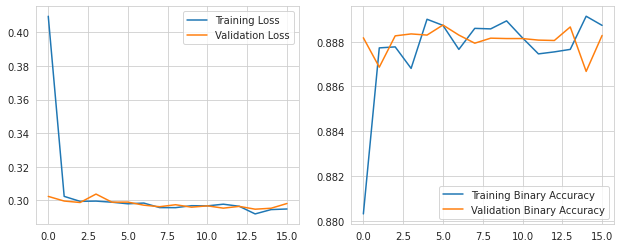

In [ ]:
plot_history(history)

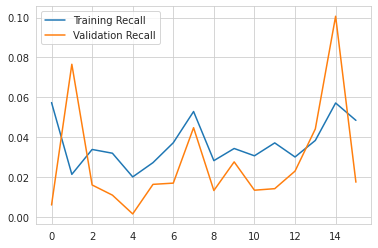

In [ ]:
recall = history.history['recall_26']
val_recall = history.history['val_recall_26']
epochs = len(history.history['loss'])

plt.figure(figsize=(6, 4))
for i, metrics in enumerate(zip([recall], [val_recall],['Recall'])):
  plt.plot(range(epochs), metrics[0], label='Training {}'.format(metrics[2]))
  plt.plot(range(epochs), metrics[1], label='Validation {}'.format(metrics[2]))
  plt.legend()
plt.show()

## ROC Curve & AUC

32/32 [==============================] - 1s 31ms/step


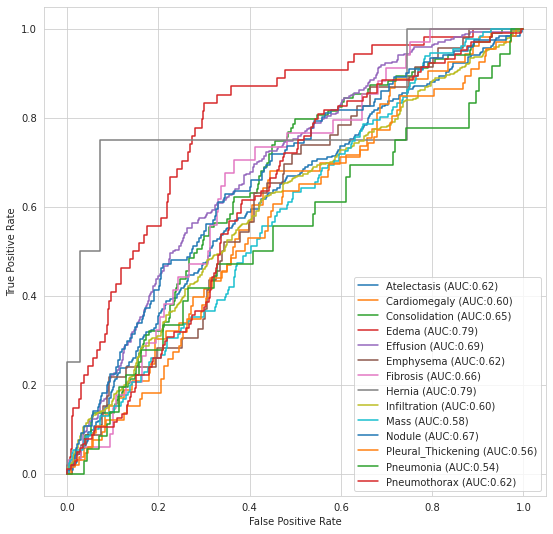

In [ ]:
y_pred = model.predict(test_X, verbose = True)

fig, c_ax = plt.subplots(1,1, figsize = (9, 9))
for (idx, c_label) in enumerate(all_labels):
    fpr, tpr, thresholds = roc_curve(test_Y[:,idx].astype(int), y_pred[:,idx])
    c_ax.plot(fpr, tpr, label = '%s (AUC:%0.2f)'  % (c_label, auc(fpr, tpr)))
c_ax.legend()
c_ax.set_xlabel('False Positive Rate')
c_ax.set_ylabel('True Positive Rate')
fig.savefig('trained_net.png')

# hernia has low sample

In [ ]:
print('roc score = ', roc_auc_score(test_Y.astype(int), y_pred))

roc score =  0.6427071776391015


## Confusion Matrix - 50% Threshold

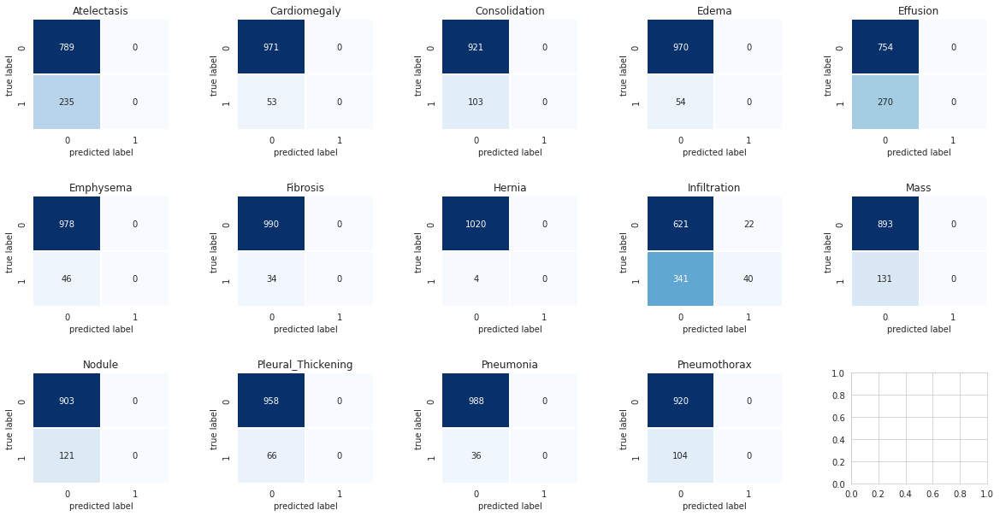

In [ ]:
y_pred_cat = np.where(y_pred > 0.5, 1, 0)

plot_confusion_matrix(test_Y, y_pred_cat)

In [ ]:
print(classification_report(test_Y, y_pred_cat, target_names=all_labels))

                    precision    recall  f1-score   support

       Atelectasis       0.00      0.00      0.00       235
      Cardiomegaly       0.00      0.00      0.00        53
     Consolidation       0.00      0.00      0.00       103
             Edema       0.00      0.00      0.00        54
          Effusion       0.00      0.00      0.00       270
         Emphysema       0.00      0.00      0.00        46
          Fibrosis       0.00      0.00      0.00        34
            Hernia       0.00      0.00      0.00         4
      Infiltration       0.65      0.10      0.18       381
              Mass       0.00      0.00      0.00       131
            Nodule       0.00      0.00      0.00       121
Pleural_Thickening       0.00      0.00      0.00        66
         Pneumonia       0.00      0.00      0.00        36
      Pneumothorax       0.00      0.00      0.00       104

         micro avg       0.65      0.02      0.05      1638
         macro avg       0.05      0.0

## Confusion Matrix - 20% Threshold

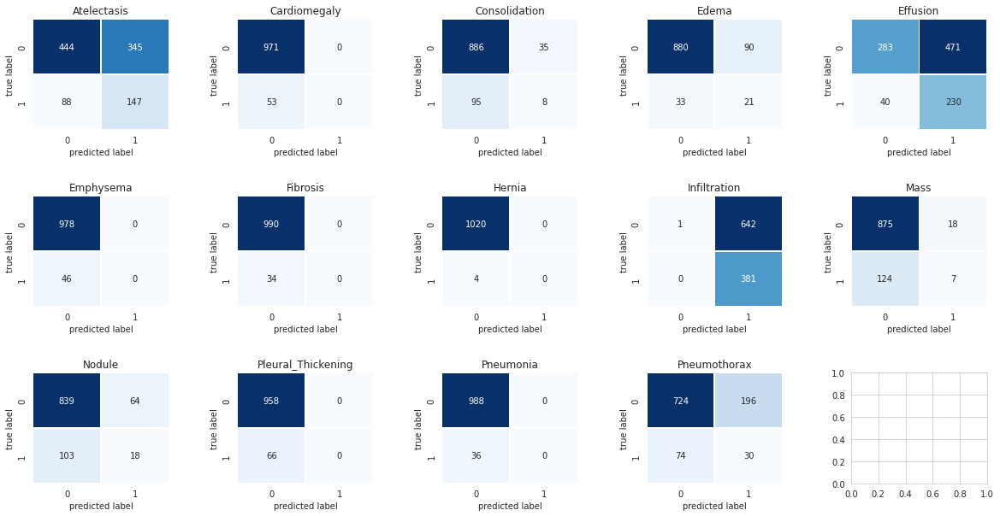

In [ ]:
y_pred_cat = np.where(y_pred > 0.2, 1, 0)

plot_confusion_matrix(test_Y, y_pred_cat)

In [ ]:
print(classification_report(test_Y, y_pred_cat, target_names=all_labels))

                    precision    recall  f1-score   support

       Atelectasis       0.30      0.63      0.40       235
      Cardiomegaly       0.00      0.00      0.00        53
     Consolidation       0.19      0.08      0.11       103
             Edema       0.19      0.39      0.25        54
          Effusion       0.33      0.85      0.47       270
         Emphysema       0.00      0.00      0.00        46
          Fibrosis       0.00      0.00      0.00        34
            Hernia       0.00      0.00      0.00         4
      Infiltration       0.37      1.00      0.54       381
              Mass       0.28      0.05      0.09       131
            Nodule       0.22      0.15      0.18       121
Pleural_Thickening       0.00      0.00      0.00        66
         Pneumonia       0.00      0.00      0.00        36
      Pneumothorax       0.13      0.29      0.18       104

         micro avg       0.31      0.51      0.39      1638
         macro avg       0.14      0.2

## Sample Predictions

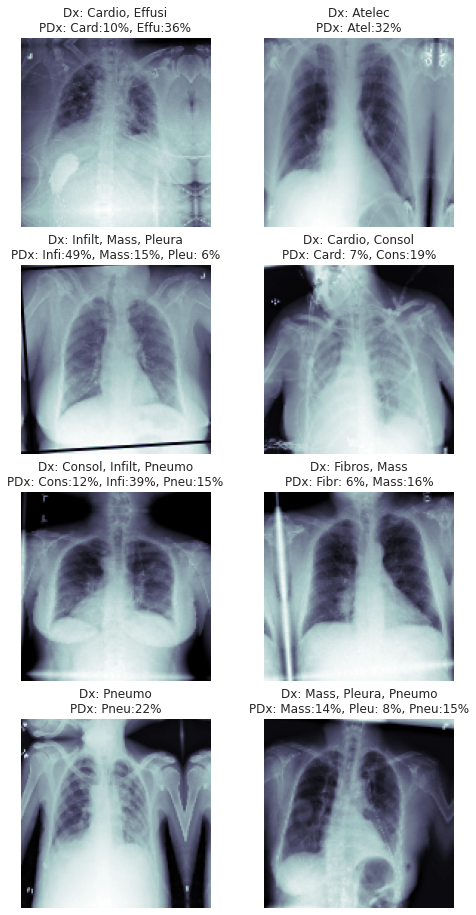

In [ ]:
# Show a few images and associated predictions
# https://www.kaggle.com/code/shrikantds/cnn-in-nih-dataset

sickest_idx = np.argsort(np.sum(test_Y, 1)<1)
fig, m_axs = plt.subplots(4, 2, figsize = (8, 16))
for (idx, c_ax) in zip(sickest_idx, m_axs.flatten()):
    c_ax.imshow(test_X[idx, :,:,0], cmap = 'bone')
    stat_str = [n_class[:6] for n_class, n_score in zip(all_labels, test_Y[idx]) if n_score>0.5]
    pred_str = ['%s:%2.0f%%' % (n_class[:4], p_score*100)  for n_class, n_score, p_score in zip(all_labels,
                                                                                                test_Y[idx], y_pred[idx]) 
    if (n_score>0.5) or (p_score>0.5)]
    c_ax.set_title('Dx: '+', '.join(stat_str)+'\nPDx: '+', '.join(pred_str))
    c_ax.axis('off')
fig.savefig('trained_img_predictions.png')

# Model 9: MobileNet

## Build and Compile Model

In [ ]:
mobilenet_model = MobileNet(input_shape =  t_x.shape[1:], 
                                 include_top = False, weights = None)
model = Sequential()
model.add(mobilenet_model)
model.add(GlobalAveragePooling2D())
model.add(Dropout(0.5))
model.add(Dense(512))
model.add(Dropout(0.5))
model.add(Dense(len(all_labels), activation = 'sigmoid'))

model.compile(optimizer = 'adam', loss = 'binary_crossentropy',
              metrics = ['binary_accuracy', keras.metrics.Recall()])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_128 (Functio  (None, 4, 4, 1024)       3228288   
 nal)                                                            
                                                                 
 global_average_pooling2d (G  (None, 1024)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                                 
 dense (Dense)               (None, 512)               524800    
                                                                 
 dropout_1 (Dropout)         (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 14)                7

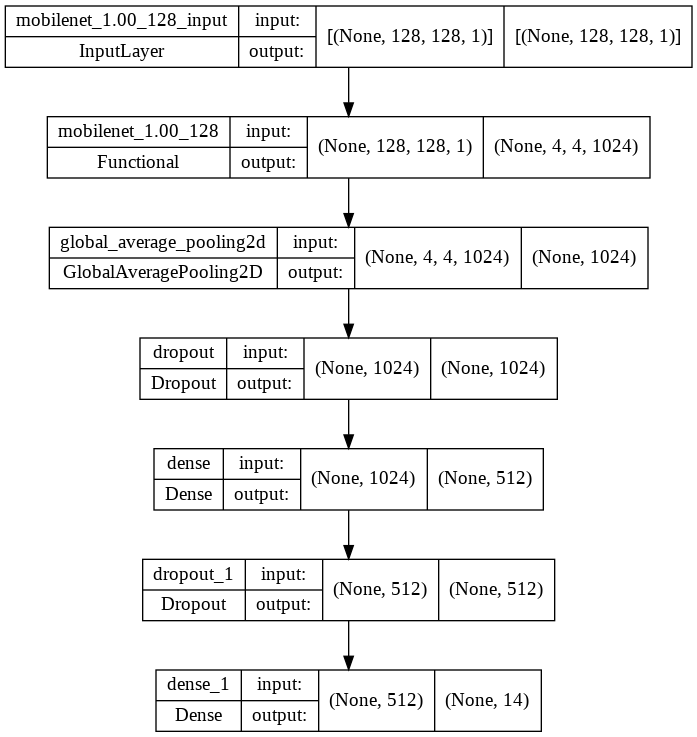

In [ ]:
keras.utils.plot_model(model, "model9.png", show_shapes=True)

## Train Model

In [ ]:
%%time 
history = model.fit_generator(train_gen, 
                              steps_per_epoch=100,
                              validation_data = valid_gen, 
                              epochs = 20,
                              callbacks=[
                                  tf.keras.callbacks.ModelCheckpoint("model9.h5",save_best_only=True,save_weights_only=False),
                                  tf.keras.callbacks.EarlyStopping(monitor='val_binary_accuracy', patience=10)
                              ])

Epoch 1/20
100/100 [==============================] - 172s 2s/step - loss: 0.4131 - binary_accuracy: 0.8631 - recall: 0.1287 - val_loss: 0.3109 - val_binary_accuracy: 0.8883 - val_recall: 0.0000e+00
Epoch 2/20
100/100 [==============================] - 135s 1s/step - loss: 0.3426 - binary_accuracy: 0.8757 - recall: 0.0866 - val_loss: 0.3501 - val_binary_accuracy: 0.8883 - val_recall: 0.0000e+00
Epoch 3/20
100/100 [==============================] - 133s 1s/step - loss: 0.3239 - binary_accuracy: 0.8823 - recall: 0.0642 - val_loss: 0.3975 - val_binary_accuracy: 0.8883 - val_recall: 0.0000e+00
Epoch 4/20
100/100 [==============================] - 134s 1s/step - loss: 0.3173 - binary_accuracy: 0.8836 - recall: 0.0477 - val_loss: 0.3956 - val_binary_accuracy: 0.8883 - val_recall: 0.0000e+00
Epoch 5/20
100/100 [==============================] - 132s 1s/step - loss: 0.3101 - binary_accuracy: 0.8842 - recall: 0.0503 - val_loss: 0.3718 - val_binary_accuracy: 0.8883 - val_recall: 0.0000e+00
Epoch

## Test Model

In [ ]:
print('test binary accuracy = ', model.evaluate(test_X, test_Y, verbose=0)[1])

test binary accuracy =  0.886997640132904


## Training & Validation Plots

In [ ]:
history_dict = history.history
history_dict.keys()

dict_keys(['loss', 'binary_accuracy', 'recall', 'val_loss', 'val_binary_accuracy', 'val_recall'])

In [ ]:
history_df=pd.DataFrame(history_dict)
history_df.tail().round(3)

,loss,binary_accuracy,recall,val_loss,val_binary_accuracy,val_recall
15,0.302,0.886,0.031,0.299,0.889,0.025
16,0.294,0.890,0.044,0.295,0.889,0.036
17,0.299,0.889,0.041,0.298,0.888,0.008
18,0.297,0.888,0.041,0.302,0.886,0.117
19,0.303,0.885,0.033,0.300,0.889,0.039


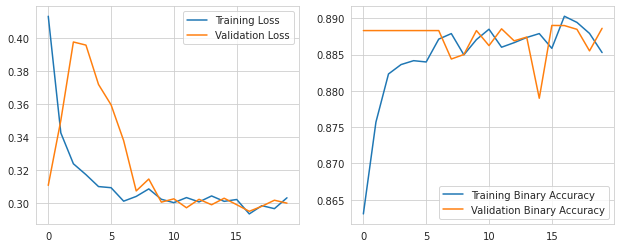

In [ ]:
plot_history(history)

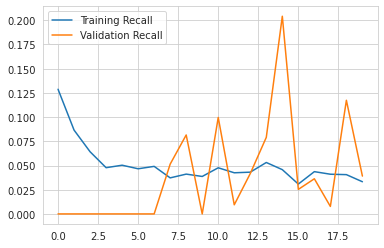

In [ ]:
recall = history.history['recall']
val_recall = history.history['val_recall']
epochs = len(history.history['loss'])

plt.figure(figsize=(6, 4))
for i, metrics in enumerate(zip([recall], [val_recall],['Recall'])):
  plt.plot(range(epochs), metrics[0], label='Training {}'.format(metrics[2]))
  plt.plot(range(epochs), metrics[1], label='Validation {}'.format(metrics[2]))
  plt.legend()
plt.show()

## ROC Curve & AUC

32/32 [==============================] - 1s 9ms/step


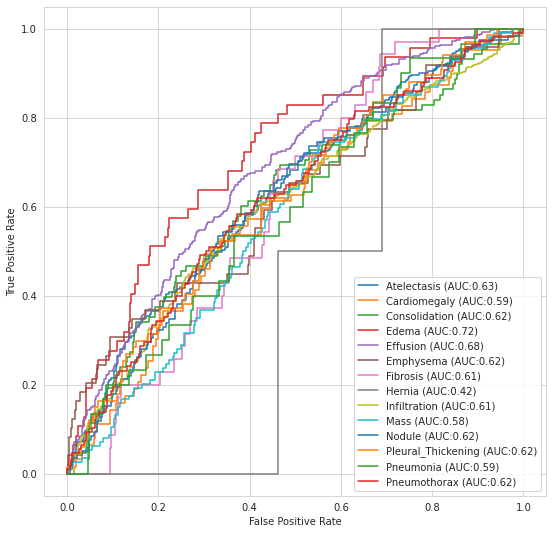

In [ ]:
y_pred = model.predict(test_X, verbose = True)

fig, c_ax = plt.subplots(1,1, figsize = (9, 9))
for (idx, c_label) in enumerate(all_labels):
    fpr, tpr, thresholds = roc_curve(test_Y[:,idx].astype(int), y_pred[:,idx])
    c_ax.plot(fpr, tpr, label = '%s (AUC:%0.2f)'  % (c_label, auc(fpr, tpr)))
c_ax.legend()
c_ax.set_xlabel('False Positive Rate')
c_ax.set_ylabel('True Positive Rate')
fig.savefig('trained_net.png')

# hernia has low sample

In [ ]:
print('roc score = ', roc_auc_score(test_Y.astype(int), y_pred))

roc score =  0.609789958184316


## Confusion Matrix - 50% Threshold

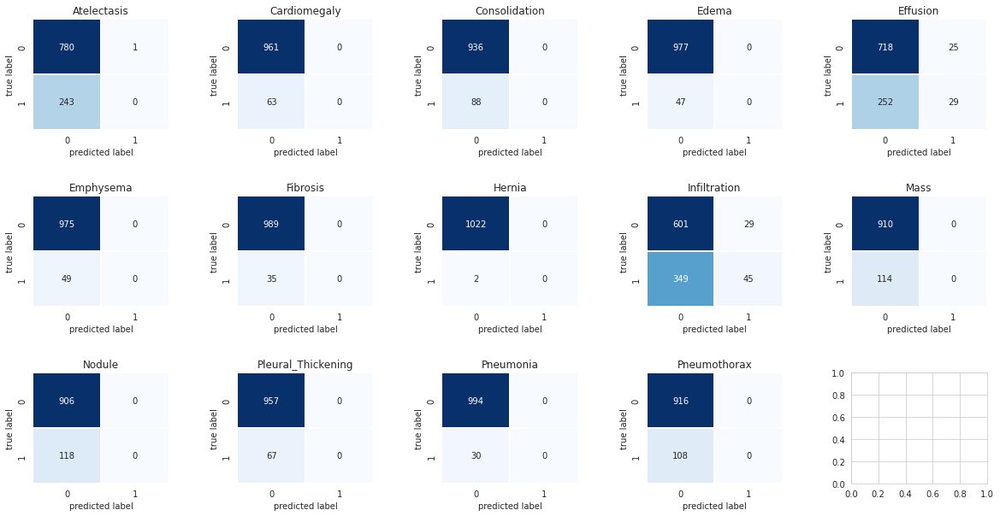

In [ ]:
y_pred_cat = np.where(y_pred > 0.5, 1, 0)

plot_confusion_matrix(test_Y, y_pred_cat)

In [ ]:
print(classification_report(test_Y, y_pred_cat, target_names=all_labels))

                    precision    recall  f1-score   support

       Atelectasis       0.00      0.00      0.00       243
      Cardiomegaly       0.00      0.00      0.00        63
     Consolidation       0.00      0.00      0.00        88
             Edema       0.00      0.00      0.00        47
          Effusion       0.54      0.10      0.17       281
         Emphysema       0.00      0.00      0.00        49
          Fibrosis       0.00      0.00      0.00        35
            Hernia       0.00      0.00      0.00         2
      Infiltration       0.61      0.11      0.19       394
              Mass       0.00      0.00      0.00       114
            Nodule       0.00      0.00      0.00       118
Pleural_Thickening       0.00      0.00      0.00        67
         Pneumonia       0.00      0.00      0.00        30
      Pneumothorax       0.00      0.00      0.00       108

         micro avg       0.57      0.05      0.08      1639
         macro avg       0.08      0.0

## Confusion Matrix - 20% Threshold

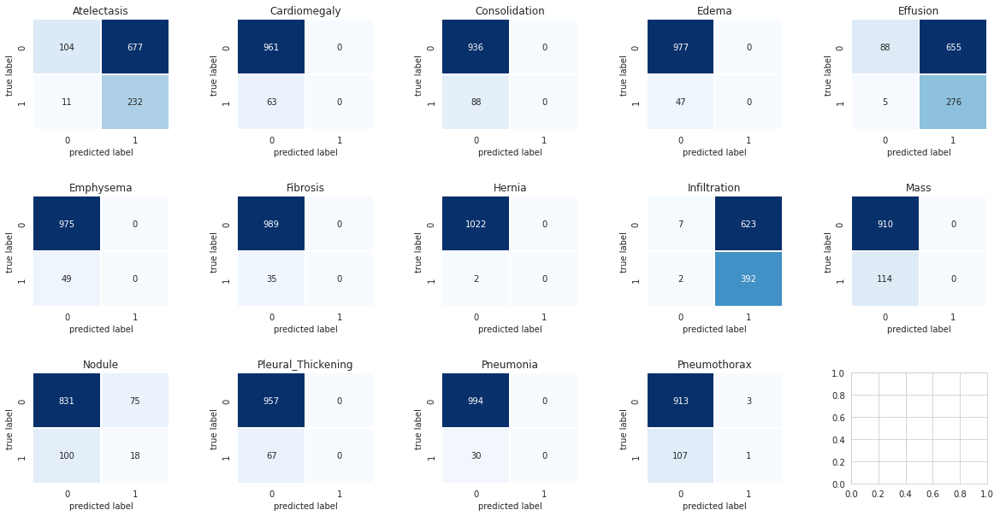

In [ ]:
y_pred_cat = np.where(y_pred > 0.2, 1, 0)

plot_confusion_matrix(test_Y, y_pred_cat)

In [ ]:
print(classification_report(test_Y, y_pred_cat, target_names=all_labels))

                    precision    recall  f1-score   support

       Atelectasis       0.26      0.95      0.40       243
      Cardiomegaly       0.00      0.00      0.00        63
     Consolidation       0.00      0.00      0.00        88
             Edema       0.00      0.00      0.00        47
          Effusion       0.30      0.98      0.46       281
         Emphysema       0.00      0.00      0.00        49
          Fibrosis       0.00      0.00      0.00        35
            Hernia       0.00      0.00      0.00         2
      Infiltration       0.39      0.99      0.56       394
              Mass       0.00      0.00      0.00       114
            Nodule       0.19      0.15      0.17       118
Pleural_Thickening       0.00      0.00      0.00        67
         Pneumonia       0.00      0.00      0.00        30
      Pneumothorax       0.25      0.01      0.02       108

         micro avg       0.31      0.56      0.40      1639
         macro avg       0.10      0.2

## Sample Predictions

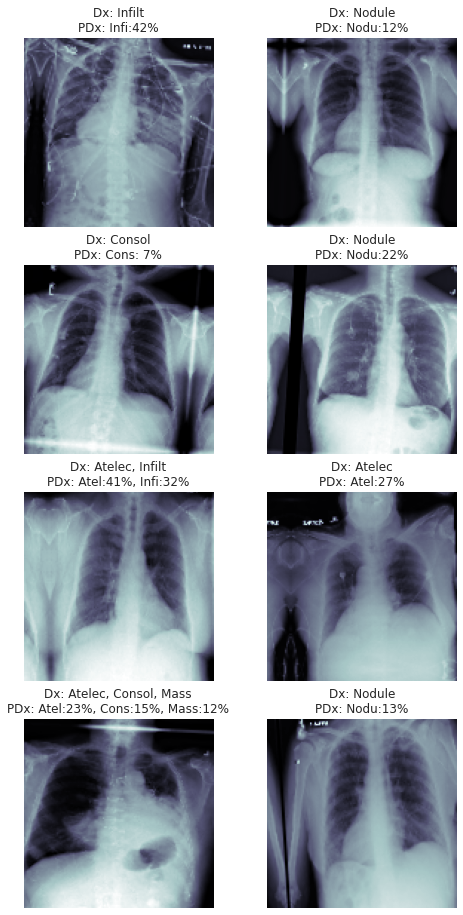

In [ ]:
# Show a few images and associated predictions
# https://www.kaggle.com/code/shrikantds/cnn-in-nih-dataset

sickest_idx = np.argsort(np.sum(test_Y, 1)<1)
fig, m_axs = plt.subplots(4, 2, figsize = (8, 16))
for (idx, c_ax) in zip(sickest_idx, m_axs.flatten()):
    c_ax.imshow(test_X[idx, :,:,0], cmap = 'bone')
    stat_str = [n_class[:6] for n_class, n_score in zip(all_labels, test_Y[idx]) if n_score>0.5]
    pred_str = ['%s:%2.0f%%' % (n_class[:4], p_score*100)  for n_class, n_score, p_score in zip(all_labels,
                                                                                                test_Y[idx], y_pred[idx]) 
    if (n_score>0.5) or (p_score>0.5)]
    c_ax.set_title('Dx: '+', '.join(stat_str)+'\nPDx: '+', '.join(pred_str))
    c_ax.axis('off')
fig.savefig('trained_img_predictions.png')

# Model 10: DenseNet

## Image Generator & Flow from Dataframe

In [ ]:
IMG_SIZE = (224, 224) # slightly smaller than vgg16 normally expects

train_gen = core_idg.flow_from_dataframe(dataframe=train_df,
                                         directory=None,
                                         x_col = 'path',
                                         y_col = 'newLabel',
                                         class_mode = 'categorical',
                                         classes = all_labels,
                                         target_size = IMG_SIZE,
                                         color_mode = 'rgb',
                                         batch_size = 32)

valid_gen = core_idg.flow_from_dataframe(dataframe=valid_df,
                                         directory=None,
                                         x_col = 'path',
                                         y_col = 'newLabel',
                                         class_mode = 'categorical',
                                         classes = all_labels,
                                         target_size = IMG_SIZE,
                                         color_mode = 'rgb',
                                         batch_size = 256) # we can use much larger batches for evaluation

test_X, test_Y = next(core_idg.flow_from_dataframe(dataframe=test_df,
                                                   directory=None,
                                                   x_col = 'path',
                                                   y_col = 'newLabel',
                                                   class_mode = 'categorical',
                                                   classes = all_labels,
                                                   target_size = IMG_SIZE,
                                                   color_mode = 'rgb',
                                                   batch_size = 1024))

Found 37266 validated image filenames belonging to 14 classes.
Found 4141 validated image filenames belonging to 14 classes.
Found 10352 validated image filenames belonging to 14 classes.


In [ ]:
t_x, t_y = next(train_gen)

## Build and Compile Model

In [ ]:
# dense net model
img_in = Input(t_x.shape[1:])              # input of model 
model = DenseNet121(include_top= False , # remove  the 3 fully-connected layers at the top of the network
                weights='imagenet',      # pre train weight 
                input_tensor= img_in, 
                input_shape= t_x.shape[1:],
                pooling ='avg') 

x = model.output  
predictions = Dense(len(all_labels), activation="sigmoid", name="predictions")(x)    # fully connected layer for predict class 
model = Model(inputs=img_in, outputs=predictions)
model.summary()

model.compile(optimizer='adam', loss="binary_crossentropy", metrics=['binary_accuracy', keras.metrics.Recall()])

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d_4 (ZeroPadding2  (None, 230, 230, 3)  0          ['input_5[0][0]']                
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (None, 112, 112, 64  9408        ['zero_padding2d_4[0][0]']       
                                )                                                           

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.690719 to fit



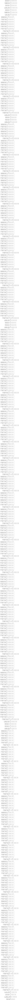

In [ ]:
keras.utils.plot_model(model, "model10.png", show_shapes=True)

## Train Model

In [ ]:
%%time 
history = model.fit_generator(train_gen, 
                              steps_per_epoch=100,
                              validation_data = valid_gen, 
                              epochs = 20,
                              callbacks=[
                                  tf.keras.callbacks.ModelCheckpoint("model10.h5",save_best_only=True,save_weights_only=False),
                                  tf.keras.callbacks.EarlyStopping(monitor='val_binary_accuracy', patience=10)
                              ])

Epoch 1/20
100/100 [==============================] - 261s 2s/step - loss: 0.3252 - binary_accuracy: 0.8740 - recall_1: 0.0438 - val_loss: 0.6322 - val_binary_accuracy: 0.8125 - val_recall_1: 0.3572
Epoch 2/20
100/100 [==============================] - 216s 2s/step - loss: 0.2965 - binary_accuracy: 0.8890 - recall_1: 0.0301 - val_loss: 0.3109 - val_binary_accuracy: 0.8768 - val_recall_1: 0.1232
Epoch 3/20
100/100 [==============================] - 212s 2s/step - loss: 0.2969 - binary_accuracy: 0.8869 - recall_1: 0.0722 - val_loss: 0.3224 - val_binary_accuracy: 0.8864 - val_recall_1: 0.1191
Epoch 4/20
100/100 [==============================] - 213s 2s/step - loss: 0.2914 - binary_accuracy: 0.8889 - recall_1: 0.0825 - val_loss: 0.3161 - val_binary_accuracy: 0.8835 - val_recall_1: 0.0945
Epoch 5/20
100/100 [==============================] - 213s 2s/step - loss: 0.2922 - binary_accuracy: 0.8892 - recall_1: 0.1040 - val_loss: 0.3525 - val_binary_accuracy: 0.8883 - val_recall_1: 9.2650e-04
E

## Test Model

In [ ]:
print('test binary accuracy = ', model.evaluate(test_X, test_Y, verbose=0)[1])

test binary accuracy =  0.8914620280265808


## Training & Validation Plots

In [ ]:
history_dict = history.history
history_dict.keys()

dict_keys(['loss', 'binary_accuracy', 'recall_1', 'val_loss', 'val_binary_accuracy', 'val_recall_1'])

In [ ]:
history_df=pd.DataFrame(history_dict)
history_df.tail().round(3)

,loss,binary_accuracy,recall_1,val_loss,val_binary_accuracy,val_recall_1
15,0.276,0.892,0.157,0.282,0.891,0.169
16,0.276,0.894,0.160,0.294,0.891,0.118
17,0.275,0.895,0.170,0.298,0.887,0.129
18,0.272,0.894,0.176,0.313,0.879,0.305
19,0.277,0.893,0.172,0.291,0.891,0.104


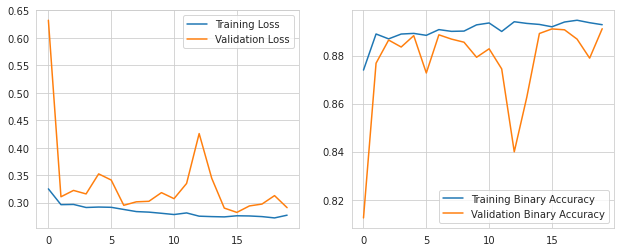

In [ ]:
plot_history(history)

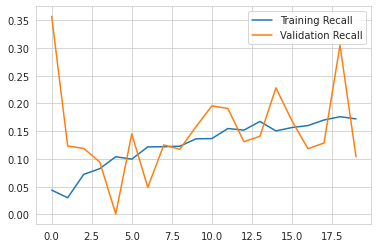

In [ ]:
recall = history.history['recall_1']
val_recall = history.history['val_recall_1']
epochs = len(history.history['loss'])

plt.figure(figsize=(6, 4))
for i, metrics in enumerate(zip([recall], [val_recall],['Recall'])):
  plt.plot(range(epochs), metrics[0], label='Training {}'.format(metrics[2]))
  plt.plot(range(epochs), metrics[1], label='Validation {}'.format(metrics[2]))
  plt.legend()
plt.show()

## ROC Curve & AUC

32/32 [==============================] - 7s 82ms/step


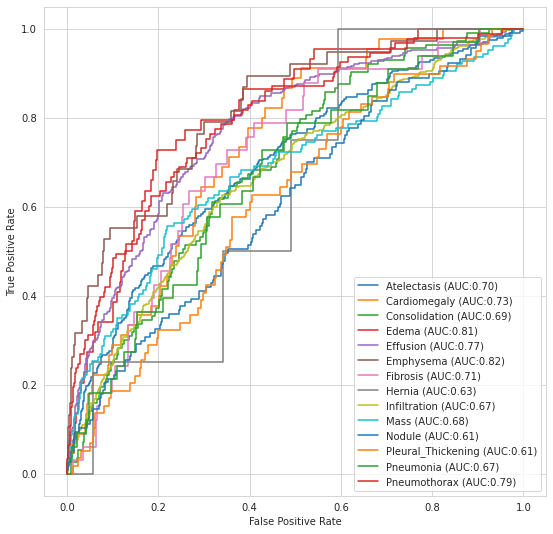

In [ ]:
y_pred = model.predict(test_X, verbose = True)

fig, c_ax = plt.subplots(1,1, figsize = (9, 9))
for (idx, c_label) in enumerate(all_labels):
    fpr, tpr, thresholds = roc_curve(test_Y[:,idx].astype(int), y_pred[:,idx])
    c_ax.plot(fpr, tpr, label = '%s (AUC:%0.2f)'  % (c_label, auc(fpr, tpr)))
c_ax.legend()
c_ax.set_xlabel('False Positive Rate')
c_ax.set_ylabel('True Positive Rate')
fig.savefig('trained_net.png')

# hernia has low sample

In [ ]:
print('roc score = ', roc_auc_score(test_Y.astype(int), y_pred))

roc score =  0.7069939484072023


## Confusion Matrix - 50% Threshold

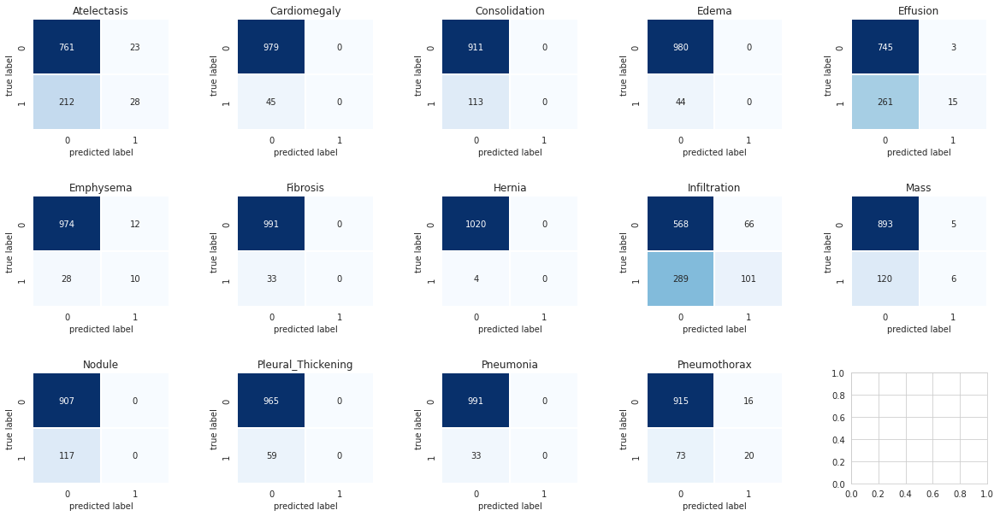

In [ ]:
y_pred_cat = np.where(y_pred > 0.5, 1, 0)

plot_confusion_matrix(test_Y, y_pred_cat)

In [ ]:
print(classification_report(test_Y, y_pred_cat, target_names=all_labels))

                    precision    recall  f1-score   support

       Atelectasis       0.55      0.12      0.19       240
      Cardiomegaly       0.00      0.00      0.00        45
     Consolidation       0.00      0.00      0.00       113
             Edema       0.00      0.00      0.00        44
          Effusion       0.83      0.05      0.10       276
         Emphysema       0.45      0.26      0.33        38
          Fibrosis       0.00      0.00      0.00        33
            Hernia       0.00      0.00      0.00         4
      Infiltration       0.60      0.26      0.36       390
              Mass       0.55      0.05      0.09       126
            Nodule       0.00      0.00      0.00       117
Pleural_Thickening       0.00      0.00      0.00        59
         Pneumonia       0.00      0.00      0.00        33
      Pneumothorax       0.56      0.22      0.31        93

         micro avg       0.59      0.11      0.19      1611
         macro avg       0.25      0.0

## Confusion Matrix - 20% Threshold

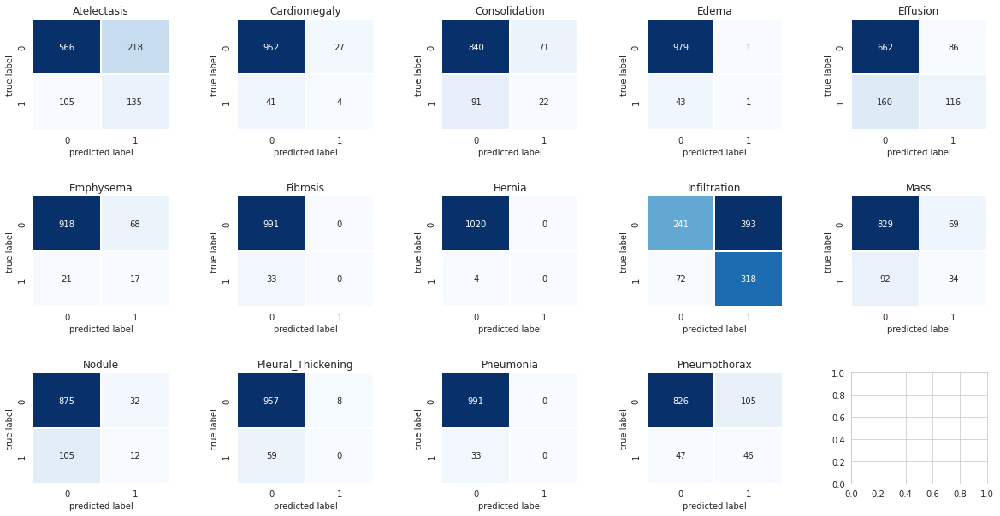

In [ ]:
y_pred_cat = np.where(y_pred > 0.2, 1, 0)

plot_confusion_matrix(test_Y, y_pred_cat)

In [ ]:
print(classification_report(test_Y, y_pred_cat, target_names=all_labels))

                    precision    recall  f1-score   support

       Atelectasis       0.38      0.56      0.46       240
      Cardiomegaly       0.13      0.09      0.11        45
     Consolidation       0.24      0.19      0.21       113
             Edema       0.50      0.02      0.04        44
          Effusion       0.57      0.42      0.49       276
         Emphysema       0.20      0.45      0.28        38
          Fibrosis       0.00      0.00      0.00        33
            Hernia       0.00      0.00      0.00         4
      Infiltration       0.45      0.82      0.58       390
              Mass       0.33      0.27      0.30       126
            Nodule       0.27      0.10      0.15       117
Pleural_Thickening       0.00      0.00      0.00        59
         Pneumonia       0.00      0.00      0.00        33
      Pneumothorax       0.30      0.49      0.38        93

         micro avg       0.40      0.44      0.42      1611
         macro avg       0.24      0.2

## Sample Predictions

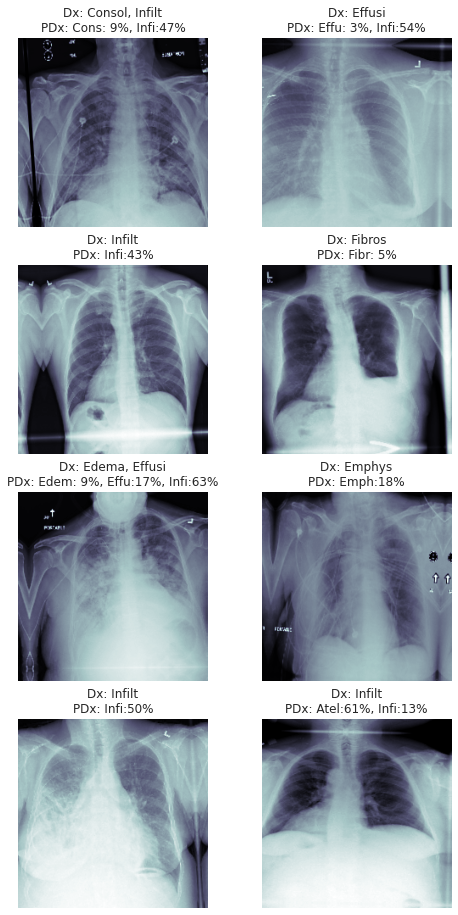

In [ ]:
# Show a few images and associated predictions
# https://www.kaggle.com/code/shrikantds/cnn-in-nih-dataset

sickest_idx = np.argsort(np.sum(test_Y, 1)<1)
fig, m_axs = plt.subplots(4, 2, figsize = (8, 16))
for (idx, c_ax) in zip(sickest_idx, m_axs.flatten()):
    c_ax.imshow(test_X[idx, :,:,0], cmap = 'bone')
    stat_str = [n_class[:6] for n_class, n_score in zip(all_labels, test_Y[idx]) if n_score>0.5]
    pred_str = ['%s:%2.0f%%' % (n_class[:4], p_score*100)  for n_class, n_score, p_score in zip(all_labels,
                                                                                                test_Y[idx], y_pred[idx]) 
    if (n_score>0.5) or (p_score>0.5)]
    c_ax.set_title('Dx: '+', '.join(stat_str)+'\nPDx: '+', '.join(pred_str))
    c_ax.axis('off')
fig.savefig('trained_img_predictions.png')

# Model 11: DenseNet - more epochs

## Reload Model

In [ ]:
# loading the saved model
loaded_model = tf.keras.models.load_model('/content/model10.h5')

## Train Model

In [ ]:
# retraining the model
%%time 
history = loaded_model.fit_generator(train_gen, 
                              steps_per_epoch=100,
                              validation_data = valid_gen, 
                              epochs = 20,
                              callbacks=[
                                  tf.keras.callbacks.ModelCheckpoint("model10v2.h5",save_best_only=True,save_weights_only=False),
                                  tf.keras.callbacks.EarlyStopping(monitor='val_binary_accuracy', patience=10)
                              ])

Epoch 1/20
100/100 [==============================] - 236s 2s/step - loss: 0.2750 - binary_accuracy: 0.8938 - recall_1: 0.1640 - val_loss: 0.2972 - val_binary_accuracy: 0.8868 - val_recall_1: 0.0950
Epoch 2/20
100/100 [==============================] - 219s 2s/step - loss: 0.2785 - binary_accuracy: 0.8911 - recall_1: 0.1640 - val_loss: 0.2924 - val_binary_accuracy: 0.8879 - val_recall_1: 0.1564
Epoch 3/20
100/100 [==============================] - 216s 2s/step - loss: 0.2720 - binary_accuracy: 0.8944 - recall_1: 0.1666 - val_loss: 0.3145 - val_binary_accuracy: 0.8795 - val_recall_1: 0.2341
Epoch 4/20
100/100 [==============================] - 217s 2s/step - loss: 0.2736 - binary_accuracy: 0.8930 - recall_1: 0.1739 - val_loss: 0.3069 - val_binary_accuracy: 0.8843 - val_recall_1: 0.1845
Epoch 5/20
100/100 [==============================] - 218s 2s/step - loss: 0.2759 - binary_accuracy: 0.8932 - recall_1: 0.1655 - val_loss: 0.2841 - val_binary_accuracy: 0.8908 - val_recall_1: 0.2085
Epoch

## Test Model

In [ ]:
print('test binary accuracy = ', loaded_model.evaluate(test_X, test_Y, verbose=0)[1])

test binary accuracy =  0.8906947374343872


## Training & Validation Plots

In [ ]:
history_dict = history.history
history_dict.keys()

dict_keys(['loss', 'binary_accuracy', 'recall_1', 'val_loss', 'val_binary_accuracy', 'val_recall_1'])

In [ ]:
history_df=pd.DataFrame(history_dict)
history_df.tail().round(3)

,loss,binary_accuracy,recall_1,val_loss,val_binary_accuracy,val_recall_1
15,0.262,0.897,0.212,0.276,0.895,0.170
16,0.270,0.894,0.208,0.278,0.895,0.215
17,0.263,0.898,0.213,0.297,0.886,0.261
18,0.261,0.898,0.226,0.297,0.884,0.140
19,0.268,0.897,0.228,0.283,0.892,0.171


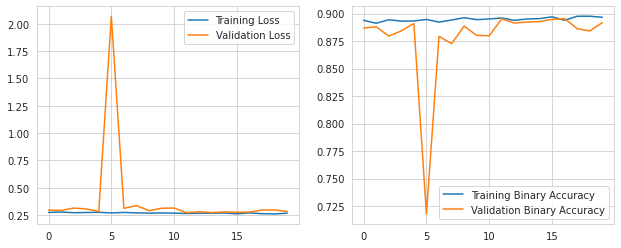

In [ ]:
plot_history(history)

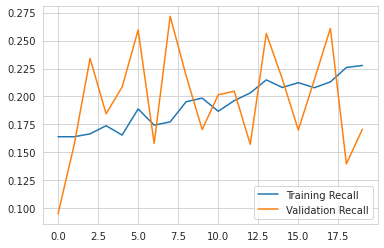

In [ ]:
recall = history.history['recall_1']
val_recall = history.history['val_recall_1']
epochs = len(history.history['loss'])

plt.figure(figsize=(6, 4))
for i, metrics in enumerate(zip([recall], [val_recall],['Recall'])):
  plt.plot(range(epochs), metrics[0], label='Training {}'.format(metrics[2]))
  plt.plot(range(epochs), metrics[1], label='Validation {}'.format(metrics[2]))
  plt.legend()
plt.show()

## ROC Curve & AUC

32/32 [==============================] - 6s 80ms/step


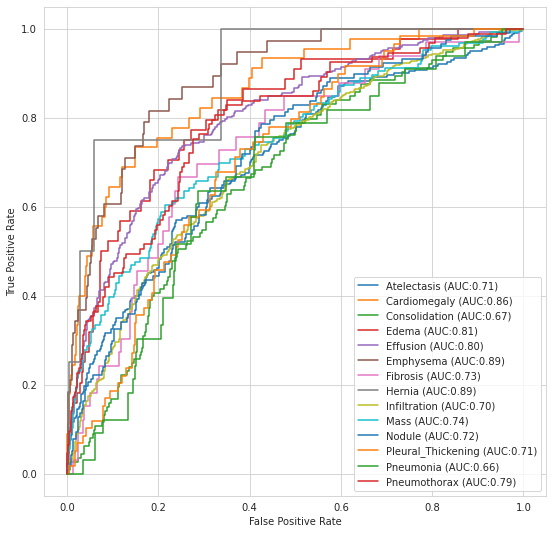

In [ ]:
y_pred = loaded_model.predict(test_X, verbose = True)

fig, c_ax = plt.subplots(1,1, figsize = (9, 9))
for (idx, c_label) in enumerate(all_labels):
    fpr, tpr, thresholds = roc_curve(test_Y[:,idx].astype(int), y_pred[:,idx])
    c_ax.plot(fpr, tpr, label = '%s (AUC:%0.2f)'  % (c_label, auc(fpr, tpr)))
c_ax.legend()
c_ax.set_xlabel('False Positive Rate')
c_ax.set_ylabel('True Positive Rate')
fig.savefig('trained_net.png')

# hernia has low sample

In [ ]:
print('roc score = ', roc_auc_score(test_Y.astype(int), y_pred))

roc score =  0.7628857164983192


## Confusion Matrix - 50% Threshold

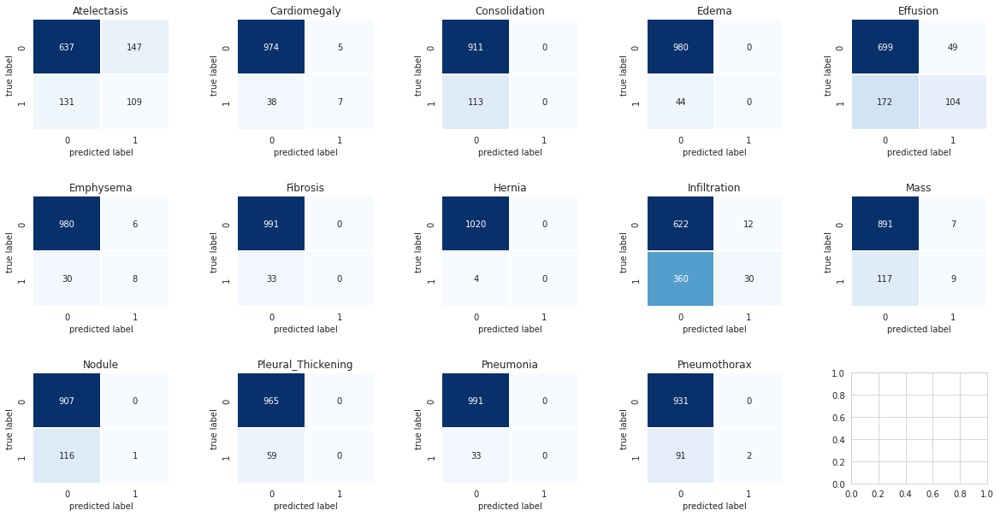

In [ ]:
y_pred_cat = np.where(y_pred > 0.5, 1, 0)

plot_confusion_matrix(test_Y, y_pred_cat)

In [ ]:
print(classification_report(test_Y, y_pred_cat, target_names=all_labels))

                    precision    recall  f1-score   support

       Atelectasis       0.43      0.45      0.44       240
      Cardiomegaly       0.58      0.16      0.25        45
     Consolidation       0.00      0.00      0.00       113
             Edema       0.00      0.00      0.00        44
          Effusion       0.68      0.38      0.48       276
         Emphysema       0.57      0.21      0.31        38
          Fibrosis       0.00      0.00      0.00        33
            Hernia       0.00      0.00      0.00         4
      Infiltration       0.71      0.08      0.14       390
              Mass       0.56      0.07      0.13       126
            Nodule       1.00      0.01      0.02       117
Pleural_Thickening       0.00      0.00      0.00        59
         Pneumonia       0.00      0.00      0.00        33
      Pneumothorax       1.00      0.02      0.04        93

         micro avg       0.54      0.17      0.26      1611
         macro avg       0.40      0.1

## Confusion Matrix - 20% Threshold

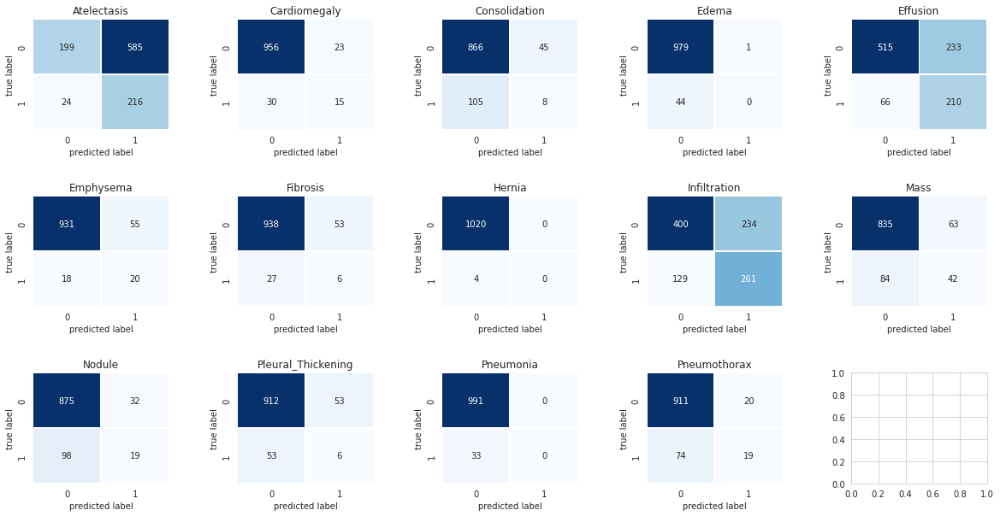

In [ ]:
y_pred_cat = np.where(y_pred > 0.2, 1, 0)

plot_confusion_matrix(test_Y, y_pred_cat)

In [ ]:
print(classification_report(test_Y, y_pred_cat, target_names=all_labels))

                    precision    recall  f1-score   support

       Atelectasis       0.27      0.90      0.41       240
      Cardiomegaly       0.39      0.33      0.36        45
     Consolidation       0.15      0.07      0.10       113
             Edema       0.00      0.00      0.00        44
          Effusion       0.47      0.76      0.58       276
         Emphysema       0.27      0.53      0.35        38
          Fibrosis       0.10      0.18      0.13        33
            Hernia       0.00      0.00      0.00         4
      Infiltration       0.53      0.67      0.59       390
              Mass       0.40      0.33      0.36       126
            Nodule       0.37      0.16      0.23       117
Pleural_Thickening       0.10      0.10      0.10        59
         Pneumonia       0.00      0.00      0.00        33
      Pneumothorax       0.49      0.20      0.29        93

         micro avg       0.37      0.51      0.43      1611
         macro avg       0.25      0.3

## Sample Predictions

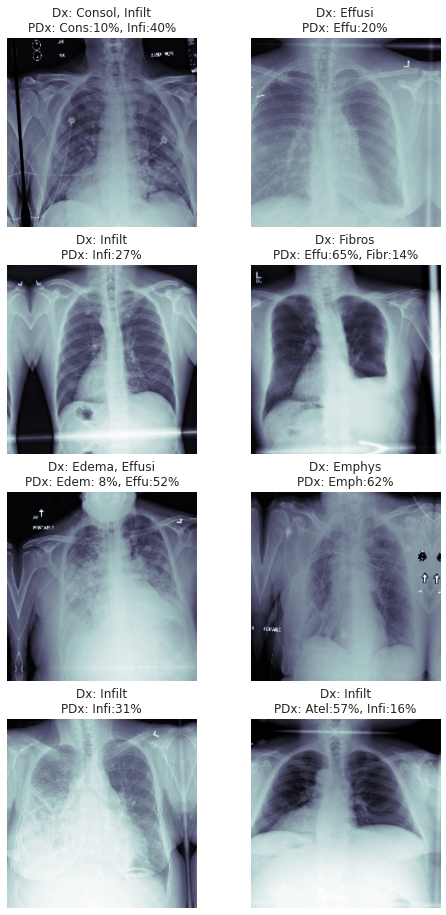

In [ ]:
# Show a few images and associated predictions
# https://www.kaggle.com/code/shrikantds/cnn-in-nih-dataset

sickest_idx = np.argsort(np.sum(test_Y, 1)<1)
fig, m_axs = plt.subplots(4, 2, figsize = (8, 16))
for (idx, c_ax) in zip(sickest_idx, m_axs.flatten()):
    c_ax.imshow(test_X[idx, :,:,0], cmap = 'bone')
    stat_str = [n_class[:6] for n_class, n_score in zip(all_labels, test_Y[idx]) if n_score>0.5]
    pred_str = ['%s:%2.0f%%' % (n_class[:4], p_score*100)  for n_class, n_score, p_score in zip(all_labels,
                                                                                                test_Y[idx], y_pred[idx]) 
    if (n_score>0.5) or (p_score>0.5)]
    c_ax.set_title('Dx: '+', '.join(stat_str)+'\nPDx: '+', '.join(pred_str))
    c_ax.axis('off')
fig.savefig('trained_img_predictions.png')